In [12]:
import os
import sys
sys.path.append('/home/kevinteng/Desktop/DE_Project')
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import tensorflow as tf
from coord_conv import CoordConv
import cv2
import utils
import utils_vis
import utils_model
from sklearn.model_selection import train_test_split
from utils_vis import plot_comparison
from matplotlib.colors import LinearSegmentedColormap, BoundaryNorm
from random import randint, seed
from utils import stack4plot, similarity_multi, similarity_multiplication
from utils_vis import overlapMasks, overlapMasks02

---------------------

# Retrieving and Preprocess Data

Image size:  100


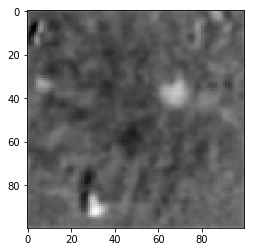

In [13]:
dataset = np.load('/home/kevinteng/Desktop/jpg_to_npy_benchmark/DG13_3-8-17_preprocessed_dF.npy')

#hyperparameter 
NEW_SIZE = 100
ver = '17' #version no.
BATCH_SIZE = 8
lr01 = 0.00001
lr02 = 0.000001
n_neurons = 200
MAX_EPOCHS = 2000
l1_coeff = 0.1
path_desktop = '/home/kevinteng/Desktop/'
#re_list = dataset
re_list = utils.resize(dataset, NEW_SIZE)
IMG_SIZE = re_list.shape[1]

print('Image size: ', IMG_SIZE)
#Dimension for network should include the color channel 
re_list = np.expand_dims(re_list, axis = -1)
#Cast data type to float32 for TensorFlow
# re_list = re_list.astype('float32')
re_list = tf.convert_to_tensor(re_list, dtype = tf.float32)

for img in re_list:
    plt.imshow(np.reshape(img, (IMG_SIZE, IMG_SIZE)), cmap = 'gray')
    plt.show()
    
    break
    
#     if input()=='exit':
#         break

In [14]:
#apply min max norm for mean image
re_list = utils.min_max_norm(re_list)
#max_img_ori = np.expand_dims(max_img_ori, -1)
print('Max value:', np.max(re_list))
print('Min value:', np.min(re_list))


Max value: 1.0
Min value: 0.0


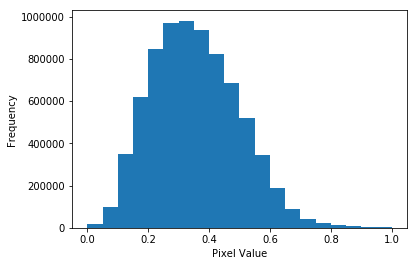

In [15]:
#plot historgram for min max norm image
plt.hist(tf.reshape(re_list, [-1]),20,[0,1])
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

----------------------------------------------------------


# Validation

In [16]:
coords,_, ori_one_hot_imgs = utils_model.create_dat_samples(n_neurons, IMG_SIZE)
coords = tf.reshape(coords, [n_neurons, 1,1,2])
tf.print(tf.shape(coords))

[200 1 1 2]


-----------------------------------

# Model

In [17]:
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Conv2D, Dense, Flatten, Reshape, MaxPooling2D, UpSampling2D
from tensorflow.keras.layers import InputLayer, Conv2DTranspose, Activation, BatchNormalization
from tensorflow.keras.layers import Input, Softmax
from tensorflow.keras.regularizers import l1
from utils_model import conv_block, coordconv_block, up_block, up_coord_block
from tensorflow.keras import layers

def encoder(inps, img_size):
    #downsampling
    coord01 =CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
                       filters = 128,strides=(2,2), kernel_size = 3, 
                       padding='same',activity_regularizer=l1(l1_coeff))(inps) 
    act1=tf.keras.layers.ReLU()(coord01)
    pool1=MaxPooling2D((2, 2), strides=2,padding='same')(act1)
    conv1=Conv2D(64, kernel_size = 3, padding='same',activity_regularizer=l1(l1_coeff))(pool1)
    act2=tf.keras.layers.ReLU()(conv1)
    pool2=MaxPooling2D((2, 2), strides=2,padding='same')(act2)
    
    #upsampling
    x = CoordConv(x_dim = 13, y_dim = 13, with_r = False, 
                       filters = 128, kernel_size = 3, 
                       padding='same',activity_regularizer=l1(l1_coeff))(pool2) 
    x = UpSampling2D(size=(2, 2))(x)    
    x = Conv2D(64, 3, padding = 'same', activation = 'relu',activity_regularizer=l1(l1_coeff))(x)
    x = UpSampling2D(size=(2,2))(x)
    x = Conv2D(16, 3, padding = 'valid', activation = 'relu',activity_regularizer=l1(l1_coeff))(x)
    x = UpSampling2D(size=(2,2))(x)
    x = Conv2D(8, 3, padding = 'same', activation = 'relu',activity_regularizer=l1(l1_coeff))(x)
    output = Conv2D(1, 3, padding = 'same', activation = 'sigmoid',activity_regularizer=l1(l1_coeff))(x)
    return output


def de_conv(input_tensor):
    coord01 = CoordConv(x_dim = 100, y_dim = 100, with_r = False, filters = 100,
              kernel_size = 1, padding='same', activation='relu')(input_tensor)
    conv01 = Conv2D(filters = 50, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(coord01)
    conv02 = Conv2D(filters = 50, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv01)
    conv03 = Conv2D(filters = 100, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv02)
    conv04 = Conv2D(filters = 100, kernel_size = 1, strides = 1, padding = "same", activation = 'relu')(conv03)
    conv05 = Conv2D(filters = 1, kernel_size = 1, strides = 1, padding = "same" )(conv04)
    f1 = Flatten()(conv05)
    output = Softmax(axis = -1)(f1)

    return output

def latent_space(encoded_imgs, deconv_imgs, coords, batch_size, img_size):
    '''
    This function construct the dot product of the output of an encoder(batch_size, img_size, img_size, 1) 
    with the one hot images generated by decoord-conv(n_neurons, img_size, img_size, 1), which yields
    similarity score (batch_size, n_neurons). Similarity score is then concatenate to the last layer of the 
    input coordinates with the corresponding batch (batch_size, n_neurons, 3)
    
    @encoded_imgs: output images from the encoder
    @deconv_imgs: one hot images generated from the coordinate list 
    @coords: A list of coordinates generated randomly based on the number of neurons
    @batch_size: Batch size of the input image for encoder, to allocate size for writing in loop
    
    return: 
        latent space with dim (batch_size, n_neurons, 3, 1)
    '''
    similarity_score = tf.tensordot(encoded_imgs, deconv_imgs, [[1,2,3],[1,2,3]]) #(batch_size, n_neurons)
    squeeze_coords = tf.squeeze(coords/(img_size-1)) #coords dim (n_neurons, 1, 1, 2) = > (n_neurons, 2)
    latent = tf.TensorArray(tf.float32, size=0, dynamic_size=True)
    for i in tf.range(batch_size):
        concat = tf.stack((squeeze_coords[:,-2], squeeze_coords[:,-1], similarity_score[i]), axis=-1)    
        latent = latent.write(i, concat) #(batch_size, n_neurons, 3)
    return tf.expand_dims(latent.stack(), axis = -1), similarity_score

def duplicate_batch(inp_img, batch_size):
    '''
    This function duplicate an image with respect to its batch size
    @param inp_img: input image to be duplicated
    @param batch_size: batch size, which is the number of image to be duplicated

    return duplicated images along axis 0, (batch_size, img_size, img_size, 1)
    '''
    inp_img = tf.expand_dims(inp_img, 0)
    m2 = tf.constant([batch_size, 1, 1, 1], tf.int32)  # multiplier for tiling
    duplicate_imgs = tf.tile(inp_img, m2)
    return duplicate_imgs

def decoder(latent_dim):
    flat_01 = Flatten()(latent_dim)
    dense_01 = Dense(25*25*32, activation = 'relu')(flat_01)
    dense_01 = Reshape((25,25,32))(dense_01)
    up_01 = up_coord_block(dense_01, up_size = 2, x_dim = 50, y_dim = 50, filters = 64, 
                           kernel_size = 3, strides = 1, padding = 'same', activation = 'relu')
    up_02 = up_block(up_01, up_size = 2, filters = 32, kernel_size = 3,
                            strides = 1, padding = 'same', activation = 'relu')
    output = Conv2D(filters = 1, kernel_size = 3, strides = 1,
                    padding = 'same', activation = None)(up_02)
    return output

class learnable_coords(layers.Layer):
    def __init__(self, coords):
        super(learnable_coords, self).__init__()
        self.learned_coords = tf.Variable((coords), trainable = True)

    def __call__(self, img_size):
        y = self.learned_coords/(img_size-1) #normalize the coordinates
    #         y = tf.clip_by_value(y, clip_value_min=0, clip_value_max=1) #clip values
        return y

In [18]:
# def encoder02(inps, img_size):
#     #1st block
#     coord01 = CoordConv(x_dim = img_size, y_dim = img_size, with_r = False, 
#                         filters = 256, kernel_size = 3, padding='same')(inps)
#     leaky01 =tf.keras.layers.LeakyReLU(0.5)(coord01)
#     conv01 = Conv2D(filters = 128, kernel_size = 3, strides = 1, padding = "same", activation = 'relu')(leaky01 )
#     leaky02 = tf.keras.layers.LeakyReLU(0.5)(conv01)
#     output = Conv2D(1, kernel_size = 3,activation = 'linear', padding='same')(leaky02 )
#     return output

-----------------------------------------------------------------

## Build Model

In [19]:
#build encoder 
inps = Input(shape=(IMG_SIZE, IMG_SIZE, 1))
encoder_model = Model(inps, encoder(inps, IMG_SIZE))

#build coord model
inp = Input(shape=(100, 100,2)) #(batch_size, img_size, img_size, 2)
de_coordconv = Model(inp, de_conv(inp))
de_coordconv.load_weights("best_class_model100_02.hdf5")

#decoder
latent_dim = Input(shape=(n_neurons, 3, 1))
decoder_model = Model(latent_dim, decoder(latent_dim))

#learnable coords
l_coords = learnable_coords(coords)

## Train Model

--------------------------------------

In [20]:
#optimizer 
opt_global = tf.keras.optimizers.Adam(lr01)
opt_encoded_onehot = tf.keras.optimizers.Adam(lr02)
#loss function 
mse = tf.losses.MeanSquaredError()
@tf.function
def train_fn(inp_imgs, coords, img_size, batch_size, neuron_multi = True):
    with tf.GradientTape(persistent=True) as tape:
        #--RHS pipeline (Learnable Coords)--
        #custom layer for updating coordinates
        updated_coords = l_coords(img_size)
        m1 = tf.constant([1,img_size,img_size,1], tf.int32) #multiplier for tiling 
        #tile coordinates (n_neurons, img_size, img_size, 1)
        tile_cd = tf.tile(updated_coords, m1)
        #de-coordconv model
        de_coordconv.trainable = False #freeze de-coordconv
        one_hot_imgs = tf.reshape(de_coordconv(tile_cd),[-1,img_size, img_size, 1]) #(n_neurons, img_size, img_size, 1)
        
        #--LHS pipeline (Encoder Pipeline)--
        #output from encoder (batch_size, img_size, img_size, 1)
        encoder_output = encoder_model(inp_imgs)
        
        #--Bottle Neck--
        #latent space
        latent, similarity_score = latent_space(encoder_output, one_hot_imgs, coords, batch_size, img_size)#(batch_size, n_neurons, 3, 1)
        #compute the mse between the neurons with the one hot images generated by the deconv
        if not neuron_multi:
            #sum one hot images for all neurons, (n_neurons, img_size, img_size, 1) => (img_size, img_size, 1)
            one_hot_sum = tf.math.reduce_sum(one_hot_imgs, 0)
            #duplicate summed one_hot_images and compare with encoded output 
            #(img_size, img_size, 1) => (batch_size, img_size, img_size, 1) 
            duplicated_one_hot = duplicate_batch(one_hot_sum, batch_size)
            #loss between the encoded output and the one hot images 
            encoded_one_loss = mse(encoder_output, duplicated_one_hot)
        #compute the mse between the neurons with one hot images multiplied by similarity scores
        else:
            #multiply similarity scores with one hot images
            #(batch_size, n_neurons, img_size, img_size,1)
            similarity_multi = tf.einsum('ij,jklm->ijklm', similarity_score, one_hot_imgs) 
            #(batch_size, img_size, img_size, 1)
            similarity_multi_reduced_neurons = tf.reduce_sum(similarity_multi, axis=1)
            #loss between the encoded output and the one hot images 
            encoded_one_loss = mse(encoder_output, similarity_multi_reduced_neurons)
            
        #--Decoder--
        #reconstruction 
        reconstruction = decoder_model(latent)  
        #--Loss--
        #the loss that backprop through the whole pipeline 
        global_loss = mse(inp_imgs, reconstruction)

#         encoded_one_loss = mse(encoder_output, black_images)
        #append loss 
        loss = [global_loss, encoded_one_loss]
    
    #back prop through encoder + decoder + learnable_coords
    varis_global = encoder_model.trainable_variables + decoder_model.trainable_variables + l_coords.trainable_variables
    grad_model = tape.gradient(global_loss, varis_global)
    opt_global.apply_gradients(zip(grad_model, varis_global))
    
    #back prop through encoder + learnable_coords
    varis_encoded_one = encoder_model.trainable_variables + l_coords.trainable_variables
    grad_partial = tape.gradient(encoded_one_loss, varis_encoded_one)
    opt_encoded_onehot.apply_gradients(zip(grad_partial, varis_encoded_one))
    
    grad = [grad_model, grad_partial]
    return loss, updated_coords, one_hot_imgs, encoder_output, similarity_score, reconstruction, grad

In [21]:
# ds_dir = '/home/kevinteng/Desktop/jpg_to_npy_benchmark/'

# for d in sorted(os.listdir(ds_dir)):
#     merge_d = os.path.join(ds_dir+d)
#     imgs = dataset_parse(merge_d, 100)
#     break

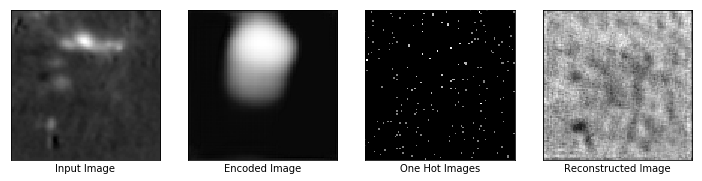

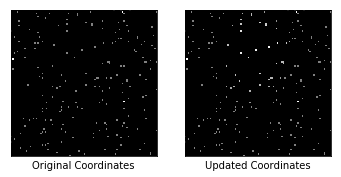

Epochs: 10, Reconstruction Loss: 0.012327137403190136
Similarity Loss: 0.6175498962402344
Max Similarity scores: 0.9506027698516846
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-0.002316045109182596, max:0.003242959501221776
Gradient partial min:-0.09786045551300049, max:0.18901962041854858



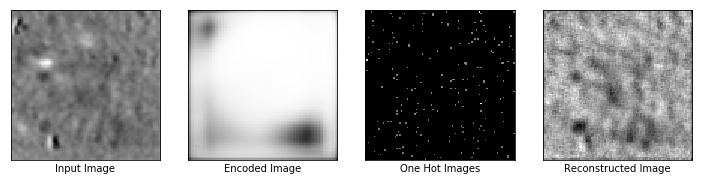

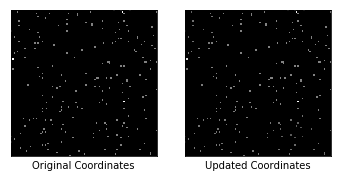

Epochs: 20, Reconstruction Loss: 0.005506346933543682
Similarity Loss: 0.6149622201919556
Max Similarity scores: 0.9971212148666382
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-0.00048680754844099283, max:0.0003941222093999386
Gradient partial min:-0.1029023602604866, max:0.18276339769363403



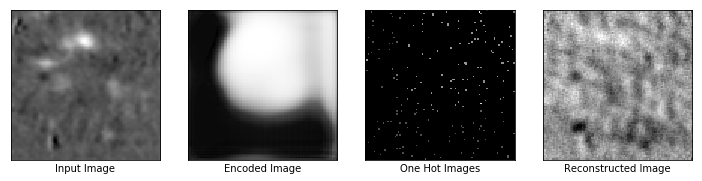

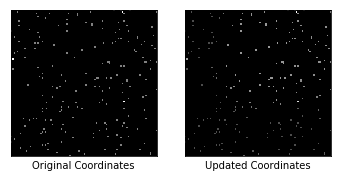

Epochs: 30, Reconstruction Loss: 0.004742773715406656
Similarity Loss: 0.6289732456207275
Max Similarity scores: 0.9973161220550537
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-0.00026926540886051953, max:0.00023490484454669058
Gradient partial min:-0.10017161071300507, max:0.1711137592792511



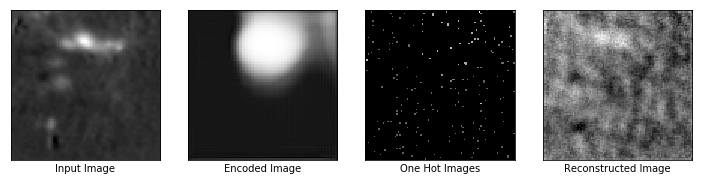

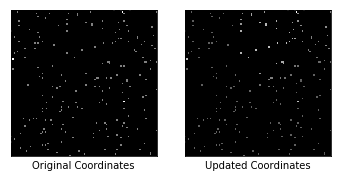

Epochs: 40, Reconstruction Loss: 0.004438480362296104
Similarity Loss: 0.6241527199745178
Max Similarity scores: 0.9925899505615234
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-0.0008130292990244925, max:0.0008429077570326626
Gradient partial min:-0.09317085146903992, max:0.1711796373128891



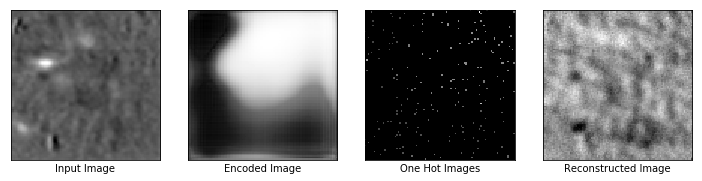

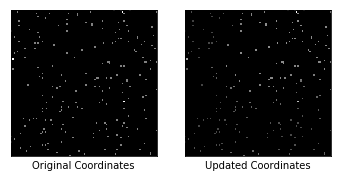

Epochs: 50, Reconstruction Loss: 0.004211374092847109
Similarity Loss: 0.6005598902702332
Max Similarity scores: 0.9828214645385742
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-9.257273632101715e-05, max:9.630351996747777e-05
Gradient partial min:-0.09111206978559494, max:0.18073126673698425



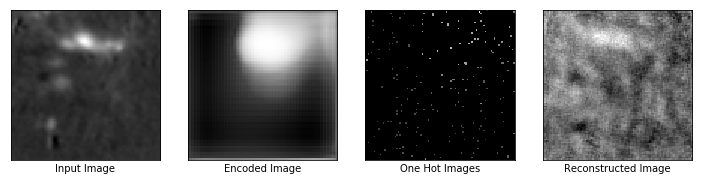

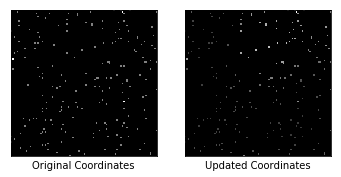

Epochs: 60, Reconstruction Loss: 0.004086321219801903
Similarity Loss: 0.525222897529602
Max Similarity scores: 0.979630708694458
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-0.0004855849838349968, max:0.00031884698546491563
Gradient partial min:-0.08871421217918396, max:0.1933315098285675



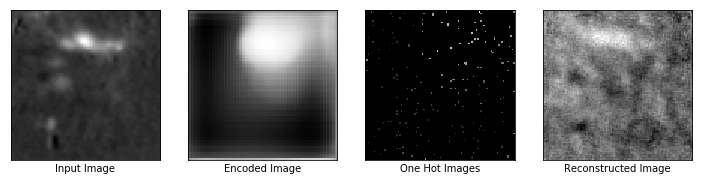

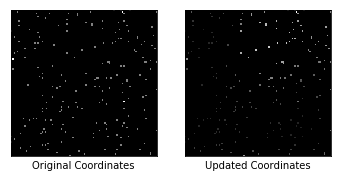

Epochs: 70, Reconstruction Loss: 0.003980817273259163
Similarity Loss: 0.45788031816482544
Max Similarity scores: 0.9531035423278809
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-0.0010303702438250184, max:0.000556363957002759
Gradient partial min:-0.08721326291561127, max:0.19493193924427032



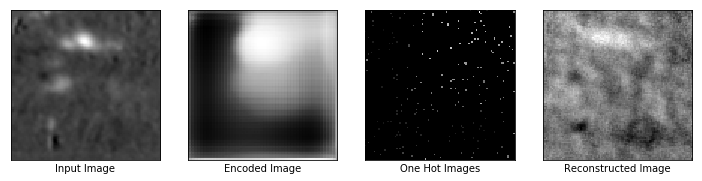

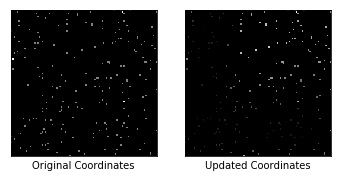

Epochs: 80, Reconstruction Loss: 0.003863982390612364
Similarity Loss: 0.4152753949165344
Max Similarity scores: 0.9181286096572876
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-0.003080997383221984, max:0.001105822972021997
Gradient partial min:-0.08207404613494873, max:0.19493022561073303



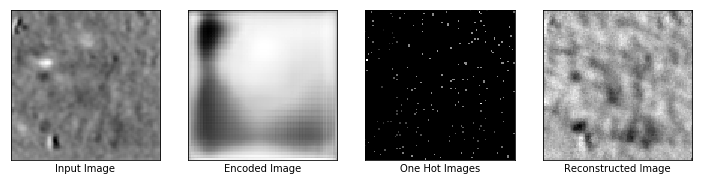

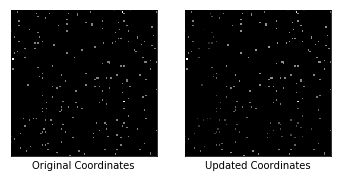

Epochs: 90, Reconstruction Loss: 0.003718666033819318
Similarity Loss: 0.38481929898262024
Max Similarity scores: 0.9333585500717163
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-0.0009227974223904312, max:0.000781301932875067
Gradient partial min:-0.07824305444955826, max:0.19514353573322296



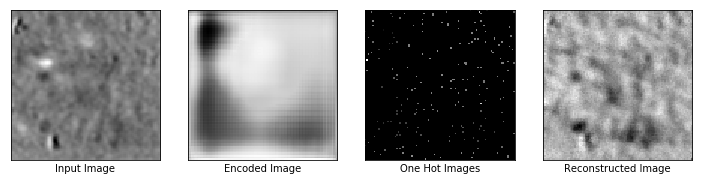

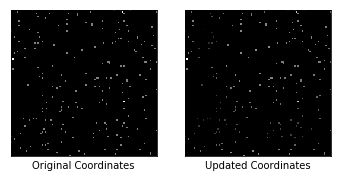

Epochs: 100, Reconstruction Loss: 0.0035799320321530104
Similarity Loss: 0.35947421193122864
Max Similarity scores: 0.92561936378479
Updated Coordinates: [[[0.44444445 0.5555556 ]]]
Gradient global min:-0.0011397728230804205, max:0.0008735624141991138
Gradient partial min:-0.07119922339916229, max:0.19417545199394226



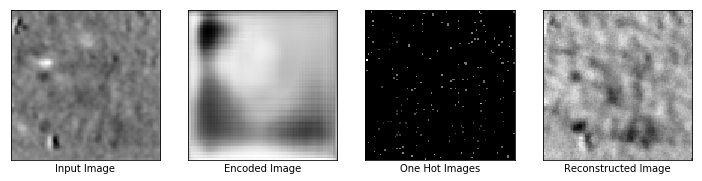

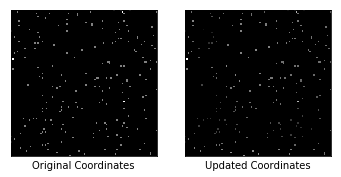

Epochs: 110, Reconstruction Loss: 0.0034189941361546516
Similarity Loss: 0.34044215083122253
Max Similarity scores: 0.9447037577629089
Updated Coordinates: [[[0.4444445 0.5555556]]]
Gradient global min:-0.0012700528604909778, max:0.0008757527102716267
Gradient partial min:-0.06729888170957565, max:0.1928708553314209



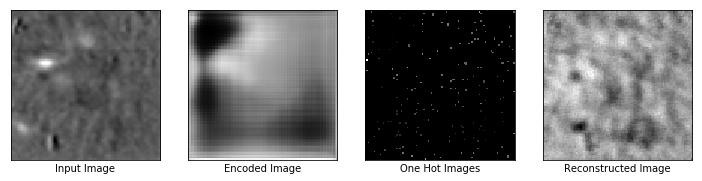

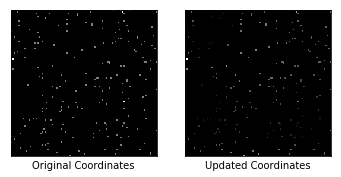

Epochs: 120, Reconstruction Loss: 0.003245494794100523
Similarity Loss: 0.32021450996398926
Max Similarity scores: 0.933027982711792
Updated Coordinates: [[[0.4444484 0.5555556]]]
Gradient global min:-0.000615460448898375, max:0.0003922880860045552
Gradient partial min:-0.0622713528573513, max:0.1899072229862213



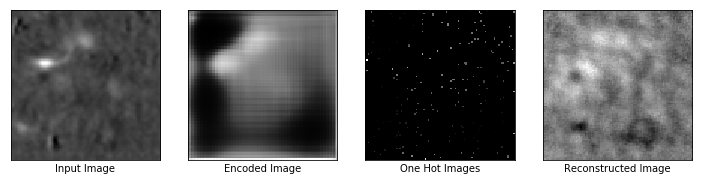

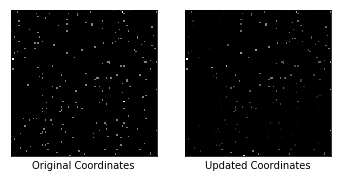

Epochs: 130, Reconstruction Loss: 0.003089038422331214
Similarity Loss: 0.30055972933769226
Max Similarity scores: 0.9357088208198547
Updated Coordinates: [[[0.44445562 0.55555534]]]
Gradient global min:-0.0008821177762001753, max:0.0006162564968690276
Gradient partial min:-0.059043996036052704, max:0.18477681279182434



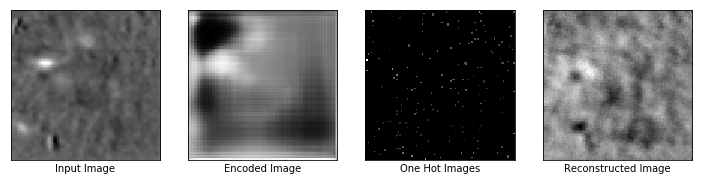

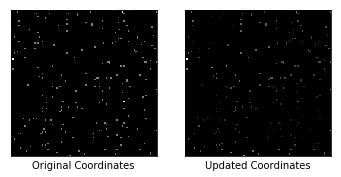

Epochs: 140, Reconstruction Loss: 0.0029548979364335537
Similarity Loss: 0.282000333070755
Max Similarity scores: 0.9367488026618958
Updated Coordinates: [[[0.4444592  0.55555445]]]
Gradient global min:-0.0007343366742134094, max:0.000462025695014745
Gradient partial min:-0.05611995980143547, max:0.1775045096874237



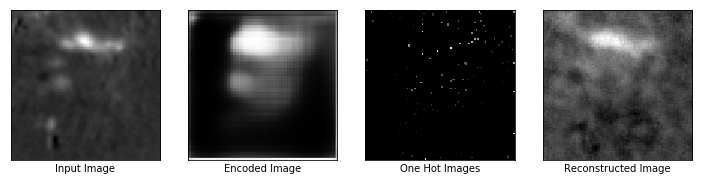

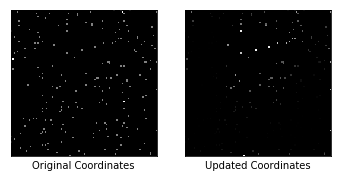

Epochs: 150, Reconstruction Loss: 0.002814020263031125
Similarity Loss: 0.26464375853538513
Max Similarity scores: 0.940291702747345
Updated Coordinates: [[[0.44446126 0.55556035]]]
Gradient global min:-0.001073808642104268, max:0.0006220885552465916
Gradient partial min:-0.05357074737548828, max:0.16782264411449432



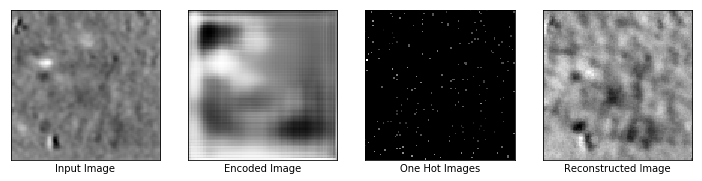

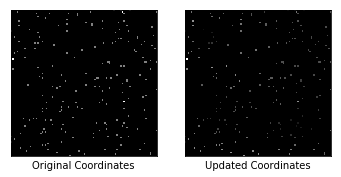

Epochs: 160, Reconstruction Loss: 0.0026671134401112795
Similarity Loss: 0.24953271448612213
Max Similarity scores: 0.9433974623680115
Updated Coordinates: [[[0.44446343 0.5555652 ]]]
Gradient global min:-0.000978893251158297, max:0.0005782422958873212
Gradient partial min:-0.05061029642820358, max:0.1555083692073822



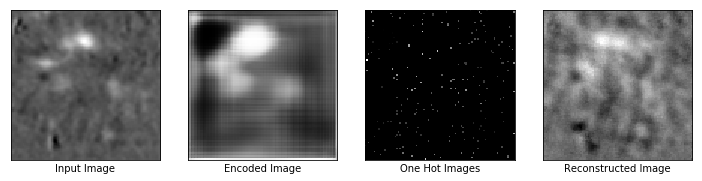

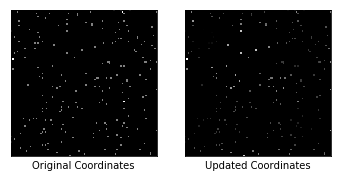

Epochs: 170, Reconstruction Loss: 0.002512388862669468
Similarity Loss: 0.2371884286403656
Max Similarity scores: 0.9332448840141296
Updated Coordinates: [[[0.4444663  0.55556905]]]
Gradient global min:-0.00029552154592238367, max:0.00020820855570491403
Gradient partial min:-0.04798494279384613, max:0.14425992965698242



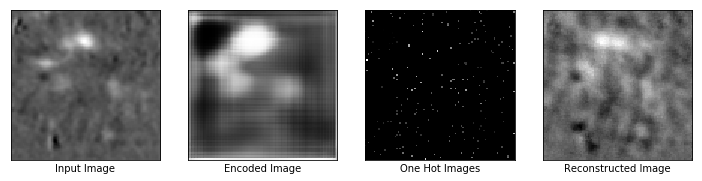

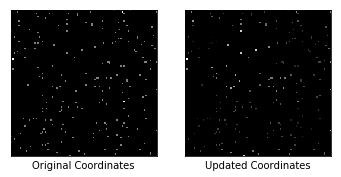

Epochs: 180, Reconstruction Loss: 0.0023568880278617144
Similarity Loss: 0.22604858875274658
Max Similarity scores: 0.930497944355011
Updated Coordinates: [[[0.4444692  0.55557257]]]
Gradient global min:-0.00024591456167399883, max:0.00016962325025815517
Gradient partial min:-0.04519753158092499, max:0.13484688103199005



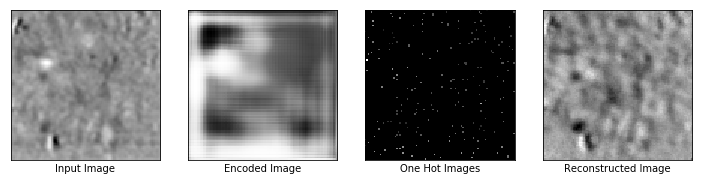

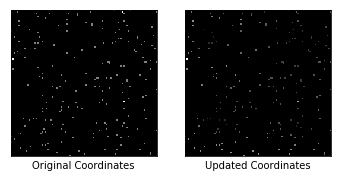

Epochs: 190, Reconstruction Loss: 0.0022270441986620426
Similarity Loss: 0.21618710458278656
Max Similarity scores: 0.9753592610359192
Updated Coordinates: [[[0.4444715 0.5555752]]]
Gradient global min:-0.0005279619945213199, max:0.00034957443131133914
Gradient partial min:-0.04335949942469597, max:0.12574464082717896



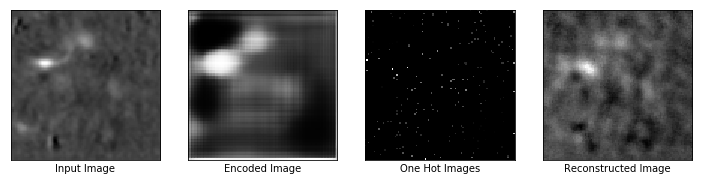

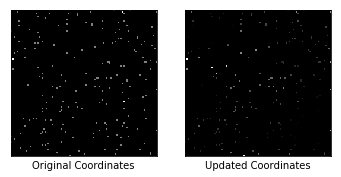

Epochs: 200, Reconstruction Loss: 0.002152708126232028
Similarity Loss: 0.20885048806667328
Max Similarity scores: 0.9454148411750793
Updated Coordinates: [[[0.44447264 0.55557716]]]
Gradient global min:-0.0013590328162536025, max:0.0014752319548279047
Gradient partial min:-0.041930556297302246, max:0.1188526600599289



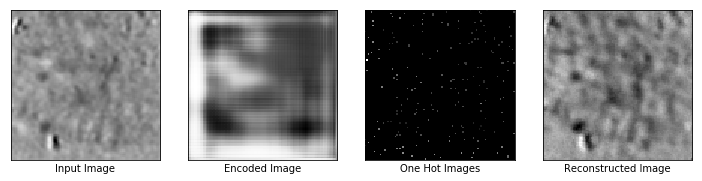

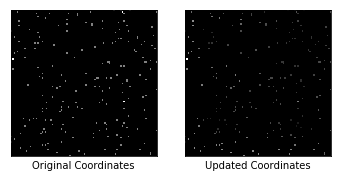

Epochs: 210, Reconstruction Loss: 0.002076822565868497
Similarity Loss: 0.19402344524860382
Max Similarity scores: 0.9807569980621338
Updated Coordinates: [[[0.44447243 0.5555777 ]]]
Gradient global min:-0.00037657638313248754, max:0.00018601563351694494
Gradient partial min:-0.04137644171714783, max:0.11323948204517365



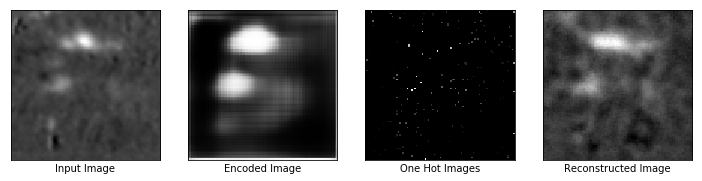

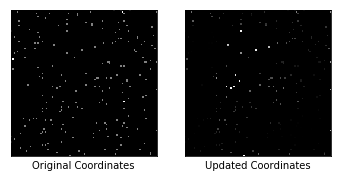

Epochs: 220, Reconstruction Loss: 0.002071021357551217
Similarity Loss: 0.18230187892913818
Max Similarity scores: 0.9359250664710999
Updated Coordinates: [[[0.44447204 0.5555777 ]]]
Gradient global min:-0.003593572648242116, max:0.0016023305943235755
Gradient partial min:-0.04002989083528519, max:0.10627524554729462



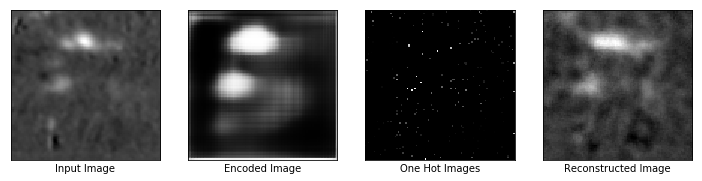

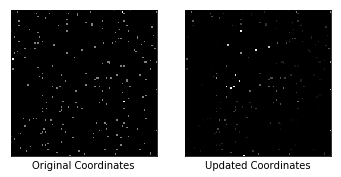

Epochs: 230, Reconstruction Loss: 0.0019129941938444972
Similarity Loss: 0.1832701414823532
Max Similarity scores: 0.9396908283233643
Updated Coordinates: [[[0.44446748 0.5555777 ]]]
Gradient global min:-0.0015114510897547007, max:0.0009095060522668064
Gradient partial min:-0.0389980711042881, max:0.10173242539167404



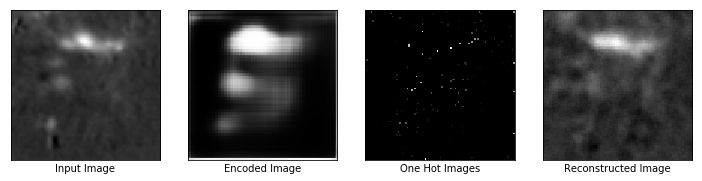

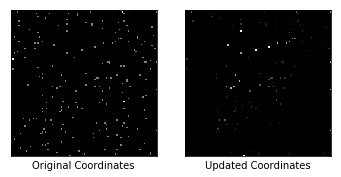

Epochs: 240, Reconstruction Loss: 0.001809883862733841
Similarity Loss: 0.18681281805038452
Max Similarity scores: 0.9354519248008728
Updated Coordinates: [[[0.44446185 0.5555777 ]]]
Gradient global min:-0.00055600272025913, max:0.000877307029440999
Gradient partial min:-0.0385773628950119, max:0.09829417616128922



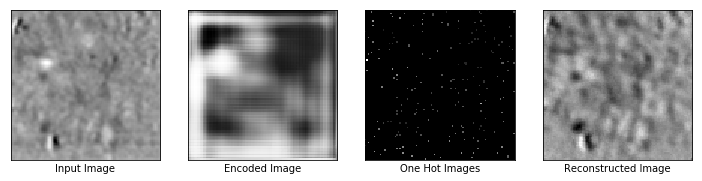

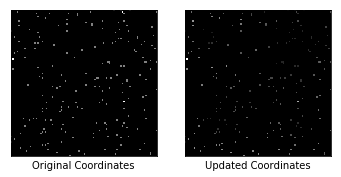

Epochs: 250, Reconstruction Loss: 0.001745837740600109
Similarity Loss: 0.1888241469860077
Max Similarity scores: 0.9727137684822083
Updated Coordinates: [[[0.44445562 0.5555777 ]]]
Gradient global min:-0.0008867663564160466, max:0.00131960678845644
Gradient partial min:-0.0381033793091774, max:0.09489409625530243



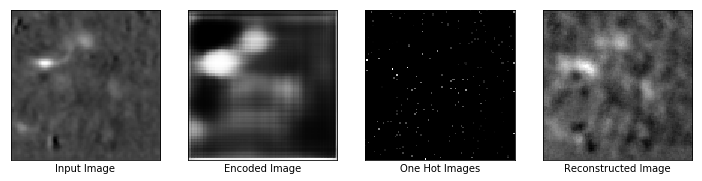

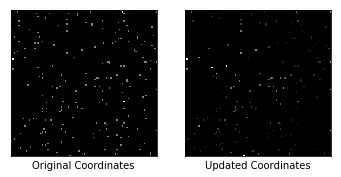

Epochs: 260, Reconstruction Loss: 0.001695152255706489
Similarity Loss: 0.1894945502281189
Max Similarity scores: 0.9667237401008606
Updated Coordinates: [[[0.44444773 0.5555777 ]]]
Gradient global min:-0.001632127445191145, max:0.0019180324161425233
Gradient partial min:-0.037686191499233246, max:0.09184958040714264



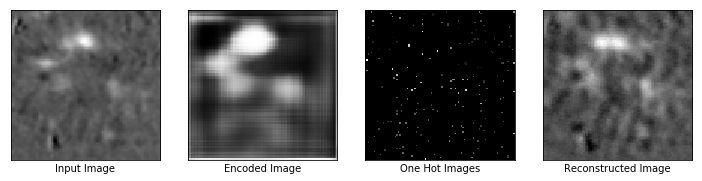

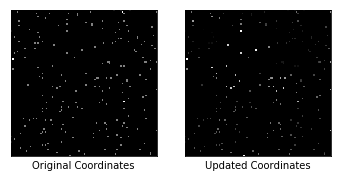

Epochs: 270, Reconstruction Loss: 0.0016445145010948181
Similarity Loss: 0.18869225680828094
Max Similarity scores: 0.9064950346946716
Updated Coordinates: [[[0.44443902 0.5555784 ]]]
Gradient global min:-0.0004782131582032889, max:0.0005392514867708087
Gradient partial min:-0.03880947828292847, max:0.0883069857954979



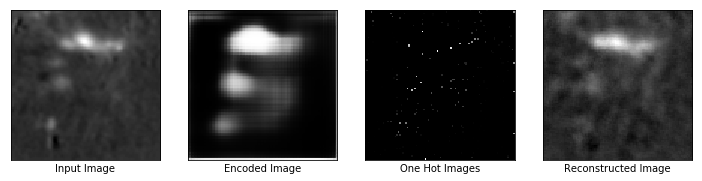

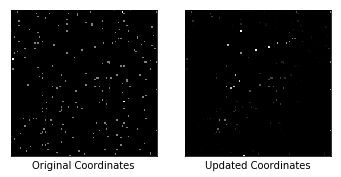

Epochs: 280, Reconstruction Loss: 0.001776150893419981
Similarity Loss: 0.16577547788619995
Max Similarity scores: 0.9191160202026367
Updated Coordinates: [[[0.44442922 0.55557996]]]
Gradient global min:-0.0025251652114093304, max:0.0014148185728117824
Gradient partial min:-0.03461175411939621, max:0.07838325202465057



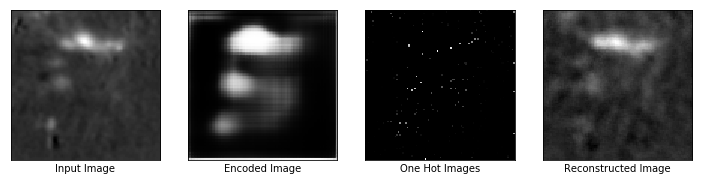

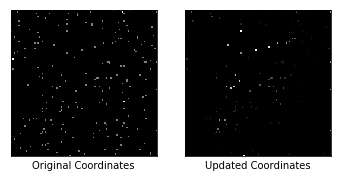

Epochs: 290, Reconstruction Loss: 0.0015876108082011342
Similarity Loss: 0.16374264657497406
Max Similarity scores: 0.9200714230537415
Updated Coordinates: [[[0.44441935 0.5555802 ]]]
Gradient global min:-0.0009335254435427487, max:0.00047425951925106347
Gradient partial min:-0.03596402332186699, max:0.0729784220457077



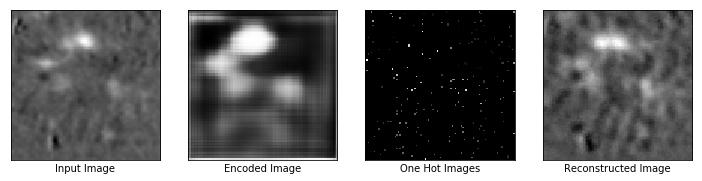

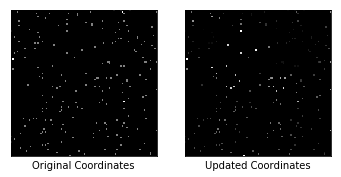

Epochs: 300, Reconstruction Loss: 0.001483788131736219
Similarity Loss: 0.16750285029411316
Max Similarity scores: 0.892396867275238
Updated Coordinates: [[[0.44440952 0.55558085]]]
Gradient global min:-0.00022374492255039513, max:0.00021225513773970306
Gradient partial min:-0.038537003099918365, max:0.07169332355260849



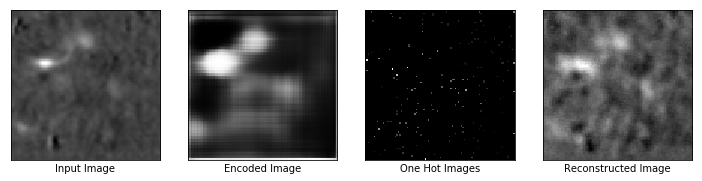

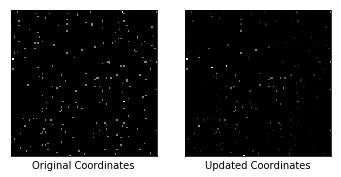

Epochs: 310, Reconstruction Loss: 0.0014212817186489701
Similarity Loss: 0.16921868920326233
Max Similarity scores: 0.9695706367492676
Updated Coordinates: [[[0.44439852 0.5555817 ]]]
Gradient global min:-0.0013907807879149914, max:0.0013363976031541824
Gradient partial min:-0.04038627818226814, max:0.06973501294851303



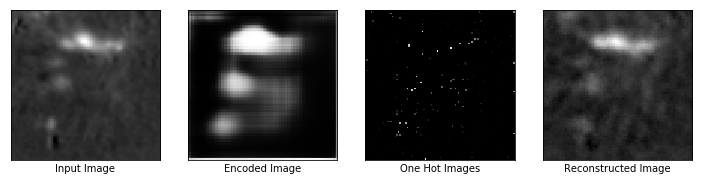

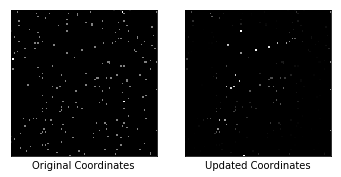

Epochs: 320, Reconstruction Loss: 0.0013624250423163176
Similarity Loss: 0.1695183962583542
Max Similarity scores: 0.9161118865013123
Updated Coordinates: [[[0.44438696 0.5555828 ]]]
Gradient global min:-0.000921090948395431, max:0.0007101797964423895
Gradient partial min:-0.04193563014268875, max:0.07170262187719345



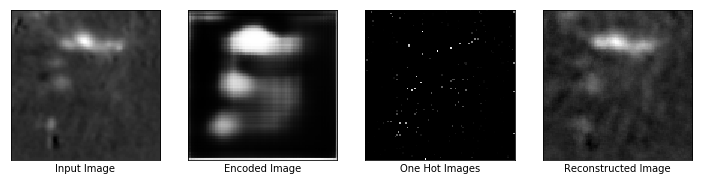

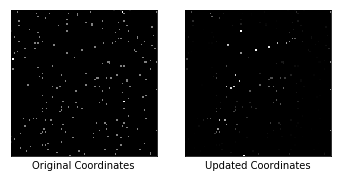

Epochs: 330, Reconstruction Loss: 0.0013085815589874983
Similarity Loss: 0.16861729323863983
Max Similarity scores: 0.9129160046577454
Updated Coordinates: [[[0.4443753  0.55558413]]]
Gradient global min:-0.0009300805977545679, max:0.0007022271165624261
Gradient partial min:-0.043272752314805984, max:0.07498767226934433



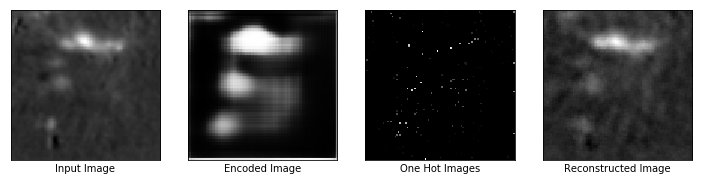

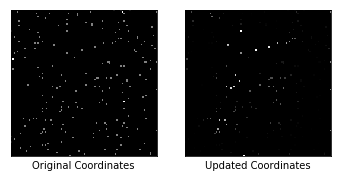

Epochs: 340, Reconstruction Loss: 0.0012555269058793783
Similarity Loss: 0.16616690158843994
Max Similarity scores: 0.9088136553764343
Updated Coordinates: [[[0.44436383 0.5555857 ]]]
Gradient global min:-0.0007750101503916085, max:0.000519870372954756
Gradient partial min:-0.044168781489133835, max:0.07800580561161041



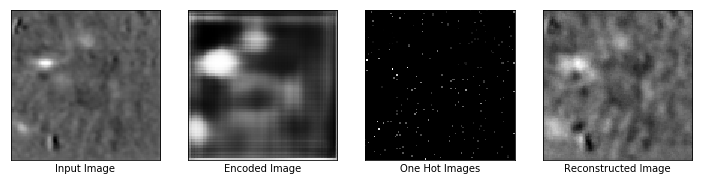

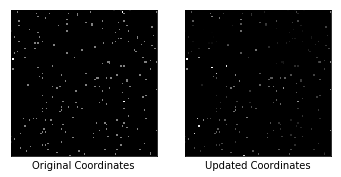

Epochs: 350, Reconstruction Loss: 0.0013032982824370265
Similarity Loss: 0.16470077633857727
Max Similarity scores: 0.9747313857078552
Updated Coordinates: [[[0.4443509 0.5555872]]]
Gradient global min:-0.003631788305938244, max:0.0026553794741630554
Gradient partial min:-0.04521436244249344, max:0.08135958760976791



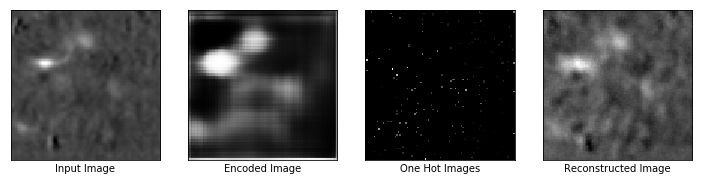

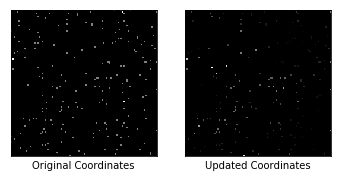

Epochs: 360, Reconstruction Loss: 0.0012599844485521317
Similarity Loss: 0.14611130952835083
Max Similarity scores: 0.9659053683280945
Updated Coordinates: [[[0.4443367 0.5555898]]]
Gradient global min:-0.001907817553728819, max:0.0014287438243627548
Gradient partial min:-0.03995950147509575, max:0.07472676038742065



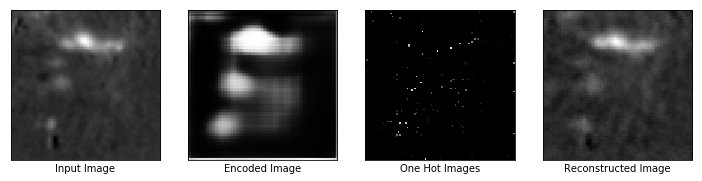

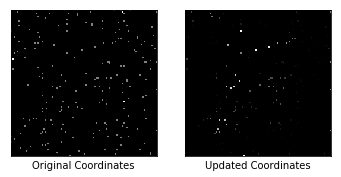

Epochs: 370, Reconstruction Loss: 0.0011508428724482656
Similarity Loss: 0.14983206987380981
Max Similarity scores: 0.8896880149841309
Updated Coordinates: [[[0.4443232  0.55559057]]]
Gradient global min:-0.0006316881626844406, max:0.00048297690227627754
Gradient partial min:-0.042251572012901306, max:0.08037324249744415



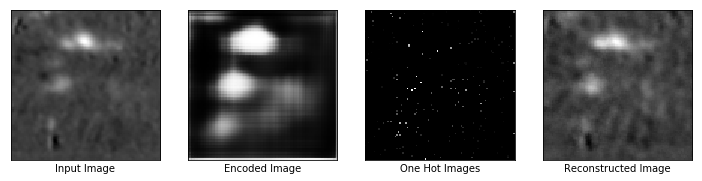

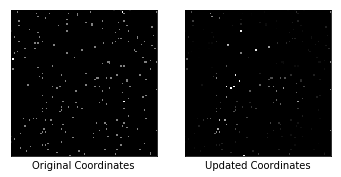

Epochs: 380, Reconstruction Loss: 0.0011123270960524678
Similarity Loss: 0.15286003053188324
Max Similarity scores: 0.9311641454696655
Updated Coordinates: [[[0.44430935 0.55559164]]]
Gradient global min:-0.001913724117912352, max:0.0021016732789576054
Gradient partial min:-0.044306591153144836, max:0.08555305749177933



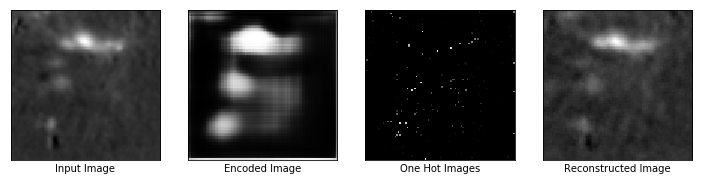

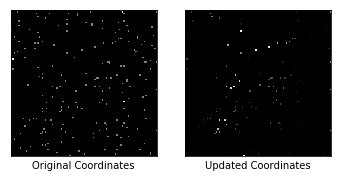

Epochs: 390, Reconstruction Loss: 0.0010676992824301124
Similarity Loss: 0.15353618562221527
Max Similarity scores: 0.8832099437713623
Updated Coordinates: [[[0.44429547 0.5555928 ]]]
Gradient global min:-0.0012895904947072268, max:0.0010920868953689933
Gradient partial min:-0.045758314430713654, max:0.0898086205124855



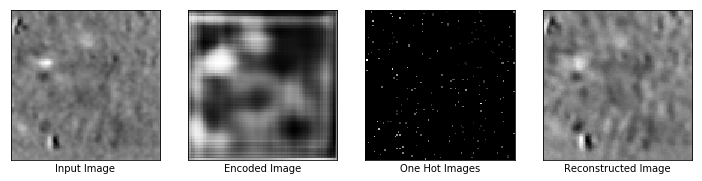

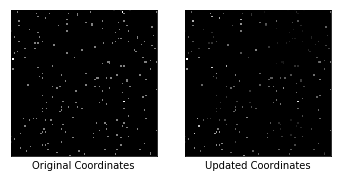

Epochs: 400, Reconstruction Loss: 0.0010328763164579868
Similarity Loss: 0.15346108376979828
Max Similarity scores: 0.9128991365432739
Updated Coordinates: [[[0.44428164 0.5555941 ]]]
Gradient global min:-0.0032278180588036776, max:0.0023382832296192646
Gradient partial min:-0.047436270862817764, max:0.09366567432880402



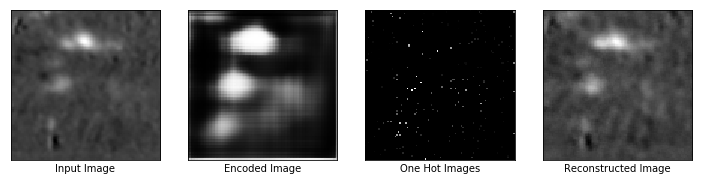

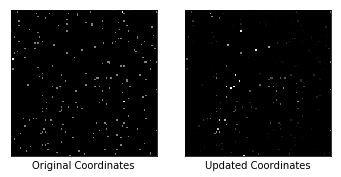

Epochs: 410, Reconstruction Loss: 0.0010049587581306696
Similarity Loss: 0.15274658799171448
Max Similarity scores: 0.9334030747413635
Updated Coordinates: [[[0.4442681  0.55559576]]]
Gradient global min:-0.0025141837541013956, max:0.0031684651039540768
Gradient partial min:-0.04958729445934296, max:0.09714043885469437



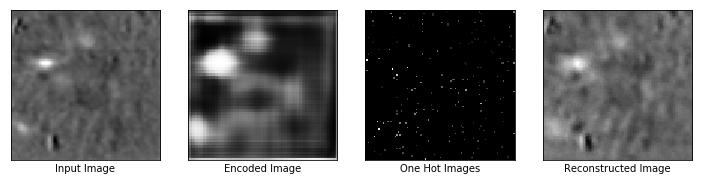

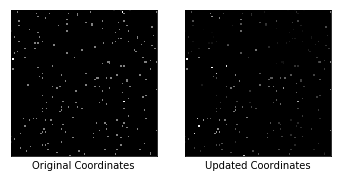

Epochs: 420, Reconstruction Loss: 0.001016529742628336
Similarity Loss: 0.1525610387325287
Max Similarity scores: 0.965148389339447
Updated Coordinates: [[[0.44425464 0.5555971 ]]]
Gradient global min:-0.004578986205160618, max:0.0032842238433659077
Gradient partial min:-0.05227592960000038, max:0.1016586422920227



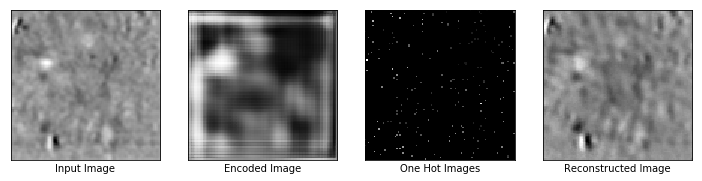

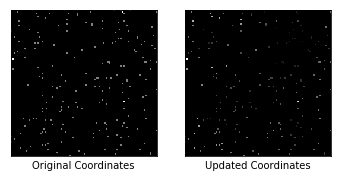

Epochs: 430, Reconstruction Loss: 0.0019789328798651695
Similarity Loss: 0.12251404672861099
Max Similarity scores: 0.8854570388793945
Updated Coordinates: [[[0.444244   0.55559814]]]
Gradient global min:-0.012754442170262337, max:0.00797263253480196
Gradient partial min:-0.04773285984992981, max:0.08720632642507553



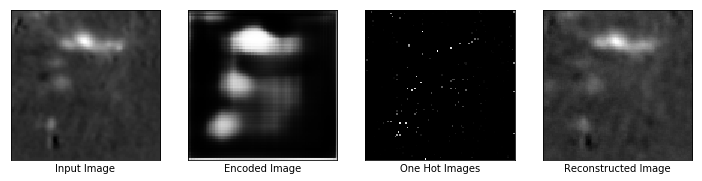

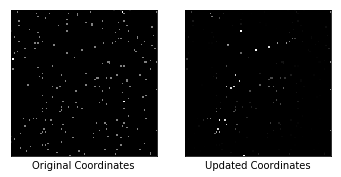

Epochs: 440, Reconstruction Loss: 0.0010475446470081806
Similarity Loss: 0.12622113525867462
Max Similarity scores: 0.8476531505584717
Updated Coordinates: [[[0.4442281  0.55560166]]]
Gradient global min:-0.0017937211086973548, max:0.0009015866671688855
Gradient partial min:-0.048665400594472885, max:0.09329227358102798



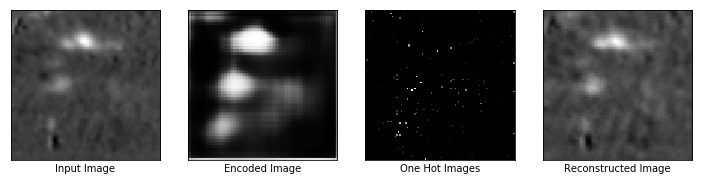

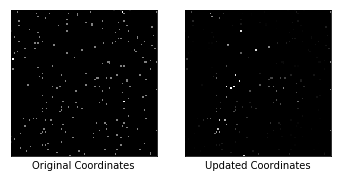

Epochs: 450, Reconstruction Loss: 0.0012226334074512124
Similarity Loss: 0.11898623406887054
Max Similarity scores: 0.9122390747070312
Updated Coordinates: [[[0.44421688 0.5556018 ]]]
Gradient global min:-0.0013152842875570059, max:0.000689178763423115
Gradient partial min:-0.04834188148379326, max:0.0897407978773117



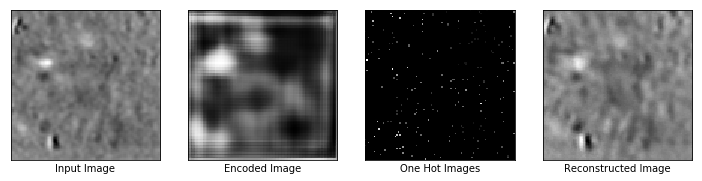

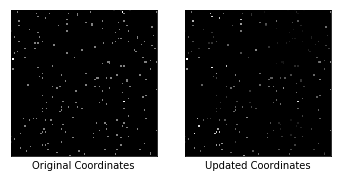

Epochs: 460, Reconstruction Loss: 0.0010881118942052126
Similarity Loss: 0.11538053303956985
Max Similarity scores: 0.8675026893615723
Updated Coordinates: [[[0.44421032 0.55560166]]]
Gradient global min:-0.002373185008764267, max:0.0031714411452412605
Gradient partial min:-0.050053276121616364, max:0.08901293575763702



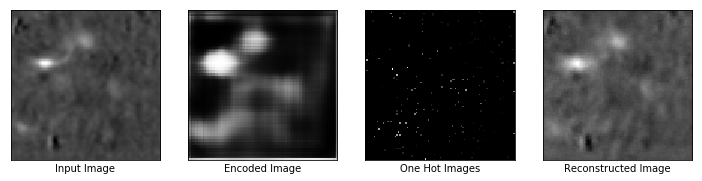

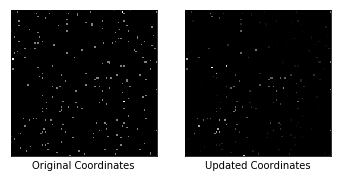

Epochs: 470, Reconstruction Loss: 0.0009849771158769727
Similarity Loss: 0.11784263700246811
Max Similarity scores: 0.9412323236465454
Updated Coordinates: [[[0.4441981 0.5556018]]]
Gradient global min:-0.0014547074679285288, max:0.0013337837299332023
Gradient partial min:-0.053975678980350494, max:0.09377153217792511



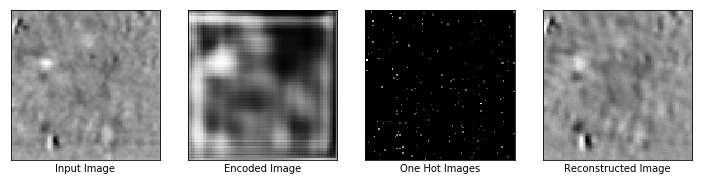

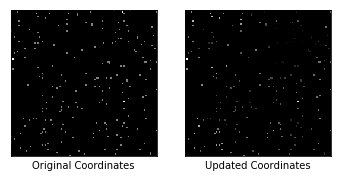

Epochs: 480, Reconstruction Loss: 0.0009200353524647653
Similarity Loss: 0.12141934782266617
Max Similarity scores: 0.8802615404129028
Updated Coordinates: [[[0.44418797 0.55560267]]]
Gradient global min:-0.0004829713434446603, max:0.00038357393350452185
Gradient partial min:-0.05816936120390892, max:0.0996335968375206



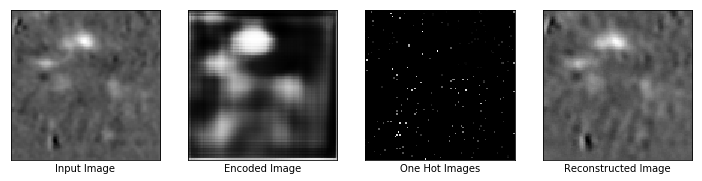

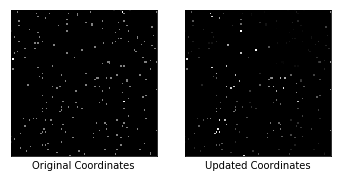

Epochs: 490, Reconstruction Loss: 0.000866948626935482
Similarity Loss: 0.12446760386228561
Max Similarity scores: 0.818679928779602
Updated Coordinates: [[[0.44417667 0.5556035 ]]]
Gradient global min:-0.0003345802833791822, max:0.0003498118603602052
Gradient partial min:-0.062301889061927795, max:0.10550330579280853



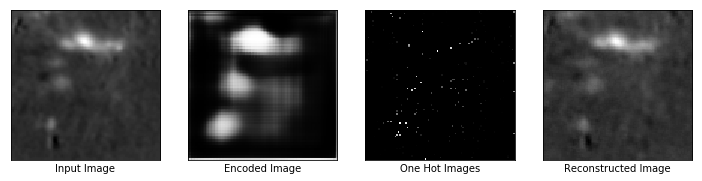

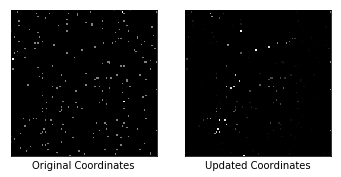

Epochs: 500, Reconstruction Loss: 0.00089935032883659
Similarity Loss: 0.12576061487197876
Max Similarity scores: 0.8450204133987427
Updated Coordinates: [[[0.44416583 0.5556045 ]]]
Gradient global min:-0.0014555954840034246, max:0.0014467769069597125
Gradient partial min:-0.06552867591381073, max:0.10997246205806732



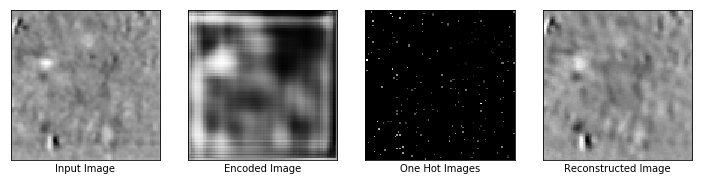

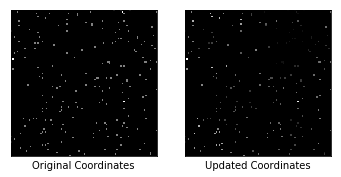

Epochs: 510, Reconstruction Loss: 0.0008446393767371774
Similarity Loss: 0.11962425708770752
Max Similarity scores: 0.8799067735671997
Updated Coordinates: [[[0.44415924 0.5556048 ]]]
Gradient global min:-0.00041910374420695007, max:0.0003346332523506135
Gradient partial min:-0.06562257558107376, max:0.10909148305654526



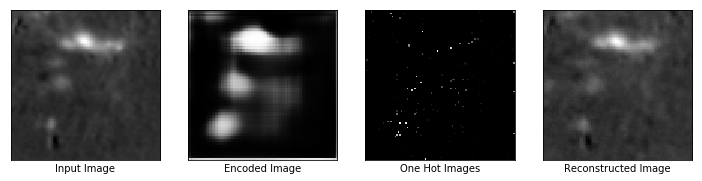

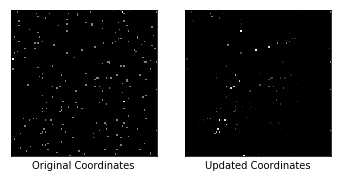

Epochs: 520, Reconstruction Loss: 0.0008843413088470697
Similarity Loss: 0.1088077649474144
Max Similarity scores: 0.8250589966773987
Updated Coordinates: [[[0.4441467 0.5556063]]]
Gradient global min:-0.001092874095775187, max:0.0004685997264459729
Gradient partial min:-0.060421232134103775, max:0.10106877237558365



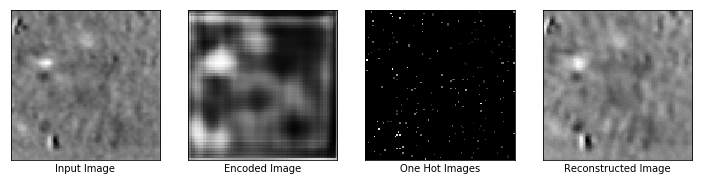

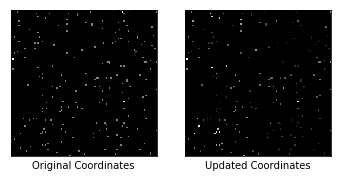

Epochs: 530, Reconstruction Loss: 0.0008289050892926753
Similarity Loss: 0.10790994763374329
Max Similarity scores: 0.824924111366272
Updated Coordinates: [[[0.4441351 0.5556063]]]
Gradient global min:-0.0007876576273702085, max:0.0006071205134503543
Gradient partial min:-0.06291505694389343, max:0.10382670164108276



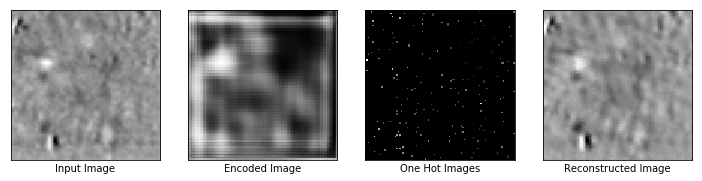

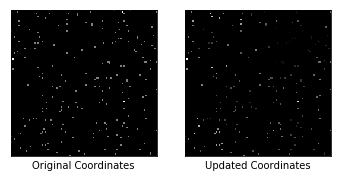

Epochs: 540, Reconstruction Loss: 0.0008058233070187271
Similarity Loss: 0.10693154484033585
Max Similarity scores: 0.8595433831214905
Updated Coordinates: [[[0.4441242 0.5556063]]]
Gradient global min:-0.00031915042200125754, max:0.00022409508528653532
Gradient partial min:-0.06495495140552521, max:0.10599625110626221



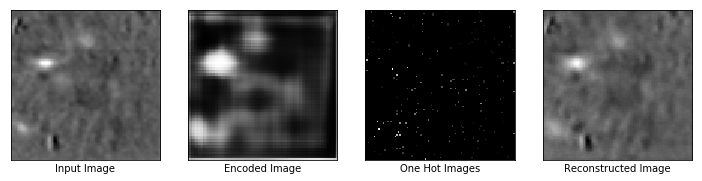

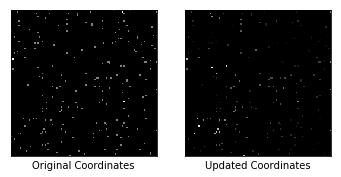

Epochs: 550, Reconstruction Loss: 0.0007986581767909229
Similarity Loss: 0.106772780418396
Max Similarity scores: 0.9181329607963562
Updated Coordinates: [[[0.44411308 0.5556063 ]]]
Gradient global min:-0.0007262779399752617, max:0.0005721361376345158
Gradient partial min:-0.06700437515974045, max:0.1081966757774353



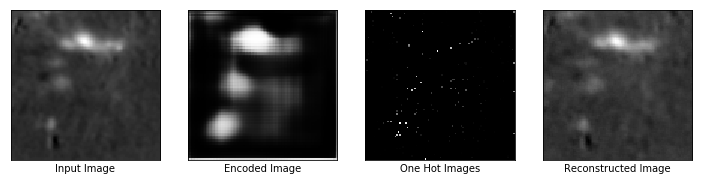

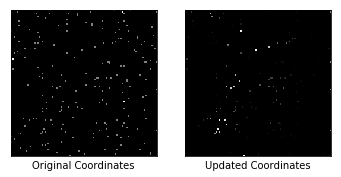

Epochs: 560, Reconstruction Loss: 0.000813628954347223
Similarity Loss: 0.10593898594379425
Max Similarity scores: 0.8348814845085144
Updated Coordinates: [[[0.44410196 0.5556063 ]]]
Gradient global min:-0.0007140404777601361, max:0.0003813364892266691
Gradient partial min:-0.06851055473089218, max:0.10955344885587692



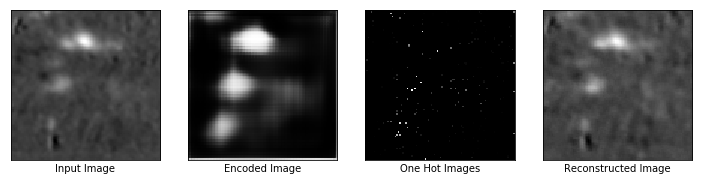

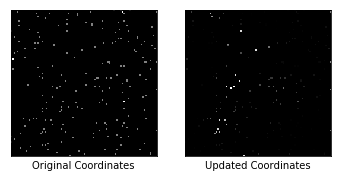

Epochs: 570, Reconstruction Loss: 0.0014554898953065276
Similarity Loss: 0.08822178095579147
Max Similarity scores: 0.8509146571159363
Updated Coordinates: [[[0.44409543 0.5556063 ]]]
Gradient global min:-0.010980658233165741, max:0.0066508948802948
Gradient partial min:-0.057573407888412476, max:0.09204964339733124



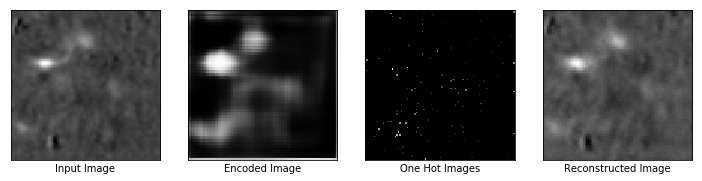

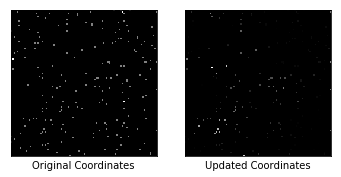

Epochs: 580, Reconstruction Loss: 0.0011645621852949262
Similarity Loss: 0.08658512681722641
Max Similarity scores: 0.8909184336662292
Updated Coordinates: [[[0.44408417 0.5556078 ]]]
Gradient global min:-0.004772428423166275, max:0.005128148943185806
Gradient partial min:-0.05758077651262283, max:0.09272856265306473



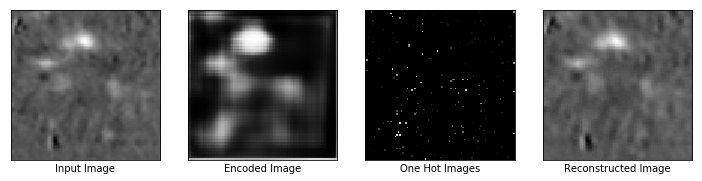

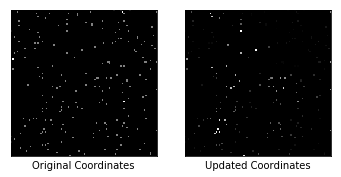

Epochs: 590, Reconstruction Loss: 0.0010738085256889462
Similarity Loss: 0.08564820140600204
Max Similarity scores: 0.7666285037994385
Updated Coordinates: [[[0.4440764 0.5556089]]]
Gradient global min:-0.0010454014409333467, max:0.0010416702134534717
Gradient partial min:-0.058662690222263336, max:0.09390594810247421



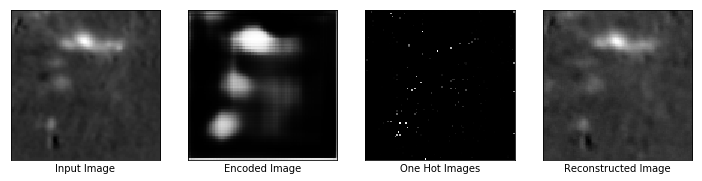

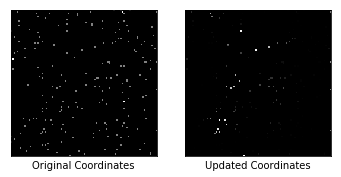

Epochs: 600, Reconstruction Loss: 0.0010022408096119761
Similarity Loss: 0.0852692499756813
Max Similarity scores: 0.8116766810417175
Updated Coordinates: [[[0.4440727 0.5556098]]]
Gradient global min:-0.0031200582161545753, max:0.0017823572270572186
Gradient partial min:-0.060232728719711304, max:0.09578480571508408



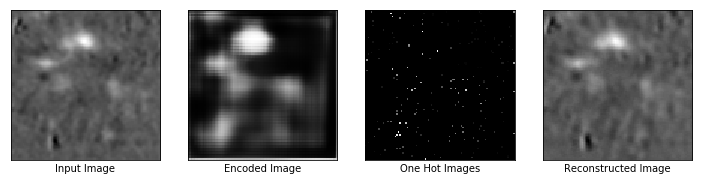

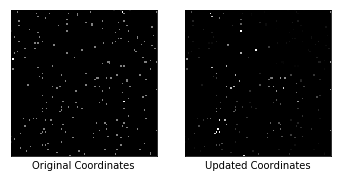

Epochs: 610, Reconstruction Loss: 0.0008926185546442866
Similarity Loss: 0.08710687607526779
Max Similarity scores: 0.7696354389190674
Updated Coordinates: [[[0.4440696 0.5556098]]]
Gradient global min:-0.0005364533863030374, max:0.0005075354711152613
Gradient partial min:-0.06303084641695023, max:0.09958181530237198



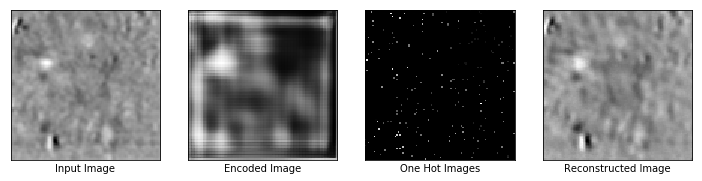

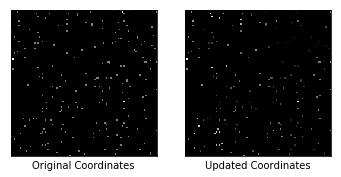

Epochs: 620, Reconstruction Loss: 0.0008232461987063289
Similarity Loss: 0.08920331299304962
Max Similarity scores: 0.831305980682373
Updated Coordinates: [[[0.44406614 0.5556098 ]]]
Gradient global min:-0.0011090118205174804, max:0.0006392973009496927
Gradient partial min:-0.06619292497634888, max:0.10387206822633743



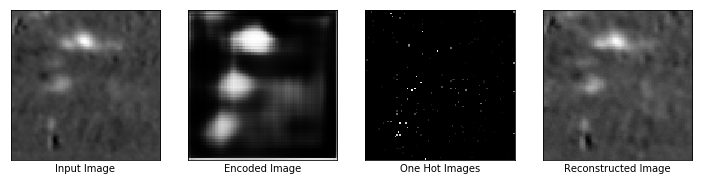

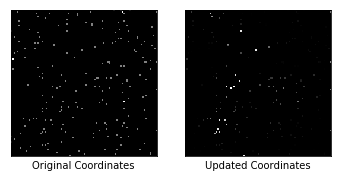

Epochs: 630, Reconstruction Loss: 0.0007831552065908909
Similarity Loss: 0.09089308232069016
Max Similarity scores: 0.837269127368927
Updated Coordinates: [[[0.4440608 0.5556098]]]
Gradient global min:-0.0009441669681109488, max:0.0008271905826404691
Gradient partial min:-0.0692749172449112, max:0.10801207274198532



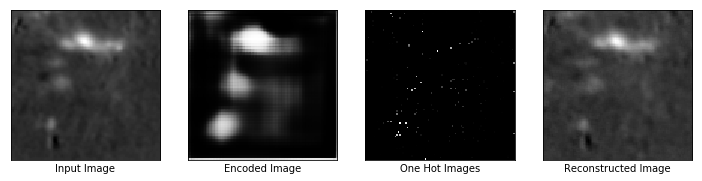

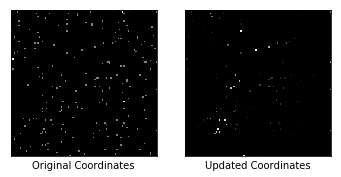

Epochs: 640, Reconstruction Loss: 0.000740795221645385
Similarity Loss: 0.09212461858987808
Max Similarity scores: 0.829383134841919
Updated Coordinates: [[[0.44405562 0.5556098 ]]]
Gradient global min:-0.00061955297132954, max:0.00042651983676478267
Gradient partial min:-0.07204320281744003, max:0.11181952059268951



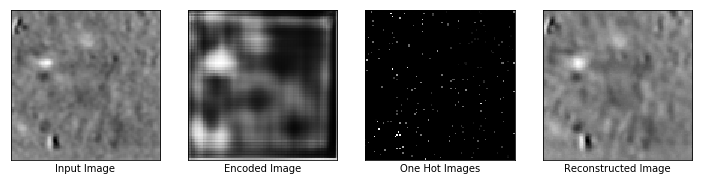

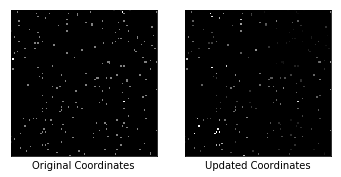

Epochs: 650, Reconstruction Loss: 0.0007103531388565898
Similarity Loss: 0.09285224974155426
Max Similarity scores: 0.8089663982391357
Updated Coordinates: [[[0.4440487  0.55560994]]]
Gradient global min:-0.001238219323568046, max:0.001299059484153986
Gradient partial min:-0.07411261647939682, max:0.11477617174386978



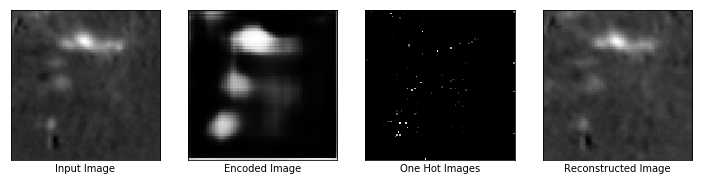

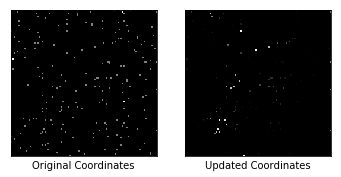

Epochs: 660, Reconstruction Loss: 0.0011499965330585837
Similarity Loss: 0.09438291192054749
Max Similarity scores: 0.821084201335907
Updated Coordinates: [[[0.4440462 0.5556105]]]
Gradient global min:-0.003877124981954694, max:0.00506992731243372
Gradient partial min:-0.0744924321770668, max:0.11798887699842453



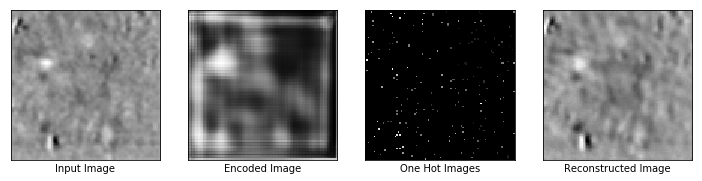

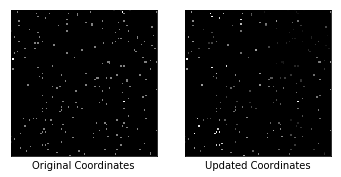

Epochs: 670, Reconstruction Loss: 0.0008286166121251881
Similarity Loss: 0.0814312994480133
Max Similarity scores: 0.8210697770118713
Updated Coordinates: [[[0.44404268 0.555613  ]]]
Gradient global min:-0.005061873234808445, max:0.004211336374282837
Gradient partial min:-0.06667599827051163, max:0.10420792549848557



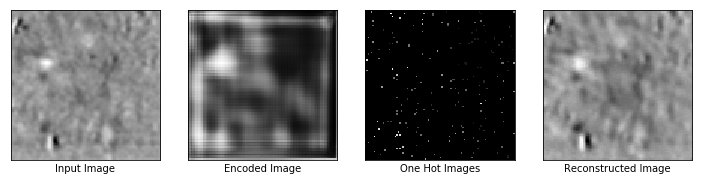

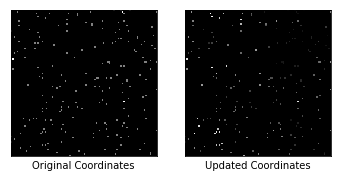

Epochs: 680, Reconstruction Loss: 0.001207496621645987
Similarity Loss: 0.0739988312125206
Max Similarity scores: 0.8197104930877686
Updated Coordinates: [[[0.4440352 0.5556155]]]
Gradient global min:-0.009747345931828022, max:0.007163699716329575
Gradient partial min:-0.0629454106092453, max:0.09737738966941833



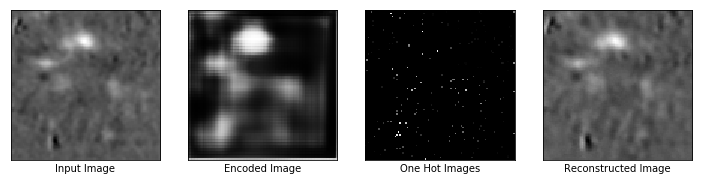

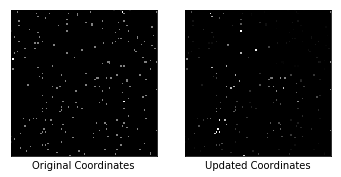

Epochs: 690, Reconstruction Loss: 0.0013703934382647276
Similarity Loss: 0.09293700009584427
Max Similarity scores: 0.8092650771141052
Updated Coordinates: [[[0.44403672 0.5556152 ]]]
Gradient global min:-0.0019013071432709694, max:0.001781681552529335
Gradient partial min:-0.0720522403717041, max:0.11372151225805283



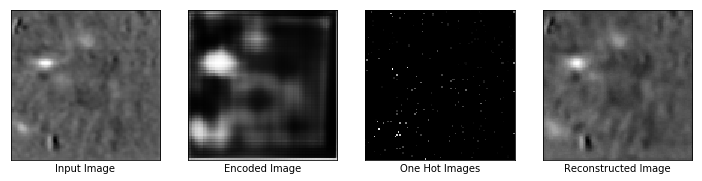

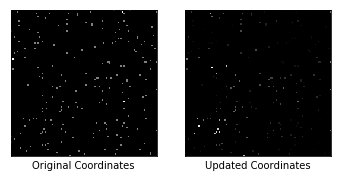

Epochs: 700, Reconstruction Loss: 0.0007869731052778661
Similarity Loss: 0.08194836229085922
Max Similarity scores: 0.8725600242614746
Updated Coordinates: [[[0.44403723 0.55561393]]]
Gradient global min:-0.0008576202671974897, max:0.0008855459745973349
Gradient partial min:-0.06862779706716537, max:0.10516451299190521



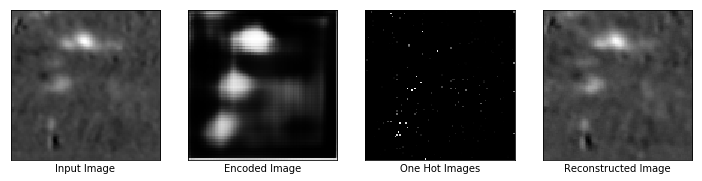

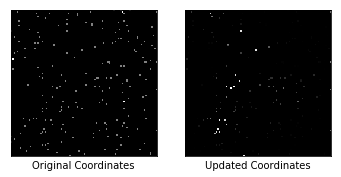

Epochs: 710, Reconstruction Loss: 0.0007334069814532995
Similarity Loss: 0.08063148707151413
Max Similarity scores: 0.8193833231925964
Updated Coordinates: [[[0.44403696 0.55561393]]]
Gradient global min:-0.0018319895025342703, max:0.0030018980614840984
Gradient partial min:-0.07068957388401031, max:0.10727456212043762



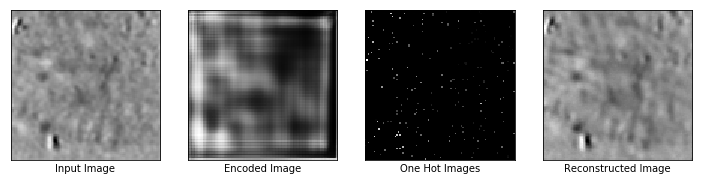

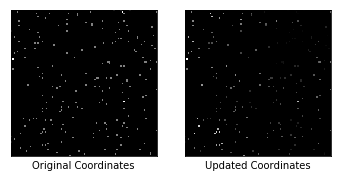

Epochs: 720, Reconstruction Loss: 0.0007084524258971214
Similarity Loss: 0.08205057680606842
Max Similarity scores: 0.8451246023178101
Updated Coordinates: [[[0.44403693 0.55561376]]]
Gradient global min:-0.0006158421747386456, max:0.00032372388523072004
Gradient partial min:-0.07430750876665115, max:0.1107635349035263



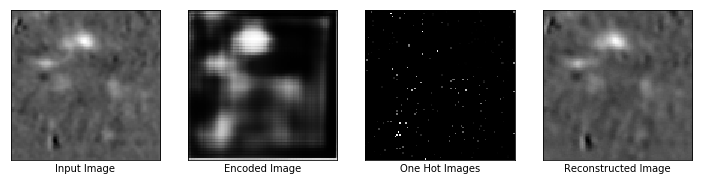

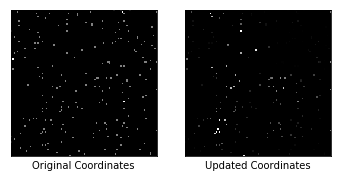

Epochs: 730, Reconstruction Loss: 0.0007313815876841545
Similarity Loss: 0.08045605570077896
Max Similarity scores: 0.7661628127098083
Updated Coordinates: [[[0.44403476 0.5556135 ]]]
Gradient global min:-0.0006808798061683774, max:0.0008976476965472102
Gradient partial min:-0.0751890167593956, max:0.11276035010814667



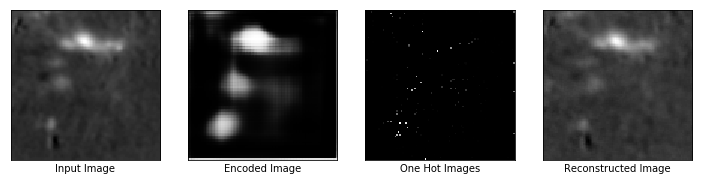

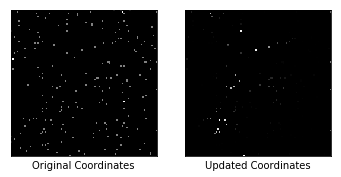

Epochs: 740, Reconstruction Loss: 0.000816100335214287
Similarity Loss: 0.08295479416847229
Max Similarity scores: 0.8114041090011597
Updated Coordinates: [[[0.44402742 0.555616  ]]]
Gradient global min:-0.0025068013928830624, max:0.0022622477263212204
Gradient partial min:-0.07548905164003372, max:0.11457976698875427



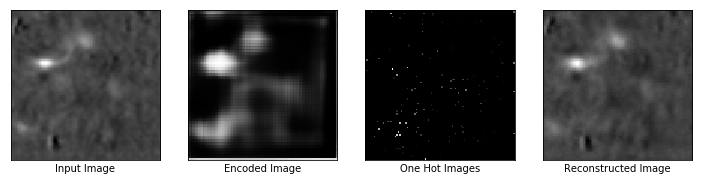

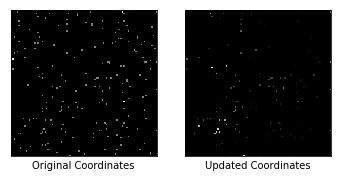

Epochs: 750, Reconstruction Loss: 0.0006560701294802129
Similarity Loss: 0.07703318446874619
Max Similarity scores: 0.8493924736976624
Updated Coordinates: [[[0.44403073 0.5556142 ]]]
Gradient global min:-0.0008427787106484175, max:0.0008617689018137753
Gradient partial min:-0.07617267966270447, max:0.1095484122633934



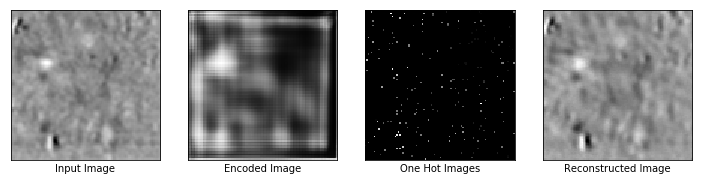

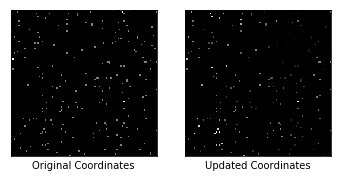

Epochs: 760, Reconstruction Loss: 0.0006325981812551618
Similarity Loss: 0.07877341657876968
Max Similarity scores: 0.8345508575439453
Updated Coordinates: [[[0.4440292 0.5556142]]]
Gradient global min:-0.0004849782562814653, max:0.00030974054243415594
Gradient partial min:-0.07983992993831635, max:0.11331117153167725



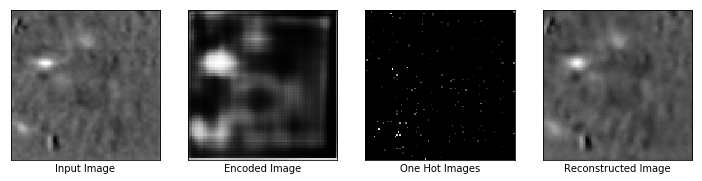

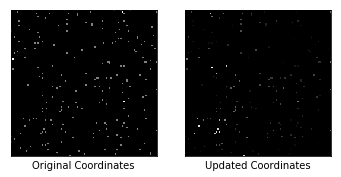

Epochs: 770, Reconstruction Loss: 0.0006189023260958493
Similarity Loss: 0.08159291744232178
Max Similarity scores: 0.8487701416015625
Updated Coordinates: [[[0.44402394 0.5556142 ]]]
Gradient global min:-0.0012723264517262578, max:0.0025807206984609365
Gradient partial min:-0.08428769558668137, max:0.11867493391036987



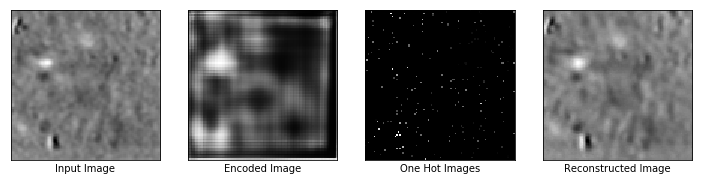

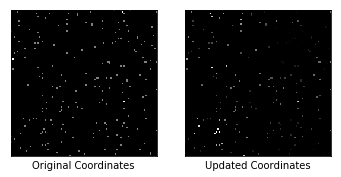

Epochs: 780, Reconstruction Loss: 0.0006245994591154158
Similarity Loss: 0.08447358757257462
Max Similarity scores: 0.8318334221839905
Updated Coordinates: [[[0.44401625 0.55561423]]]
Gradient global min:-0.002149438252672553, max:0.0043518454767763615
Gradient partial min:-0.08899947255849838, max:0.12453428655862808



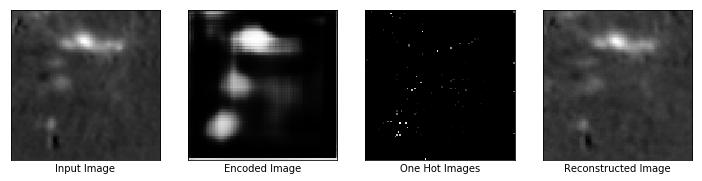

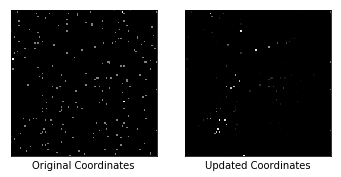

Epochs: 790, Reconstruction Loss: 0.0008213233086280525
Similarity Loss: 0.08588720858097076
Max Similarity scores: 0.8286359906196594
Updated Coordinates: [[[0.44401142 0.5556148 ]]]
Gradient global min:-0.0030398054514080286, max:0.004814598709344864
Gradient partial min:-0.09195422381162643, max:0.12819214165210724



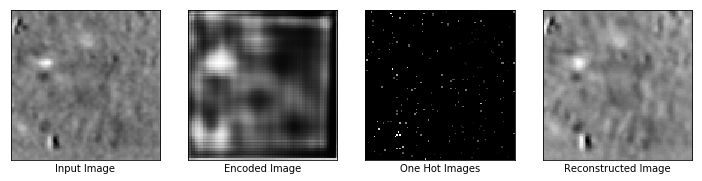

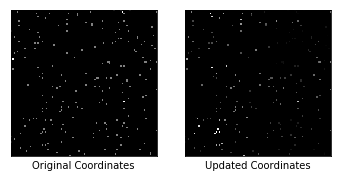

Epochs: 800, Reconstruction Loss: 0.0012306331191211939
Similarity Loss: 0.08807366341352463
Max Similarity scores: 0.8437371253967285
Updated Coordinates: [[[0.4440135 0.5556126]]]
Gradient global min:-0.006030241027474403, max:0.012139258906245232
Gradient partial min:-0.09155464172363281, max:0.12792356312274933



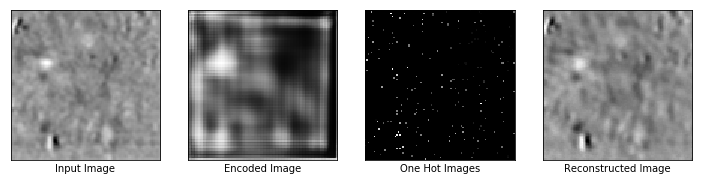

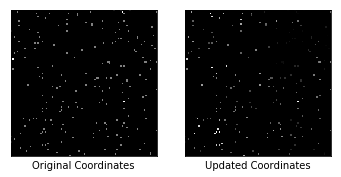

Epochs: 810, Reconstruction Loss: 0.0007239790866151452
Similarity Loss: 0.0778651237487793
Max Similarity scores: 0.8414083123207092
Updated Coordinates: [[[0.44400263 0.5556191 ]]]
Gradient global min:-0.0008947325404733419, max:0.0008788052946329117
Gradient partial min:-0.08752170205116272, max:0.11786279082298279



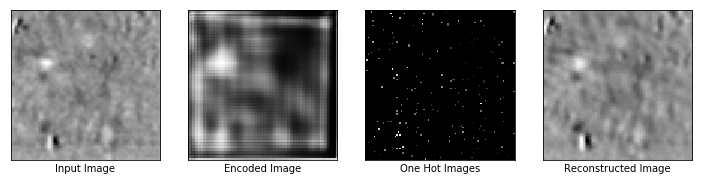

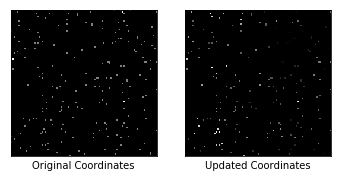

Epochs: 820, Reconstruction Loss: 0.0006478172144852579
Similarity Loss: 0.0755983293056488
Max Similarity scores: 0.8378059267997742
Updated Coordinates: [[[0.44400024 0.5556193 ]]]
Gradient global min:-0.0012439481215551496, max:0.0007599667878821492
Gradient partial min:-0.08804317563772202, max:0.1157429963350296



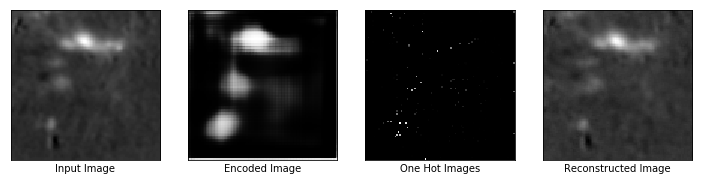

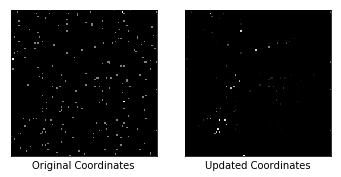

Epochs: 830, Reconstruction Loss: 0.0006121749756857753
Similarity Loss: 0.07601089030504227
Max Similarity scores: 0.8225761651992798
Updated Coordinates: [[[0.4440026 0.5556189]]]
Gradient global min:-0.0009910991648212075, max:0.001284835976548493
Gradient partial min:-0.09087573736906052, max:0.11798534542322159



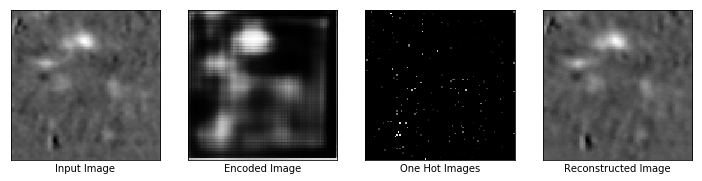

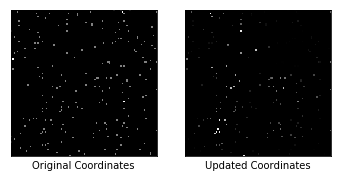

Epochs: 840, Reconstruction Loss: 0.0005953522049821913
Similarity Loss: 0.07696103304624557
Max Similarity scores: 0.7736056447029114
Updated Coordinates: [[[0.44400546 0.5556189 ]]]
Gradient global min:-0.0002714970614761114, max:0.0003035870031453669
Gradient partial min:-0.09425611793994904, max:0.12063482403755188



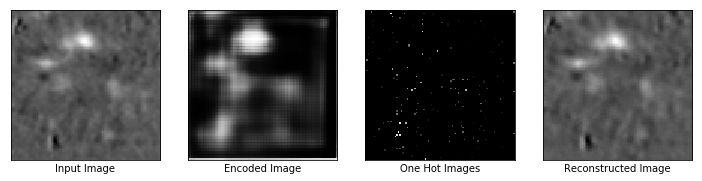

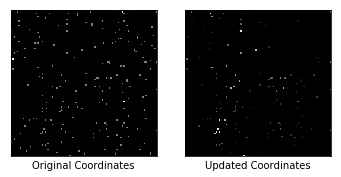

Epochs: 850, Reconstruction Loss: 0.0006918637081980705
Similarity Loss: 0.07368495315313339
Max Similarity scores: 0.778057873249054
Updated Coordinates: [[[0.44400778 0.5556184 ]]]
Gradient global min:-0.0010006544180214405, max:0.0011639581061899662
Gradient partial min:-0.09327445924282074, max:0.11816149950027466



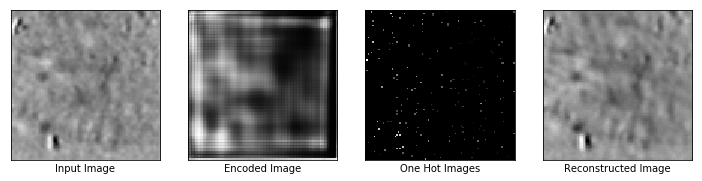

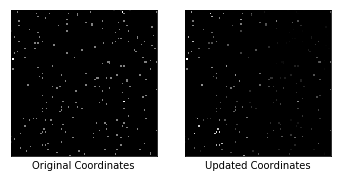

Epochs: 860, Reconstruction Loss: 0.0009712312603369355
Similarity Loss: 0.0667366087436676
Max Similarity scores: 0.8049066662788391
Updated Coordinates: [[[0.44400474 0.55561835]]]
Gradient global min:-0.0030966284684836864, max:0.002311950083822012
Gradient partial min:-0.0880947858095169, max:0.10941623151302338



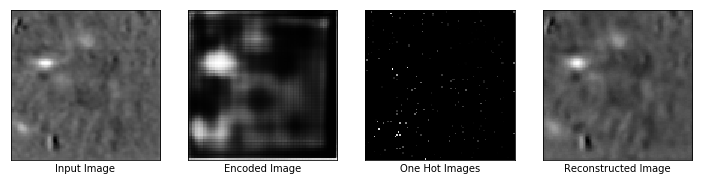

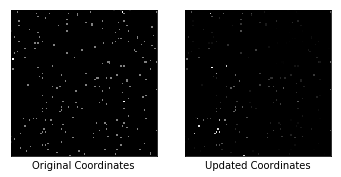

Epochs: 870, Reconstruction Loss: 0.0006330642499960959
Similarity Loss: 0.07035794854164124
Max Similarity scores: 0.8245126008987427
Updated Coordinates: [[[0.44399473 0.5556227 ]]]
Gradient global min:-0.005039290990680456, max:0.002672354457899928
Gradient partial min:-0.09235043823719025, max:0.1151086613535881



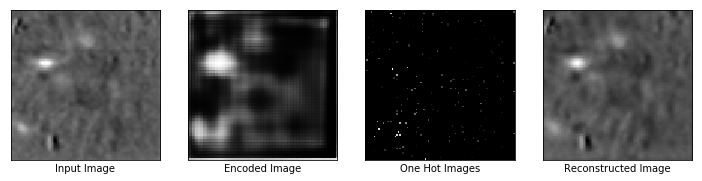

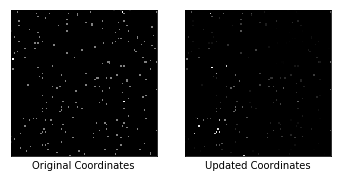

Epochs: 880, Reconstruction Loss: 0.0006059972802177072
Similarity Loss: 0.07250215113162994
Max Similarity scores: 0.8242301344871521
Updated Coordinates: [[[0.44399253 0.55562305]]]
Gradient global min:-0.0013495917664840817, max:0.0016791695961728692
Gradient partial min:-0.0962853878736496, max:0.1185155063867569



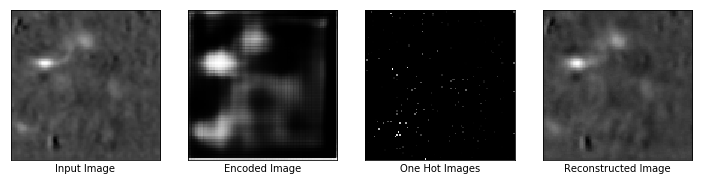

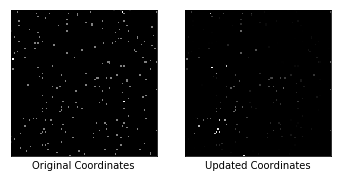

Epochs: 890, Reconstruction Loss: 0.000588538940064609
Similarity Loss: 0.07537318021059036
Max Similarity scores: 0.8142901062965393
Updated Coordinates: [[[0.4439921 0.5556227]]]
Gradient global min:-0.0015661587240174413, max:0.001560895936563611
Gradient partial min:-0.10181634873151779, max:0.12456316500902176



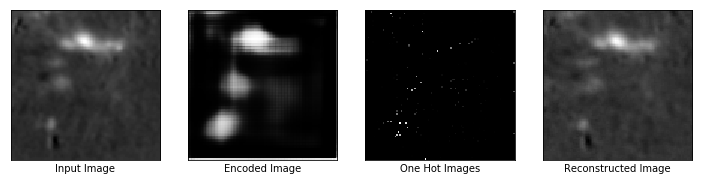

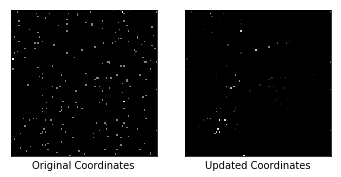

Epochs: 900, Reconstruction Loss: 0.0007409734535031021
Similarity Loss: 0.07174009084701538
Max Similarity scores: 0.810497522354126
Updated Coordinates: [[[0.44399142 0.55562246]]]
Gradient global min:-0.004784482531249523, max:0.004005552269518375
Gradient partial min:-0.09916521608829498, max:0.12128324806690216



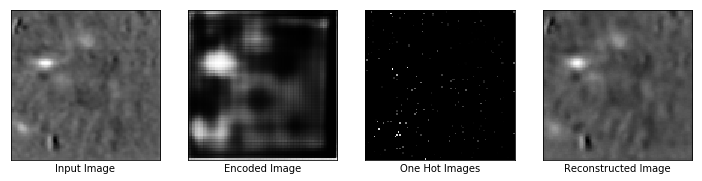

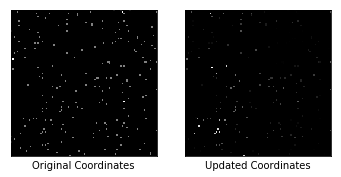

Epochs: 910, Reconstruction Loss: 0.000622801948338747
Similarity Loss: 0.07453096657991409
Max Similarity scores: 0.8403216600418091
Updated Coordinates: [[[0.44399086 0.5556216 ]]]
Gradient global min:-0.0013100539799779654, max:0.002156778471544385
Gradient partial min:-0.10438019782304764, max:0.12645433843135834



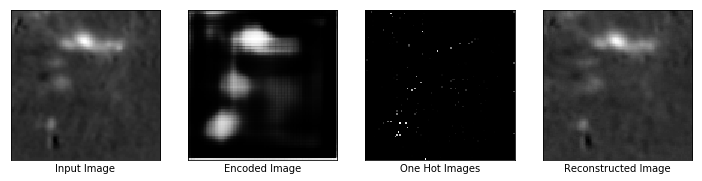

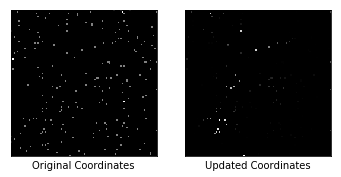

Epochs: 920, Reconstruction Loss: 0.0005895600188523531
Similarity Loss: 0.07323046773672104
Max Similarity scores: 0.8179921507835388
Updated Coordinates: [[[0.44399342 0.5556216 ]]]
Gradient global min:-0.000715314585249871, max:0.001552065135911107
Gradient partial min:-0.10472766309976578, max:0.1259855031967163



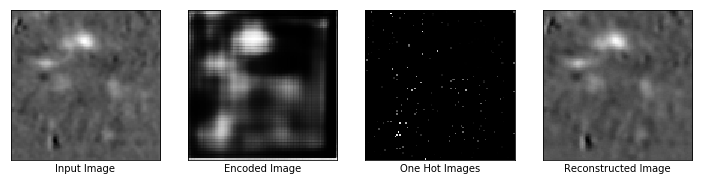

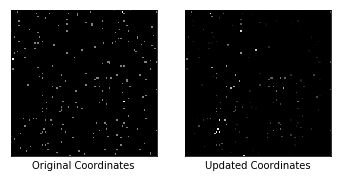

Epochs: 930, Reconstruction Loss: 0.0005615330883301795
Similarity Loss: 0.07397476583719254
Max Similarity scores: 0.7944607734680176
Updated Coordinates: [[[0.4439952 0.5556216]]]
Gradient global min:-0.0004842143680434674, max:0.0005643540062010288
Gradient partial min:-0.10790249705314636, max:0.1285276859998703



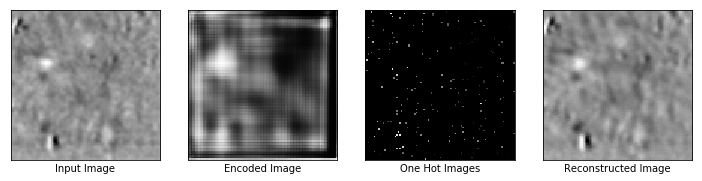

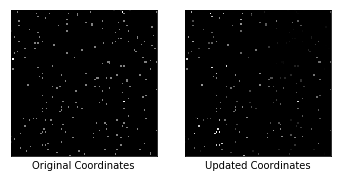

Epochs: 940, Reconstruction Loss: 0.0005515259690582752
Similarity Loss: 0.07597838342189789
Max Similarity scores: 0.8744609355926514
Updated Coordinates: [[[0.44399515 0.5556216 ]]]
Gradient global min:-0.002306369598954916, max:0.0025140205398201942
Gradient partial min:-0.11245865374803543, max:0.13240095973014832



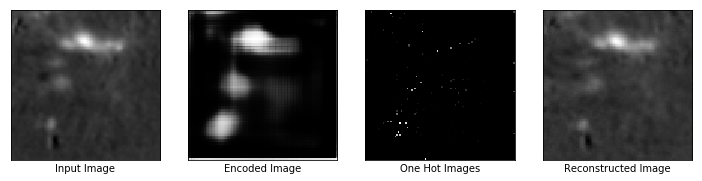

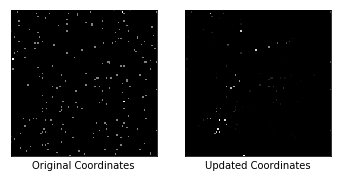

Epochs: 950, Reconstruction Loss: 0.0006255269981920719
Similarity Loss: 0.0723673552274704
Max Similarity scores: 0.8158735036849976
Updated Coordinates: [[[0.4439989 0.5556196]]]
Gradient global min:-0.0024757906794548035, max:0.002390880836173892
Gradient partial min:-0.10901134461164474, max:0.12749910354614258



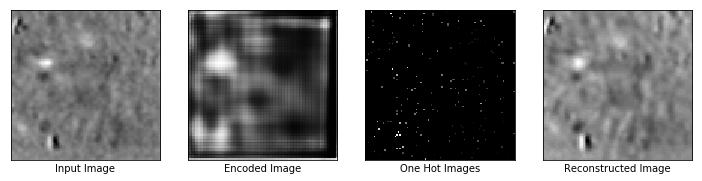

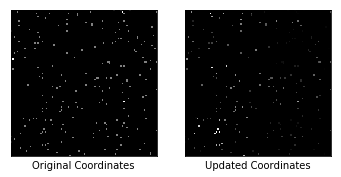

Epochs: 960, Reconstruction Loss: 0.000908256450202316
Similarity Loss: 0.08105220645666122
Max Similarity scores: 0.8660516738891602
Updated Coordinates: [[[0.4439942 0.5556214]]]
Gradient global min:-0.0026690149679780006, max:0.003969916142523289
Gradient partial min:-0.11170584708452225, max:0.1346571445465088



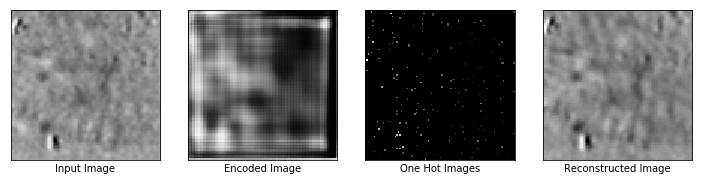

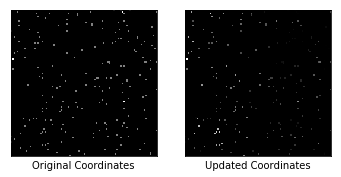

Epochs: 970, Reconstruction Loss: 0.0008410870796069503
Similarity Loss: 0.07925210893154144
Max Similarity scores: 0.8828916549682617
Updated Coordinates: [[[0.4439864  0.55562645]]]
Gradient global min:-0.0007027076790109277, max:0.0012326225405558944
Gradient partial min:-0.11625205725431442, max:0.13602709770202637



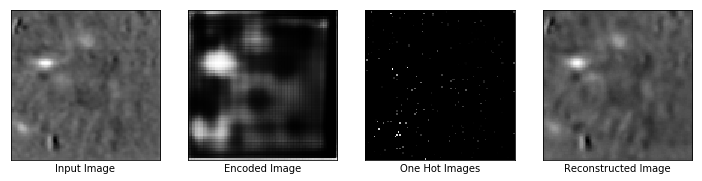

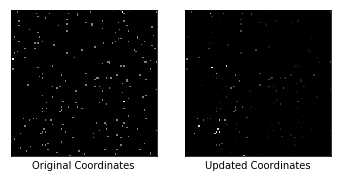

Epochs: 980, Reconstruction Loss: 0.0007326782215386629
Similarity Loss: 0.07716696709394455
Max Similarity scores: 0.8616665005683899
Updated Coordinates: [[[0.44398034 0.5556267 ]]]
Gradient global min:-0.0016051825368776917, max:0.002447061240673065
Gradient partial min:-0.11558564007282257, max:0.13407708704471588



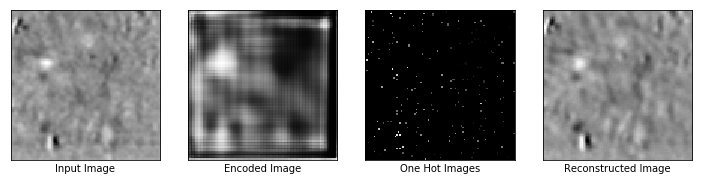

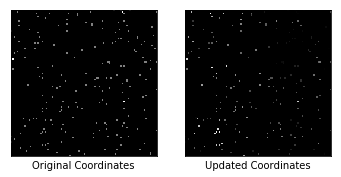

Epochs: 990, Reconstruction Loss: 0.0006393013754859567
Similarity Loss: 0.07495918869972229
Max Similarity scores: 0.8959171175956726
Updated Coordinates: [[[0.443977  0.5556267]]]
Gradient global min:-0.0011010396992787719, max:0.0015762416878715158
Gradient partial min:-0.11422861367464066, max:0.13112634420394897



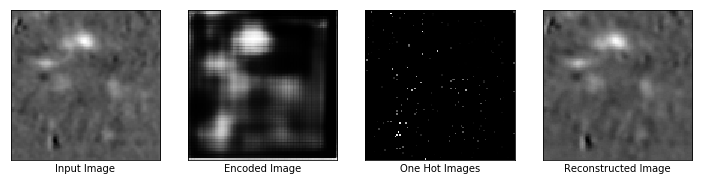

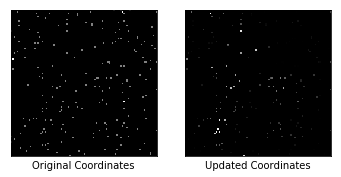

Epochs: 1000, Reconstruction Loss: 0.0005998213309794664
Similarity Loss: 0.07358653098344803
Max Similarity scores: 0.7871674299240112
Updated Coordinates: [[[0.44397435 0.5556267 ]]]
Gradient global min:-0.0005616031121462584, max:0.0007369039230979979
Gradient partial min:-0.11435116082429886, max:0.1293070763349533



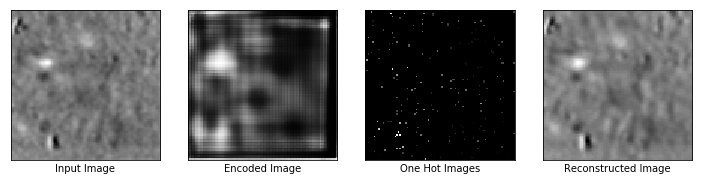

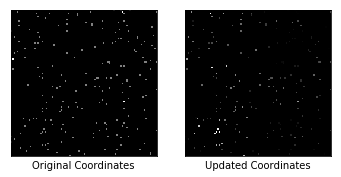

Epochs: 1010, Reconstruction Loss: 0.0005912046763114631
Similarity Loss: 0.07275588065385818
Max Similarity scores: 0.8375716805458069
Updated Coordinates: [[[0.44397232 0.5556267 ]]]
Gradient global min:-0.002068728907033801, max:0.00153601192869246
Gradient partial min:-0.1154768243432045, max:0.128423810005188



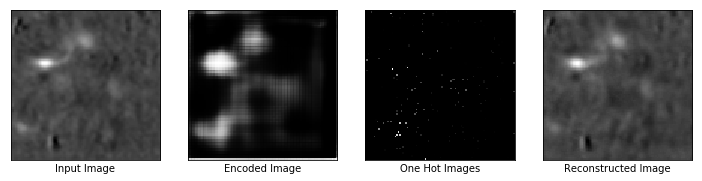

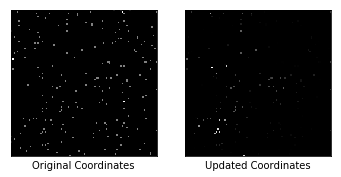

Epochs: 1020, Reconstruction Loss: 0.0006733486079610884
Similarity Loss: 0.07697416096925735
Max Similarity scores: 0.8521357774734497
Updated Coordinates: [[[0.44396478 0.5556298 ]]]
Gradient global min:-0.0016220516990870237, max:0.0014730890979990363
Gradient partial min:-0.11818301677703857, max:0.13460907340049744



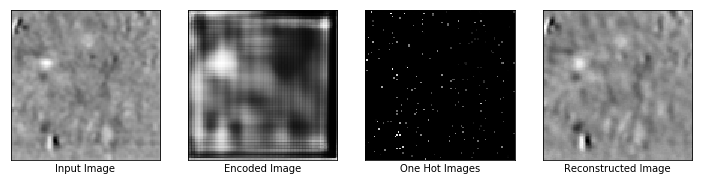

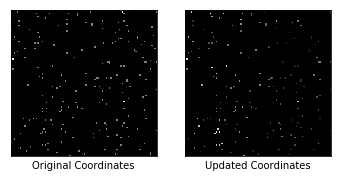

Epochs: 1030, Reconstruction Loss: 0.0009271107846871018
Similarity Loss: 0.07857513427734375
Max Similarity scores: 0.9129915833473206
Updated Coordinates: [[[0.4439635  0.55562997]]]
Gradient global min:-0.0036056507378816605, max:0.005561884958297014
Gradient partial min:-0.11825650930404663, max:0.13193513453006744



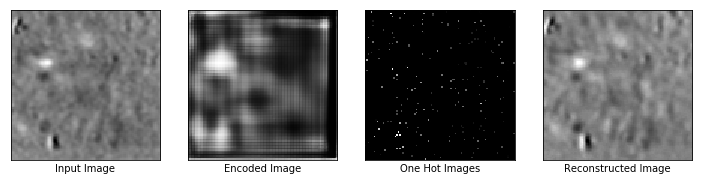

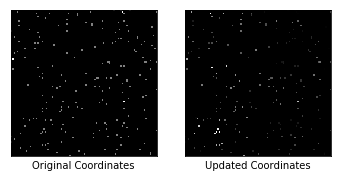

Epochs: 1040, Reconstruction Loss: 0.0009984078351408243
Similarity Loss: 0.08814875781536102
Max Similarity scores: 0.8815075159072876
Updated Coordinates: [[[0.44397357 0.55562377]]]
Gradient global min:-0.003266500774770975, max:0.0038214351516216993
Gradient partial min:-0.12086247652769089, max:0.1366434544324875



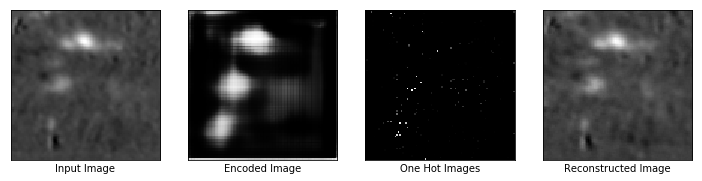

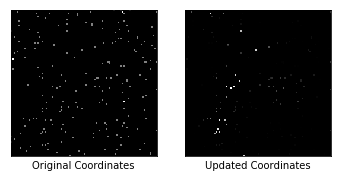

Epochs: 1050, Reconstruction Loss: 0.0008884383132681251
Similarity Loss: 0.08690201491117477
Max Similarity scores: 0.8516178727149963
Updated Coordinates: [[[0.44397345 0.55562425]]]
Gradient global min:-0.005311047192662954, max:0.00405146973207593
Gradient partial min:-0.11952824145555496, max:0.1335819959640503



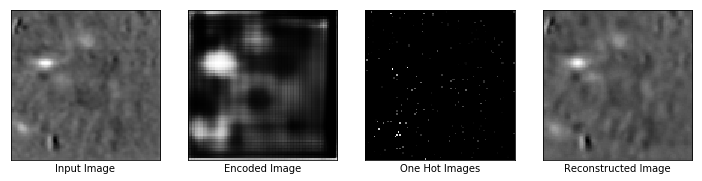

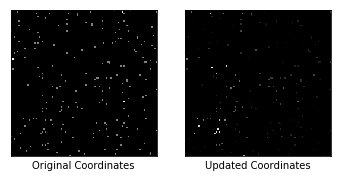

Epochs: 1060, Reconstruction Loss: 0.0008074499201029539
Similarity Loss: 0.08727212995290756
Max Similarity scores: 0.88326096534729
Updated Coordinates: [[[0.4439727 0.5556246]]]
Gradient global min:-0.0075958287343382835, max:0.00844806618988514
Gradient partial min:-0.11906611174345016, max:0.13233636319637299



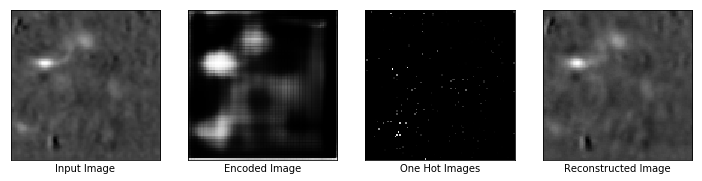

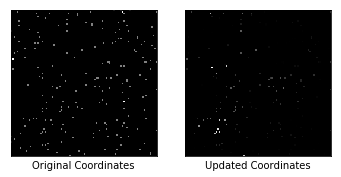

Epochs: 1070, Reconstruction Loss: 0.0007233684882521629
Similarity Loss: 0.08760645985603333
Max Similarity scores: 0.8792040944099426
Updated Coordinates: [[[0.4439717  0.55562544]]]
Gradient global min:-0.003183291759341955, max:0.0021817104425281286
Gradient partial min:-0.11827845126390457, max:0.1320306360721588



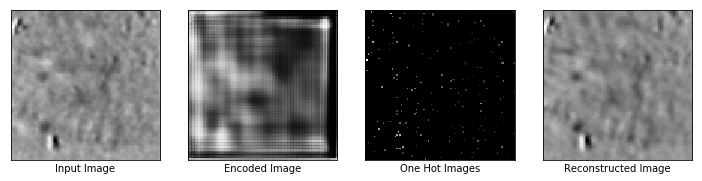

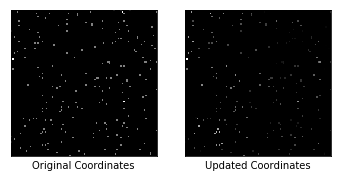

Epochs: 1080, Reconstruction Loss: 0.0006310229073278606
Similarity Loss: 0.08597934246063232
Max Similarity scores: 0.8913264274597168
Updated Coordinates: [[[0.4439697 0.5556273]]]
Gradient global min:-0.00045836219214834273, max:0.0005401382804848254
Gradient partial min:-0.11608193069696426, max:0.1295146942138672



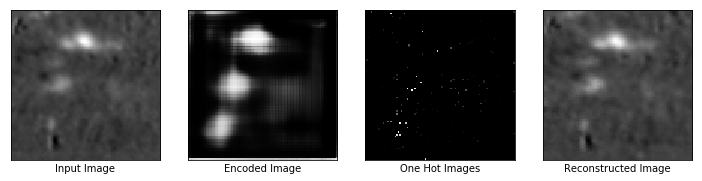

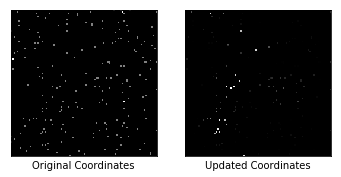

Epochs: 1090, Reconstruction Loss: 0.0005631139501929283
Similarity Loss: 0.08228942006826401
Max Similarity scores: 0.8456773161888123
Updated Coordinates: [[[0.44396594 0.55562943]]]
Gradient global min:-0.0009781543631106615, max:0.00044525664998218417
Gradient partial min:-0.11321031302213669, max:0.1255188137292862



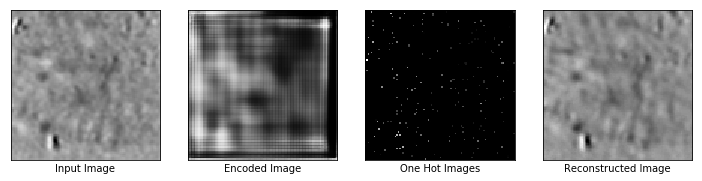

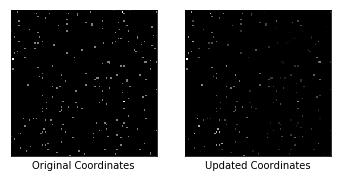

Epochs: 1100, Reconstruction Loss: 0.000537540705408901
Similarity Loss: 0.08038163185119629
Max Similarity scores: 0.8811395764350891
Updated Coordinates: [[[0.4439625  0.55562985]]]
Gradient global min:-9.32447292143479e-05, max:9.43889026530087e-05
Gradient partial min:-0.11259745061397552, max:0.12372534722089767



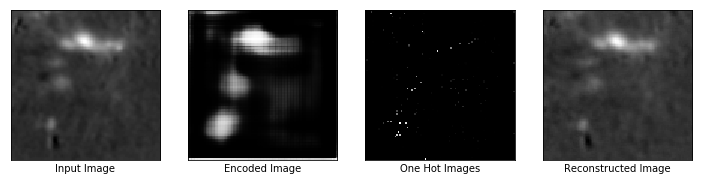

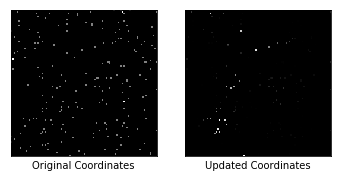

Epochs: 1110, Reconstruction Loss: 0.0005203980254009366
Similarity Loss: 0.08037211745977402
Max Similarity scores: 0.8237417936325073
Updated Coordinates: [[[0.44396102 0.55562985]]]
Gradient global min:-0.00047388928942382336, max:0.0004289536736905575
Gradient partial min:-0.11364491283893585, max:0.12318767607212067



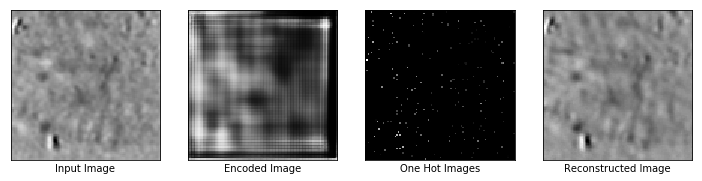

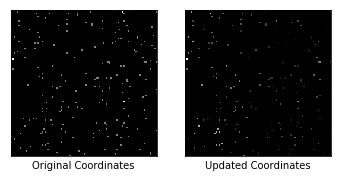

Epochs: 1120, Reconstruction Loss: 0.0005147926276549697
Similarity Loss: 0.08154533058404922
Max Similarity scores: 0.8926248550415039
Updated Coordinates: [[[0.443958   0.55562985]]]
Gradient global min:-0.00015530281234532595, max:8.548567711841315e-05
Gradient partial min:-0.11624077707529068, max:0.12466394901275635



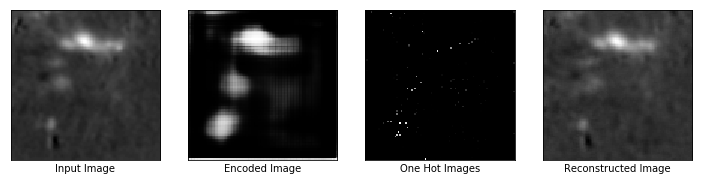

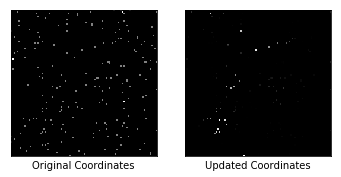

Epochs: 1130, Reconstruction Loss: 0.0007215182413347065
Similarity Loss: 0.08468641340732574
Max Similarity scores: 0.8196162581443787
Updated Coordinates: [[[0.44395489 0.5556299 ]]]
Gradient global min:-0.002815946703776717, max:0.001240844838321209
Gradient partial min:-0.11310843378305435, max:0.12510164082050323



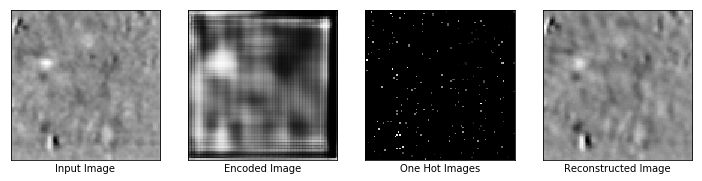

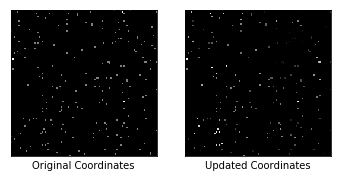

Epochs: 1140, Reconstruction Loss: 0.000594747718423605
Similarity Loss: 0.0879916399717331
Max Similarity scores: 0.9270001649856567
Updated Coordinates: [[[0.44395527 0.55562997]]]
Gradient global min:-0.0038456821348518133, max:0.004990249872207642
Gradient partial min:-0.11841490119695663, max:0.12859459221363068



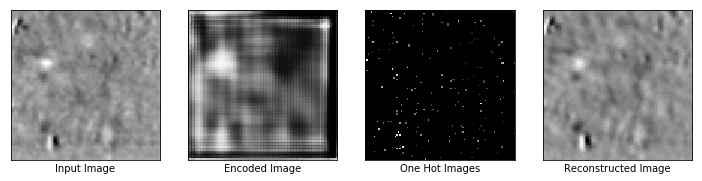

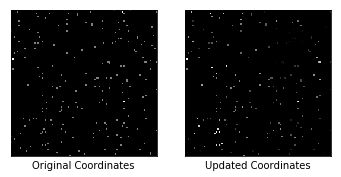

Epochs: 1150, Reconstruction Loss: 0.0005150320357643068
Similarity Loss: 0.08251774311065674
Max Similarity scores: 0.9239364266395569
Updated Coordinates: [[[0.44395548 0.55562997]]]
Gradient global min:-0.0011435210471972823, max:0.000921084894798696
Gradient partial min:-0.11586165428161621, max:0.12297908216714859



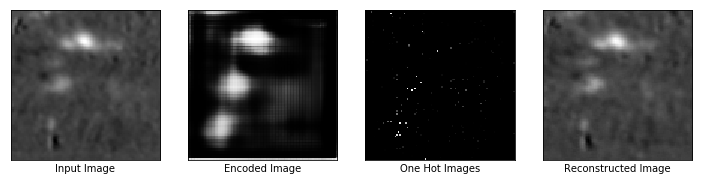

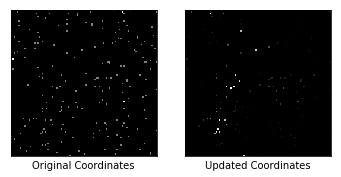

Epochs: 1160, Reconstruction Loss: 0.0004970633308403194
Similarity Loss: 0.08145615458488464
Max Similarity scores: 0.8428739905357361
Updated Coordinates: [[[0.4439553  0.55562997]]]
Gradient global min:-0.0002419279480818659, max:0.00038586556911468506
Gradient partial min:-0.11648217588663101, max:0.12173046916723251



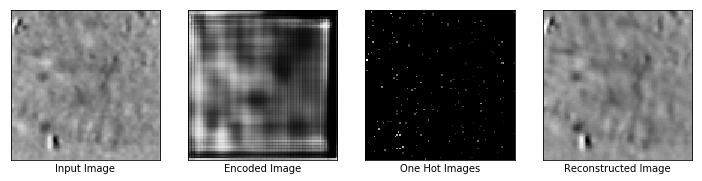

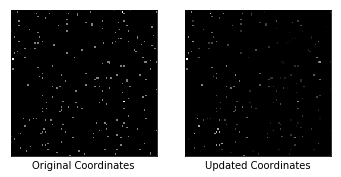

Epochs: 1170, Reconstruction Loss: 0.00048187156789936125
Similarity Loss: 0.08273376524448395
Max Similarity scores: 0.8956656455993652
Updated Coordinates: [[[0.4439553  0.55562997]]]
Gradient global min:-0.00026455309125594795, max:4.4317523133940995e-05
Gradient partial min:-0.11875823885202408, max:0.12301705777645111



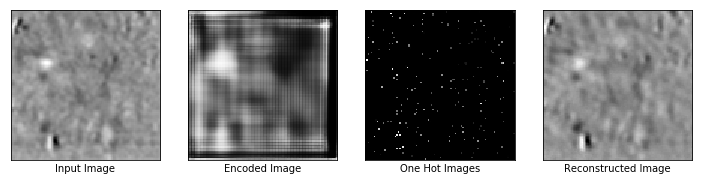

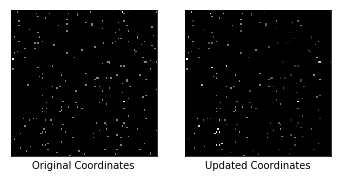

Epochs: 1180, Reconstruction Loss: 0.0005813942989334464
Similarity Loss: 0.08803240954875946
Max Similarity scores: 0.930594801902771
Updated Coordinates: [[[0.4439535  0.55562943]]]
Gradient global min:-0.007233767304569483, max:0.007744028698652983
Gradient partial min:-0.12376227229833603, max:0.1274818629026413



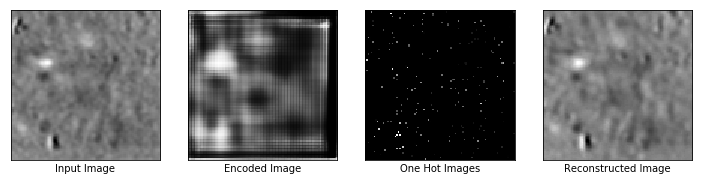

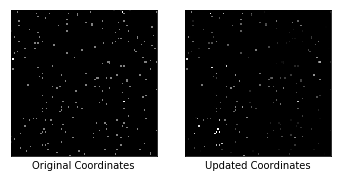

Epochs: 1190, Reconstruction Loss: 0.0008741631754674017
Similarity Loss: 0.09679891169071198
Max Similarity scores: 0.9123337864875793
Updated Coordinates: [[[0.4439514  0.55562955]]]
Gradient global min:-0.004782614763826132, max:0.005868394859135151
Gradient partial min:-0.1259366124868393, max:0.13381609320640564



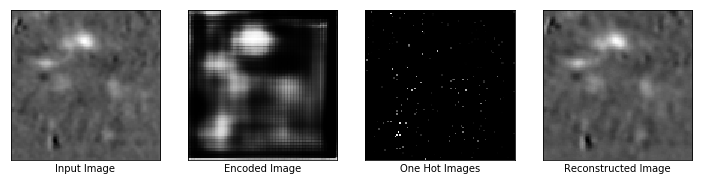

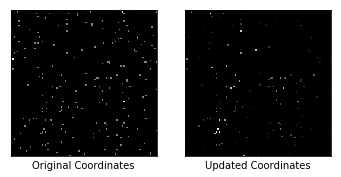

Epochs: 1200, Reconstruction Loss: 0.0007049910491332412
Similarity Loss: 0.092952661216259
Max Similarity scores: 0.8583036661148071
Updated Coordinates: [[[0.4439547  0.55562717]]]
Gradient global min:-0.0017811842262744904, max:0.0014238139847293496
Gradient partial min:-0.12253585457801819, max:0.13041478395462036



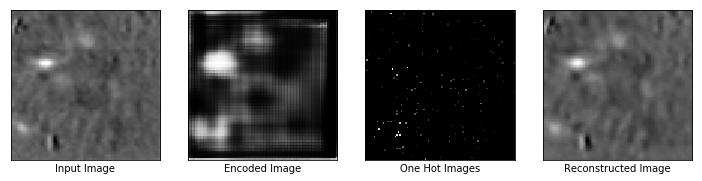

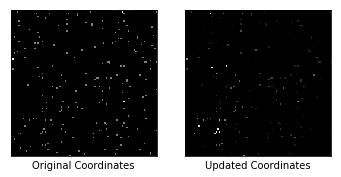

Epochs: 1210, Reconstruction Loss: 0.0006811443599872291
Similarity Loss: 0.09416156262159348
Max Similarity scores: 0.8897397518157959
Updated Coordinates: [[[0.4439562 0.5556261]]]
Gradient global min:-0.0067766946740448475, max:0.007466191425919533
Gradient partial min:-0.12157046049833298, max:0.13084931671619415



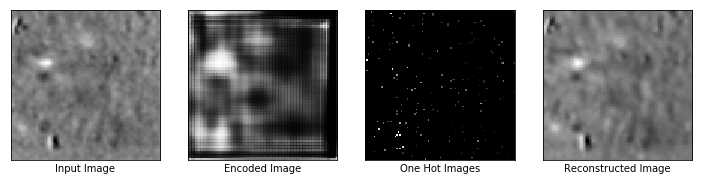

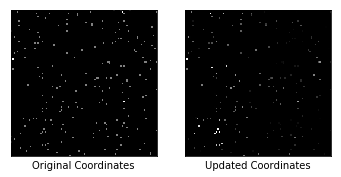

Epochs: 1220, Reconstruction Loss: 0.0019531247671693563
Similarity Loss: 0.08958429098129272
Max Similarity scores: 0.9174236059188843
Updated Coordinates: [[[0.44396028 0.5556245 ]]]
Gradient global min:-0.005819226615130901, max:0.007769032381474972
Gradient partial min:-0.12375441938638687, max:0.1255120486021042



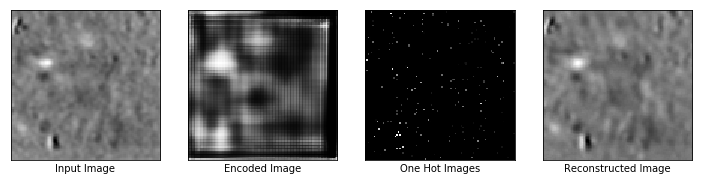

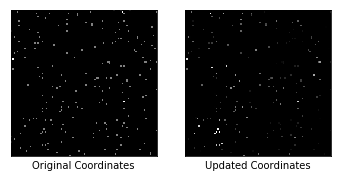

Epochs: 1230, Reconstruction Loss: 0.0007703036535531282
Similarity Loss: 0.08458078652620316
Max Similarity scores: 0.892709493637085
Updated Coordinates: [[[0.44394553 0.55563223]]]
Gradient global min:-0.0021994581911712885, max:0.0017992560751736164
Gradient partial min:-0.10328826308250427, max:0.11788889020681381



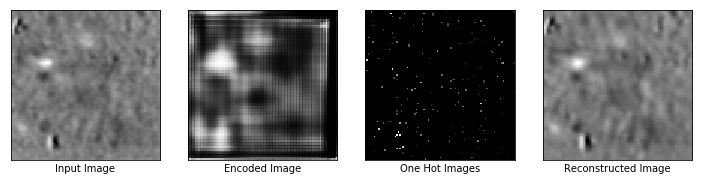

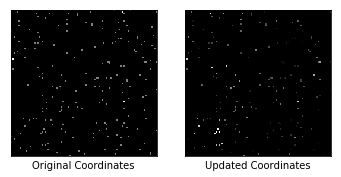

Epochs: 1240, Reconstruction Loss: 0.0006381247658282518
Similarity Loss: 0.08633077144622803
Max Similarity scores: 0.8994352221488953
Updated Coordinates: [[[0.44393808 0.55563635]]]
Gradient global min:-0.0010901857167482376, max:0.0008002251270227134
Gradient partial min:-0.10454314947128296, max:0.11897700279951096



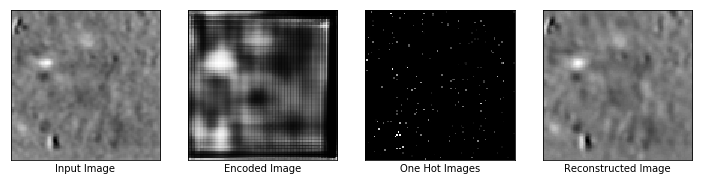

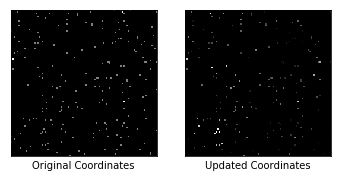

Epochs: 1250, Reconstruction Loss: 0.000560510263312608
Similarity Loss: 0.08767270296812057
Max Similarity scores: 0.9062952995300293
Updated Coordinates: [[[0.44393694 0.55563647]]]
Gradient global min:-0.0001816918229451403, max:0.0001653095823712647
Gradient partial min:-0.10728868842124939, max:0.12019239366054535



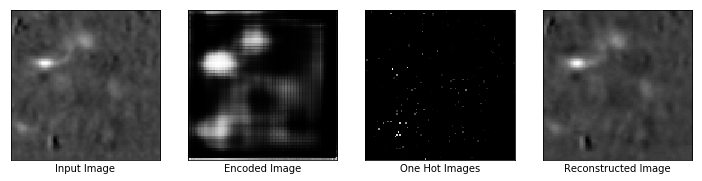

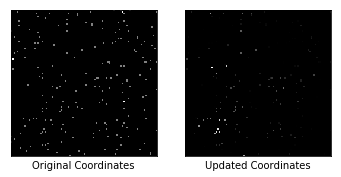

Epochs: 1260, Reconstruction Loss: 0.0005249583045952022
Similarity Loss: 0.08872417360544205
Max Similarity scores: 0.8799586892127991
Updated Coordinates: [[[0.44393715 0.5556365 ]]]
Gradient global min:-0.0007215682999230921, max:0.0006885425536893308
Gradient partial min:-0.11049048602581024, max:0.12160243093967438



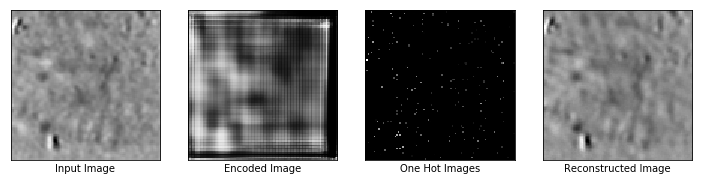

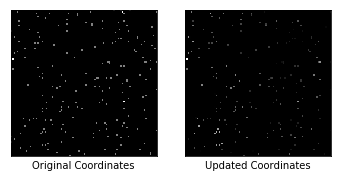

Epochs: 1270, Reconstruction Loss: 0.0005009360029362142
Similarity Loss: 0.09036335349082947
Max Similarity scores: 0.8897400498390198
Updated Coordinates: [[[0.44393674 0.5556365 ]]]
Gradient global min:-0.00035876614856533706, max:0.00022794271353632212
Gradient partial min:-0.11416035145521164, max:0.12416249513626099



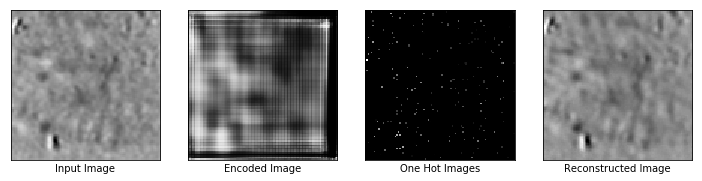

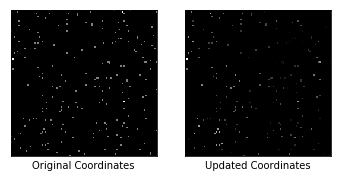

Epochs: 1280, Reconstruction Loss: 0.00047747744247317314
Similarity Loss: 0.09167038649320602
Max Similarity scores: 0.8890966773033142
Updated Coordinates: [[[0.44393587 0.5556365 ]]]
Gradient global min:-0.0003342883428558707, max:0.00021655925957020372
Gradient partial min:-0.11642442643642426, max:0.12671157717704773



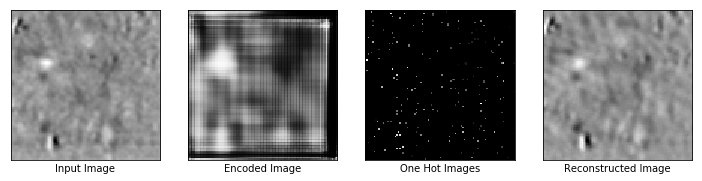

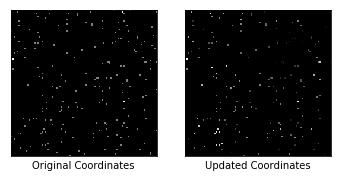

Epochs: 1290, Reconstruction Loss: 0.000489288242533803
Similarity Loss: 0.0944884717464447
Max Similarity scores: 0.8932934403419495
Updated Coordinates: [[[0.4439345 0.5556365]]]
Gradient global min:-0.004724516998976469, max:0.003810883266851306
Gradient partial min:-0.11858487129211426, max:0.13003011047840118



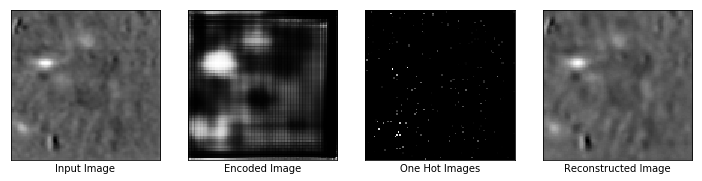

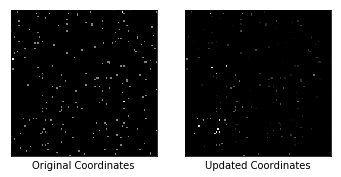

Epochs: 1300, Reconstruction Loss: 0.0006628689588978887
Similarity Loss: 0.09549354016780853
Max Similarity scores: 0.9167036414146423
Updated Coordinates: [[[0.4439347 0.5556353]]]
Gradient global min:-0.002695984672755003, max:0.002714676782488823
Gradient partial min:-0.11450792849063873, max:0.12892337143421173



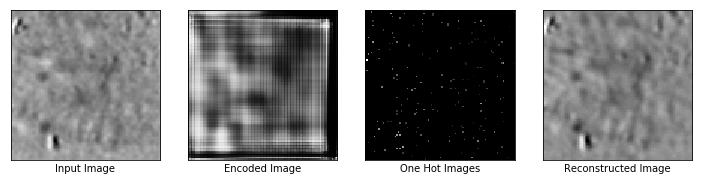

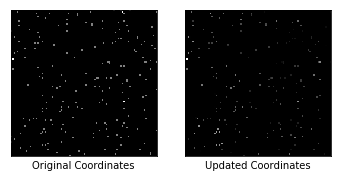

Epochs: 1310, Reconstruction Loss: 0.0007303990423679352
Similarity Loss: 0.0999123752117157
Max Similarity scores: 0.9056127071380615
Updated Coordinates: [[[0.44392332 0.5556399 ]]]
Gradient global min:-0.0004711633955594152, max:0.00013905021478421986
Gradient partial min:-0.11335362493991852, max:0.12793011963367462



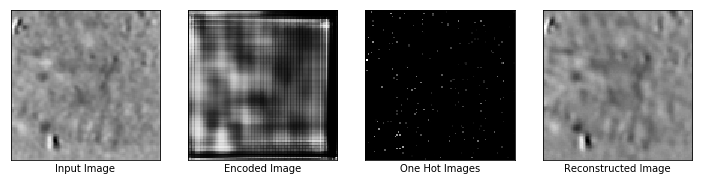

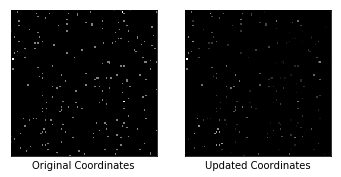

Epochs: 1320, Reconstruction Loss: 0.0008081335108727217
Similarity Loss: 0.07909834384918213
Max Similarity scores: 0.8771219849586487
Updated Coordinates: [[[0.4439063 0.5556487]]]
Gradient global min:-0.001014426234178245, max:0.0007878424366936088
Gradient partial min:-0.09788694977760315, max:0.11013741791248322



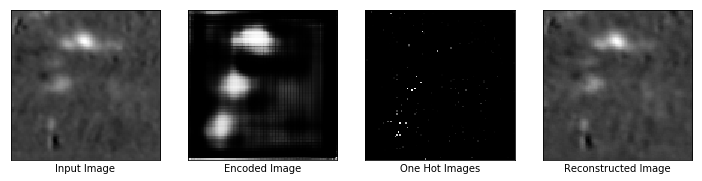

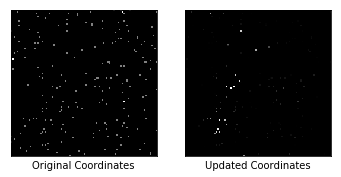

Epochs: 1330, Reconstruction Loss: 0.0006972155533730984
Similarity Loss: 0.07616965472698212
Max Similarity scores: 0.8786775469779968
Updated Coordinates: [[[0.44388726 0.5556619 ]]]
Gradient global min:-0.0028115571476519108, max:0.0017788984114304185
Gradient partial min:-0.09403593093156815, max:0.10476039350032806



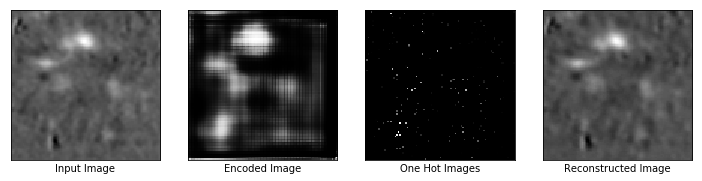

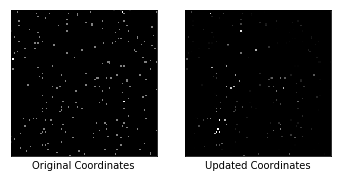

Epochs: 1340, Reconstruction Loss: 0.0006048949435353279
Similarity Loss: 0.07940855622291565
Max Similarity scores: 0.8290890455245972
Updated Coordinates: [[[0.44388187 0.5556647 ]]]
Gradient global min:-0.0005841641104780138, max:0.0004009237454738468
Gradient partial min:-0.09720008075237274, max:0.10886969417333603



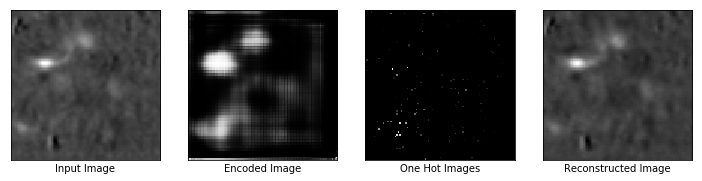

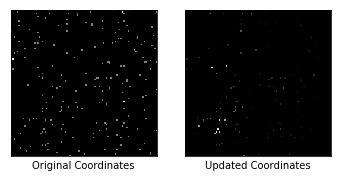

Epochs: 1350, Reconstruction Loss: 0.0005435030907392502
Similarity Loss: 0.08370453864336014
Max Similarity scores: 0.9096719622612
Updated Coordinates: [[[0.44387293 0.55566823]]]
Gradient global min:-0.0008051408804021776, max:0.0006110088434070349
Gradient partial min:-0.10172637552022934, max:0.11360979080200195



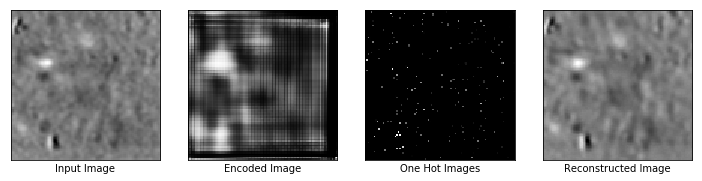

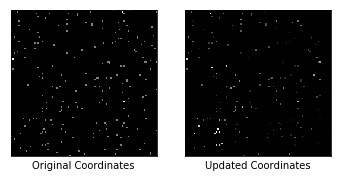

Epochs: 1360, Reconstruction Loss: 0.0005040805554017425
Similarity Loss: 0.08456902205944061
Max Similarity scores: 0.9149110317230225
Updated Coordinates: [[[0.44386822 0.5556713 ]]]
Gradient global min:-0.0010046518873423338, max:0.000802152615506202
Gradient partial min:-0.10293148458003998, max:0.11491174250841141



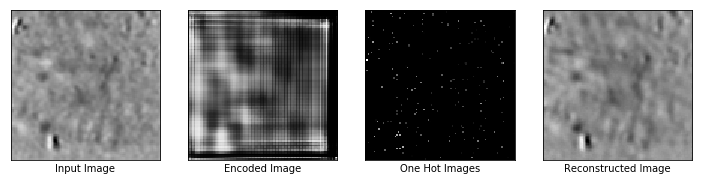

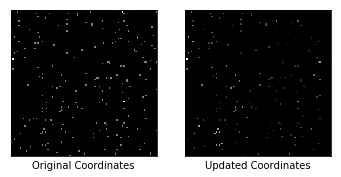

Epochs: 1370, Reconstruction Loss: 0.00048707108362577856
Similarity Loss: 0.08452250808477402
Max Similarity scores: 0.8823148012161255
Updated Coordinates: [[[0.44386235 0.55567455]]]
Gradient global min:-0.00037260132376104593, max:0.0002712247660383582
Gradient partial min:-0.10477090626955032, max:0.11522240191698074



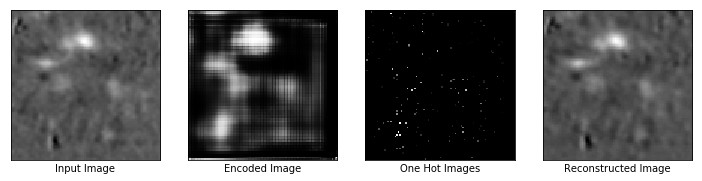

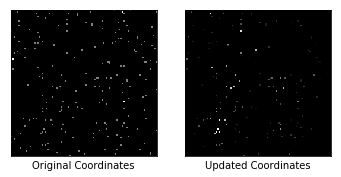

Epochs: 1380, Reconstruction Loss: 0.0004903823137283325
Similarity Loss: 0.08373319357633591
Max Similarity scores: 0.8366170525550842
Updated Coordinates: [[[0.4438529 0.5556784]]]
Gradient global min:-0.00045693962601944804, max:0.0006646367255598307
Gradient partial min:-0.10555548965930939, max:0.11480259895324707



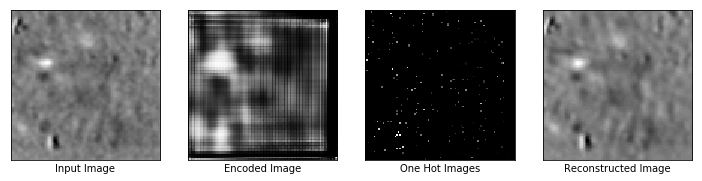

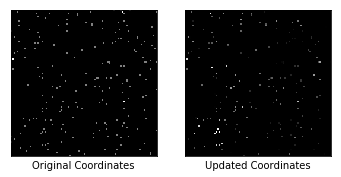

Epochs: 1390, Reconstruction Loss: 0.0005333754816092551
Similarity Loss: 0.09725971519947052
Max Similarity scores: 0.9311395883560181
Updated Coordinates: [[[0.4438403  0.55568385]]]
Gradient global min:-0.0011768843978643417, max:0.0015489901416003704
Gradient partial min:-0.1142909899353981, max:0.1273772120475769



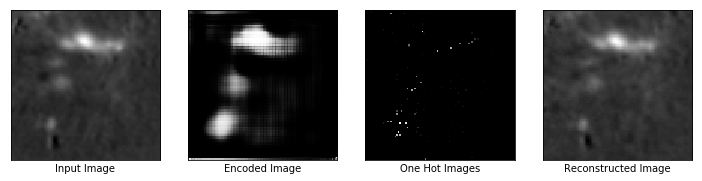

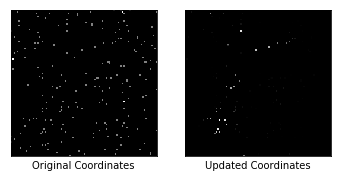

Epochs: 1400, Reconstruction Loss: 0.0005630235536955297
Similarity Loss: 0.08956858515739441
Max Similarity scores: 0.9073092341423035
Updated Coordinates: [[[0.4438282 0.5556922]]]
Gradient global min:-0.00048051043995656073, max:0.00037473952397704124
Gradient partial min:-0.10221295803785324, max:0.11563635617494583



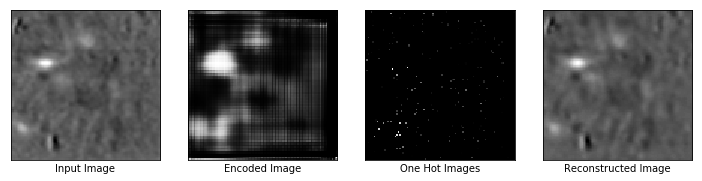

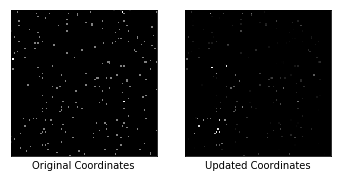

Epochs: 1410, Reconstruction Loss: 0.0005313793080858886
Similarity Loss: 0.0876830667257309
Max Similarity scores: 0.9235607385635376
Updated Coordinates: [[[0.4438249 0.5556934]]]
Gradient global min:-0.0026202015578746796, max:0.0022698326501995325
Gradient partial min:-0.0986422747373581, max:0.1126929223537445



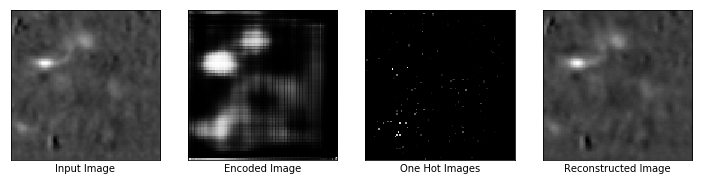

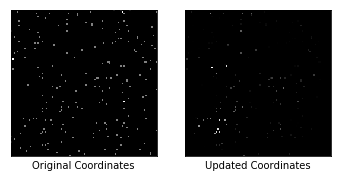

Epochs: 1420, Reconstruction Loss: 0.0004965712432749569
Similarity Loss: 0.08944154530763626
Max Similarity scores: 0.9281306266784668
Updated Coordinates: [[[0.4438229 0.5556932]]]
Gradient global min:-0.0007498119957745075, max:0.0004237063112668693
Gradient partial min:-0.10067732632160187, max:0.11374610662460327



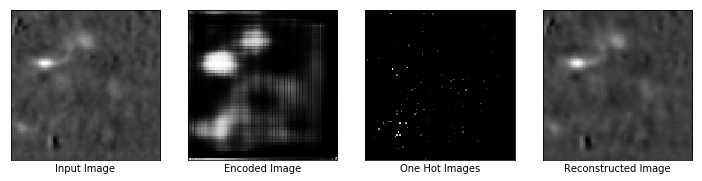

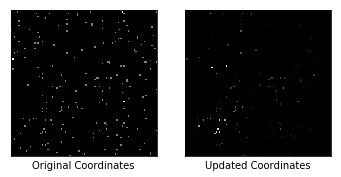

Epochs: 1430, Reconstruction Loss: 0.0004882637003902346
Similarity Loss: 0.0929635763168335
Max Similarity scores: 0.929478108882904
Updated Coordinates: [[[0.44381768 0.5556956 ]]]
Gradient global min:-0.0012231790460646152, max:0.0008111453498713672
Gradient partial min:-0.1038408949971199, max:0.11662913858890533



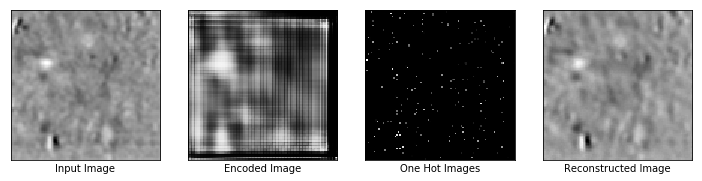

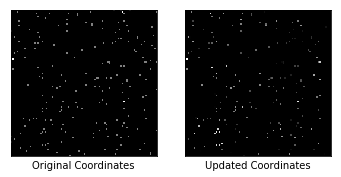

Epochs: 1440, Reconstruction Loss: 0.0004626330337487161
Similarity Loss: 0.09052659571170807
Max Similarity scores: 0.8897832632064819
Updated Coordinates: [[[0.44381186 0.5557    ]]]
Gradient global min:-0.003087330609560013, max:0.0022386726923286915
Gradient partial min:-0.10370491445064545, max:0.11444941908121109



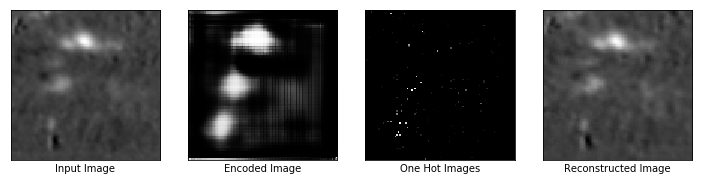

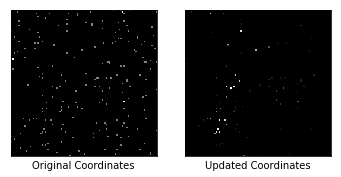

Epochs: 1450, Reconstruction Loss: 0.0005864915437996387
Similarity Loss: 0.08939589560031891
Max Similarity scores: 0.8978227376937866
Updated Coordinates: [[[0.44380468 0.5557037 ]]]
Gradient global min:-0.0018441400025039911, max:0.0010212133638560772
Gradient partial min:-0.09844794124364853, max:0.11190476268529892



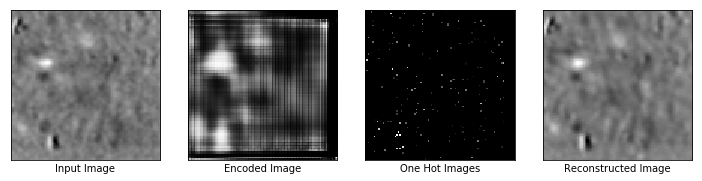

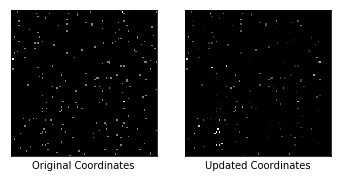

Epochs: 1460, Reconstruction Loss: 0.000608358473982662
Similarity Loss: 0.08689189702272415
Max Similarity scores: 0.9296287894248962
Updated Coordinates: [[[0.44380203 0.5557061 ]]]
Gradient global min:-0.0007647582679055631, max:0.0004928950220346451
Gradient partial min:-0.09256172925233841, max:0.10644641518592834



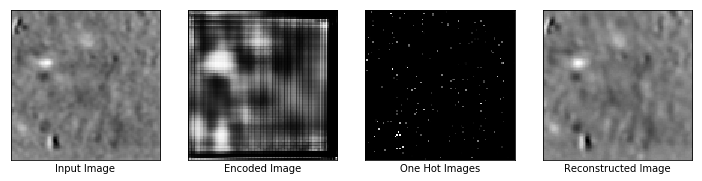

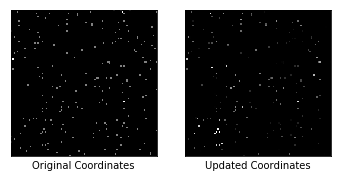

Epochs: 1470, Reconstruction Loss: 0.0005739506450481713
Similarity Loss: 0.09665675461292267
Max Similarity scores: 0.9307495355606079
Updated Coordinates: [[[0.44379482 0.55571216]]]
Gradient global min:-0.00037629654980264604, max:0.00038020723150111735
Gradient partial min:-0.09769200533628464, max:0.11495997756719589



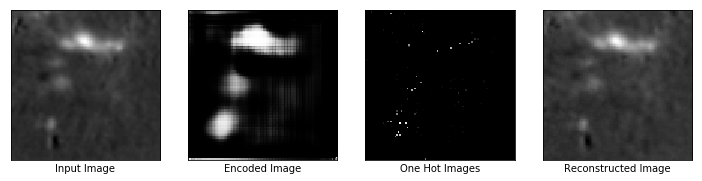

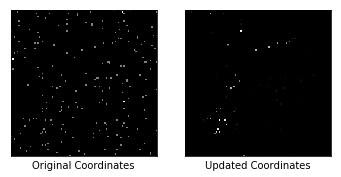

Epochs: 1480, Reconstruction Loss: 0.0005102491704747081
Similarity Loss: 0.09411709755659103
Max Similarity scores: 0.92239910364151
Updated Coordinates: [[[0.44379202 0.555714  ]]]
Gradient global min:-0.0010058451443910599, max:0.000797982036601752
Gradient partial min:-0.09809450805187225, max:0.11164383590221405



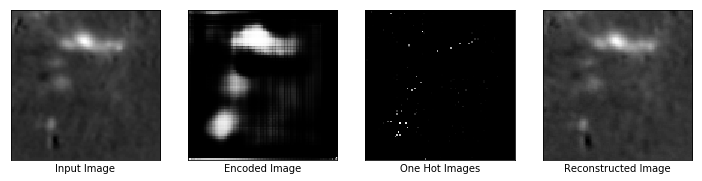

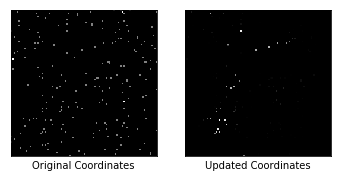

Epochs: 1490, Reconstruction Loss: 0.00047055125469341874
Similarity Loss: 0.09390304982662201
Max Similarity scores: 0.9155052900314331
Updated Coordinates: [[[0.44379035 0.5557162 ]]]
Gradient global min:-0.0006933439872227609, max:0.0005031798500567675
Gradient partial min:-0.10064123570919037, max:0.1118214800953865



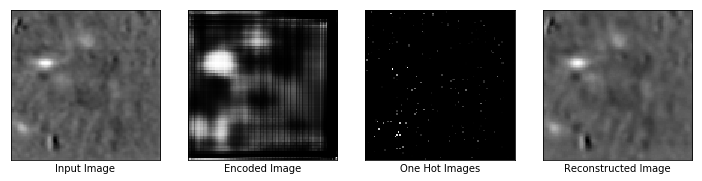

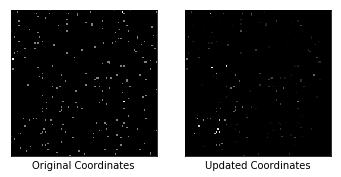

Epochs: 1500, Reconstruction Loss: 0.0004580645472742617
Similarity Loss: 0.09145400673151016
Max Similarity scores: 0.9218506217002869
Updated Coordinates: [[[0.4437868 0.5557176]]]
Gradient global min:-0.0018238339107483625, max:0.0017688379157334566
Gradient partial min:-0.10126182436943054, max:0.11170437186956406



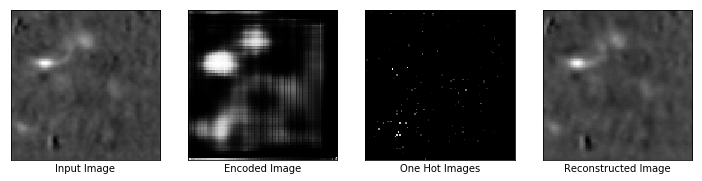

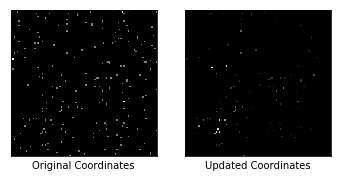

Epochs: 1510, Reconstruction Loss: 0.0006710785673931241
Similarity Loss: 0.09882977604866028
Max Similarity scores: 0.9350845813751221
Updated Coordinates: [[[0.44378003 0.55572087]]]
Gradient global min:-0.0011823271634057164, max:0.0007811055984348059
Gradient partial min:-0.10111076384782791, max:0.11506042629480362



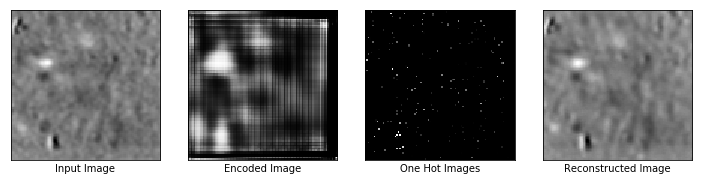

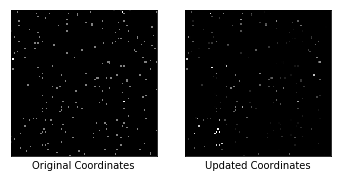

Epochs: 1520, Reconstruction Loss: 0.0006583270733244717
Similarity Loss: 0.08347214013338089
Max Similarity scores: 0.9236778020858765
Updated Coordinates: [[[0.44377294 0.5557238 ]]]
Gradient global min:-0.00020581396529451013, max:0.00030308187706395984
Gradient partial min:-0.09358537942171097, max:0.1016513854265213



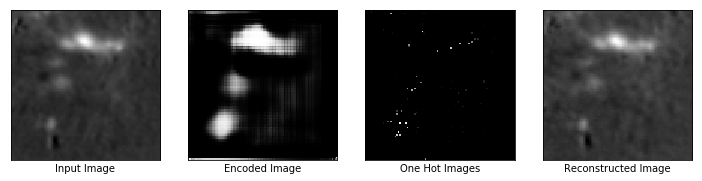

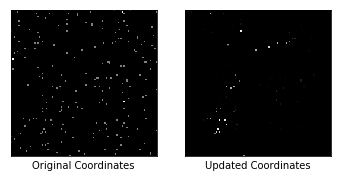

Epochs: 1530, Reconstruction Loss: 0.0006309133605100214
Similarity Loss: 0.09812270849943161
Max Similarity scores: 0.9289802312850952
Updated Coordinates: [[[0.44375962 0.5557323 ]]]
Gradient global min:-0.0010650662006810308, max:0.0007042863289825618
Gradient partial min:-0.09761958569288254, max:0.1120796799659729



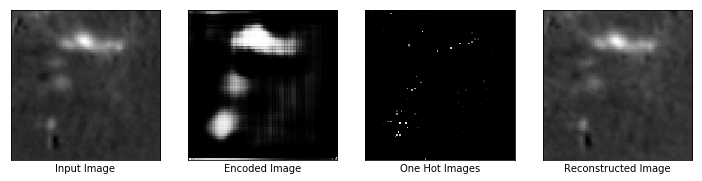

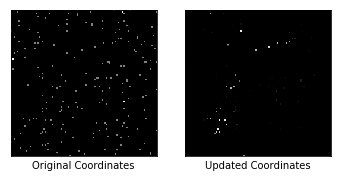

Epochs: 1540, Reconstruction Loss: 0.0005829007131978869
Similarity Loss: 0.10009308904409409
Max Similarity scores: 0.9234174489974976
Updated Coordinates: [[[0.4437527  0.55573726]]]
Gradient global min:-0.0008775134338065982, max:0.000543063273653388
Gradient partial min:-0.10017504543066025, max:0.11531255394220352



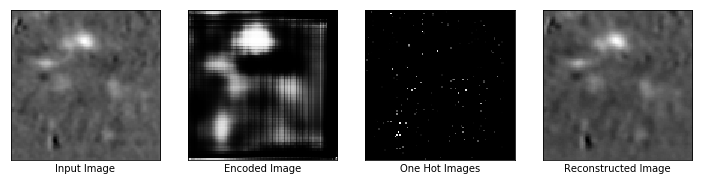

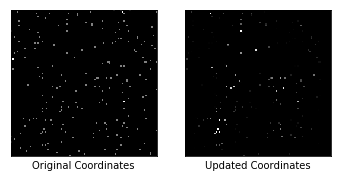

Epochs: 1550, Reconstruction Loss: 0.0008725652587600052
Similarity Loss: 0.09812755137681961
Max Similarity scores: 0.893808126449585
Updated Coordinates: [[[0.44374585 0.55574137]]]
Gradient global min:-0.0016558361239731312, max:0.0009889460634440184
Gradient partial min:-0.0962657481431961, max:0.11160193383693695



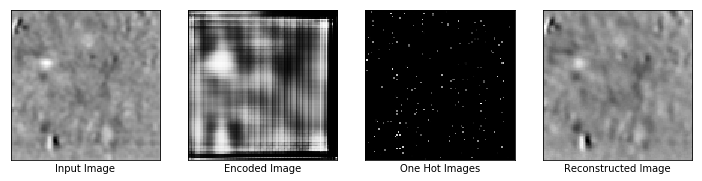

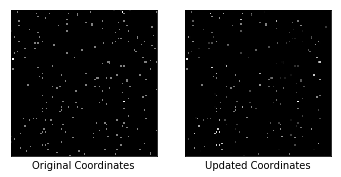

Epochs: 1560, Reconstruction Loss: 0.0006266643758863211
Similarity Loss: 0.10833293199539185
Max Similarity scores: 0.9299683570861816
Updated Coordinates: [[[0.44373745 0.5557481 ]]]
Gradient global min:-0.0026494499761611223, max:0.003060269868001342
Gradient partial min:-0.10591470450162888, max:0.119468092918396



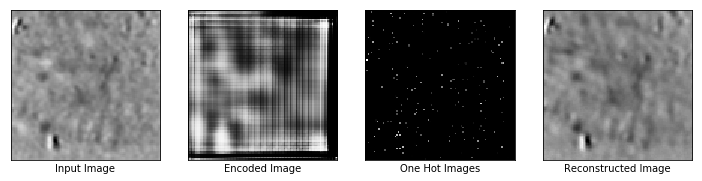

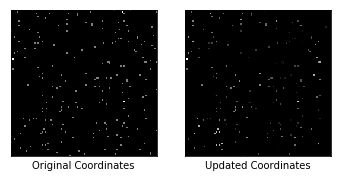

Epochs: 1570, Reconstruction Loss: 0.0006133744027465582
Similarity Loss: 0.1148783415555954
Max Similarity scores: 0.942253828048706
Updated Coordinates: [[[0.44372573 0.5557566 ]]]
Gradient global min:-0.00026943281409330666, max:0.0002175456756958738
Gradient partial min:-0.1110445186495781, max:0.12614940106868744



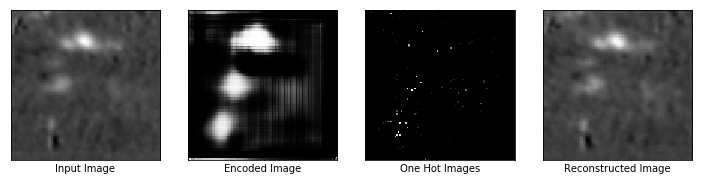

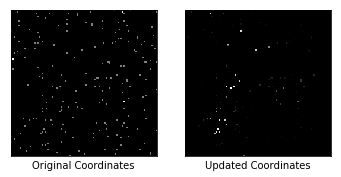

Epochs: 1580, Reconstruction Loss: 0.0005534845986403525
Similarity Loss: 0.1116742193698883
Max Similarity scores: 0.9400585293769836
Updated Coordinates: [[[0.44371864 0.5557583 ]]]
Gradient global min:-0.0007971944869495928, max:0.0010394412092864513
Gradient partial min:-0.11156240850687027, max:0.12681670486927032



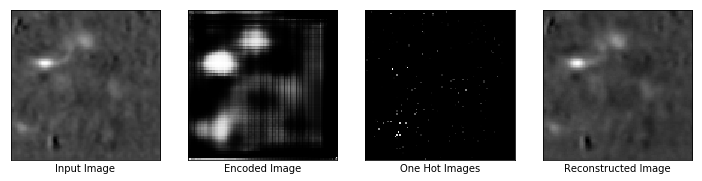

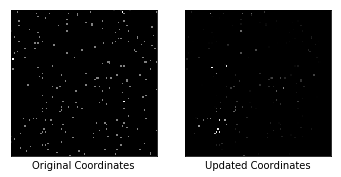

Epochs: 1590, Reconstruction Loss: 0.00048723682994022965
Similarity Loss: 0.1103501245379448
Max Similarity scores: 0.9482913613319397
Updated Coordinates: [[[0.44370848 0.55576456]]]
Gradient global min:-0.0002570131910033524, max:0.00029417616315186024
Gradient partial min:-0.11237587779760361, max:0.12759612500667572



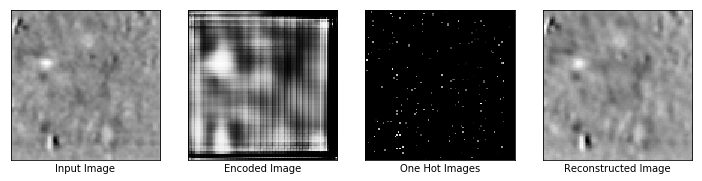

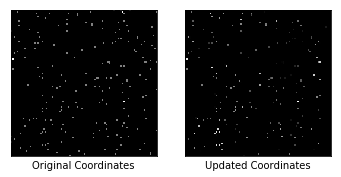

Epochs: 1600, Reconstruction Loss: 0.0005708251846954226
Similarity Loss: 0.10895510017871857
Max Similarity scores: 0.9344810247421265
Updated Coordinates: [[[0.4437005 0.555771 ]]]
Gradient global min:-0.0030568086076527834, max:0.0031465310603380203
Gradient partial min:-0.11688561737537384, max:0.13087262213230133



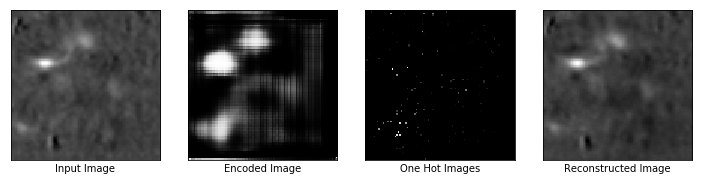

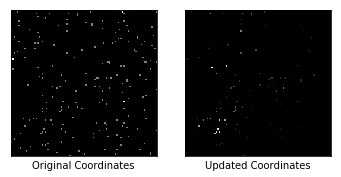

Epochs: 1610, Reconstruction Loss: 0.0006357526872307062
Similarity Loss: 0.10923183709383011
Max Similarity scores: 0.9629123210906982
Updated Coordinates: [[[0.44369403 0.55577594]]]
Gradient global min:-0.0003477818099781871, max:0.0005655580316670239
Gradient partial min:-0.11655260622501373, max:0.13070502877235413



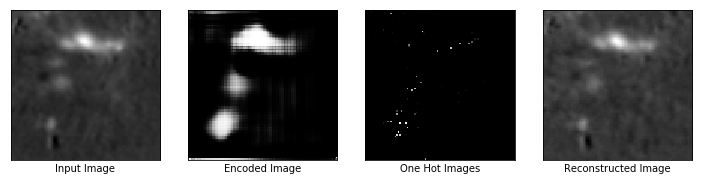

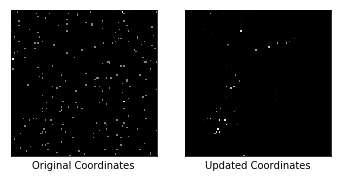

Epochs: 1620, Reconstruction Loss: 0.0006619070773012936
Similarity Loss: 0.08770545572042465
Max Similarity scores: 0.9452542066574097
Updated Coordinates: [[[0.4436909 0.5557791]]]
Gradient global min:-0.0007336877752095461, max:0.0009858924895524979
Gradient partial min:-0.10667948424816132, max:0.11739406734704971



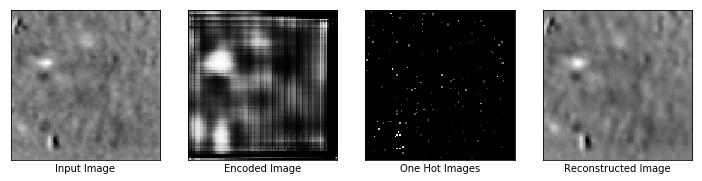

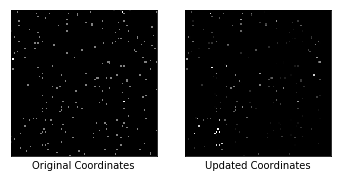

Epochs: 1630, Reconstruction Loss: 0.0006164786173030734
Similarity Loss: 0.09245693683624268
Max Similarity scores: 0.953703761100769
Updated Coordinates: [[[0.44368938 0.55578   ]]]
Gradient global min:-0.0008409732254222035, max:0.0011374749010428786
Gradient partial min:-0.11130017042160034, max:0.12279536575078964



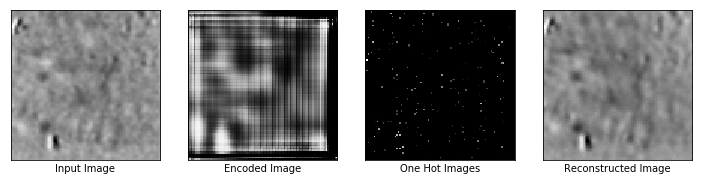

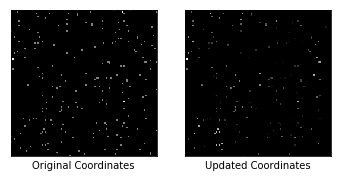

Epochs: 1640, Reconstruction Loss: 0.0005982332513667643
Similarity Loss: 0.09877792000770569
Max Similarity scores: 0.9279289841651917
Updated Coordinates: [[[0.44368306 0.55578434]]]
Gradient global min:-0.0003832673537544906, max:0.0005172262899577618
Gradient partial min:-0.11100244522094727, max:0.1256495714187622



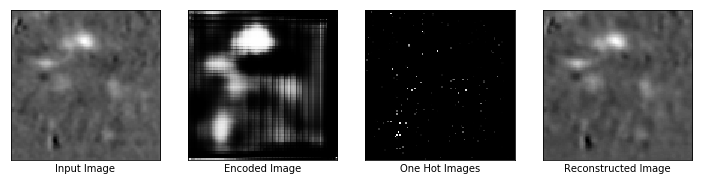

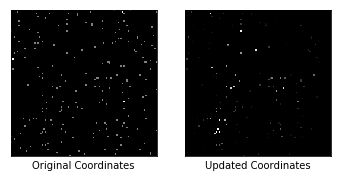

Epochs: 1650, Reconstruction Loss: 0.0010788887739181519
Similarity Loss: 0.10590810328722
Max Similarity scores: 0.9121092557907104
Updated Coordinates: [[[0.44367933 0.55578715]]]
Gradient global min:-0.0016582440584897995, max:0.0010535938199609518
Gradient partial min:-0.1150771826505661, max:0.13227783143520355



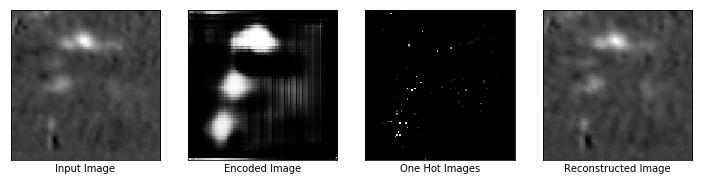

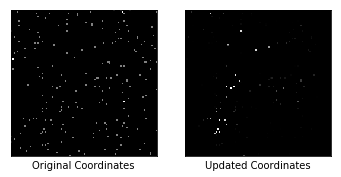

Epochs: 1660, Reconstruction Loss: 0.0008644962217658758
Similarity Loss: 0.1134856715798378
Max Similarity scores: 0.9628312587738037
Updated Coordinates: [[[0.4436731  0.55579096]]]
Gradient global min:-0.002530520549044013, max:0.0029194524977356195
Gradient partial min:-0.11733050644397736, max:0.1358303427696228



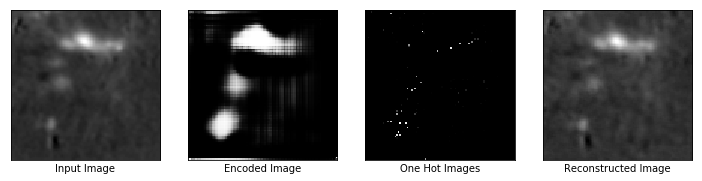

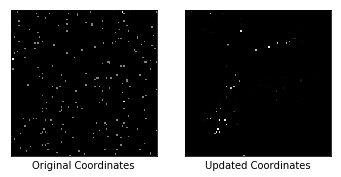

Epochs: 1670, Reconstruction Loss: 0.0008834422915242612
Similarity Loss: 0.11095699667930603
Max Similarity scores: 0.9660117030143738
Updated Coordinates: [[[0.44367045 0.55579287]]]
Gradient global min:-0.0017961683915928006, max:0.0020100411493331194
Gradient partial min:-0.12198993563652039, max:0.13768383860588074



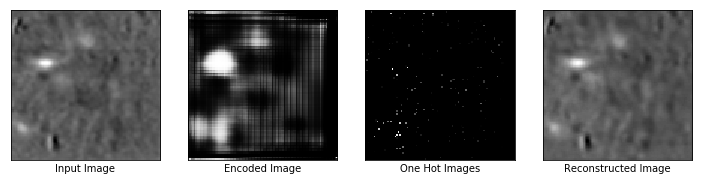

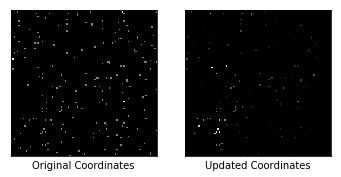

Epochs: 1680, Reconstruction Loss: 0.0009711175807751715
Similarity Loss: 0.10753069072961807
Max Similarity scores: 0.9761350750923157
Updated Coordinates: [[[0.44366902 0.5557943 ]]]
Gradient global min:-0.0024776170030236244, max:0.002554291160777211
Gradient partial min:-0.1170601174235344, max:0.13136199116706848



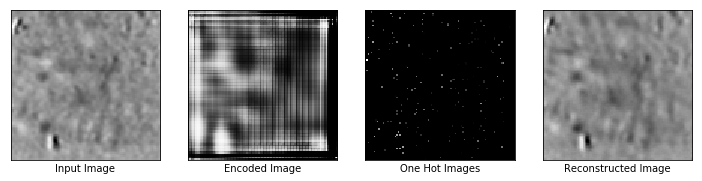

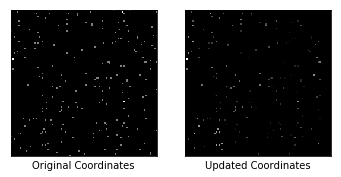

Epochs: 1690, Reconstruction Loss: 0.000585288624279201
Similarity Loss: 0.1046416237950325
Max Similarity scores: 0.9421402215957642
Updated Coordinates: [[[0.4436686 0.5557948]]]
Gradient global min:-0.0002794429019559175, max:0.000254143204074353
Gradient partial min:-0.12258399277925491, max:0.1356588900089264



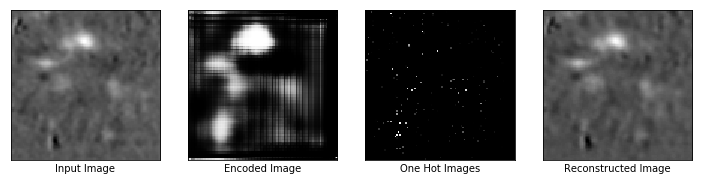

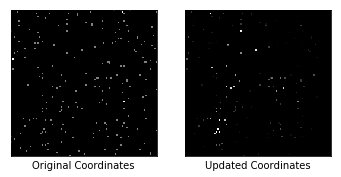

Epochs: 1700, Reconstruction Loss: 0.0004894823650829494
Similarity Loss: 0.10960476100444794
Max Similarity scores: 0.9164038300514221
Updated Coordinates: [[[0.44366536 0.55579704]]]
Gradient global min:-0.00032027289853431284, max:0.00037457715370692313
Gradient partial min:-0.12324491143226624, max:0.13796856999397278



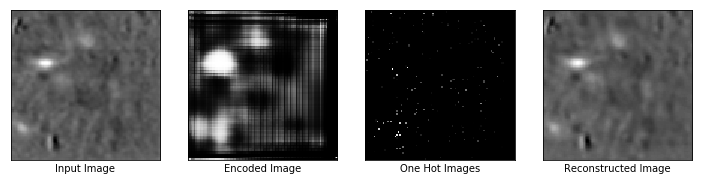

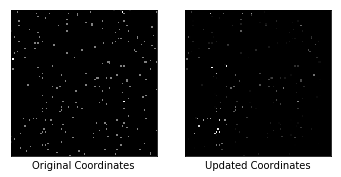

Epochs: 1710, Reconstruction Loss: 0.0006127984961494803
Similarity Loss: 0.12693630158901215
Max Similarity scores: 0.977432906627655
Updated Coordinates: [[[0.44365782 0.555799  ]]]
Gradient global min:-0.002699912991374731, max:0.0018961707828566432
Gradient partial min:-0.13056108355522156, max:0.15048840641975403



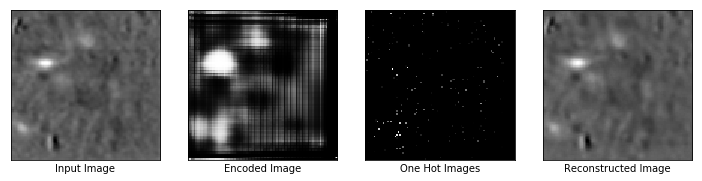

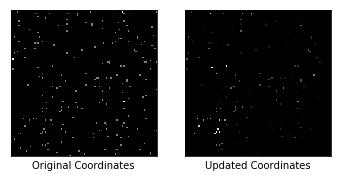

Epochs: 1720, Reconstruction Loss: 0.0005991761572659016
Similarity Loss: 0.12932239472866058
Max Similarity scores: 0.9779290556907654
Updated Coordinates: [[[0.44364864 0.5558016 ]]]
Gradient global min:-0.0019009152892977, max:0.0019916524179279804
Gradient partial min:-0.1294557899236679, max:0.15009652078151703



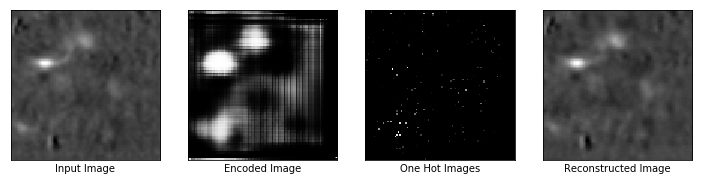

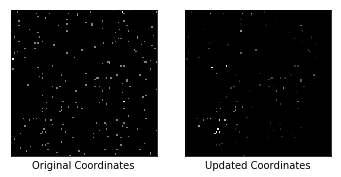

Epochs: 1730, Reconstruction Loss: 0.0007317652925848961
Similarity Loss: 0.1506575495004654
Max Similarity scores: 0.9781686067581177
Updated Coordinates: [[[0.44364136 0.5558047 ]]]
Gradient global min:-0.0007869353285059333, max:0.0013032220304012299
Gradient partial min:-0.13482765853405, max:0.16259267926216125



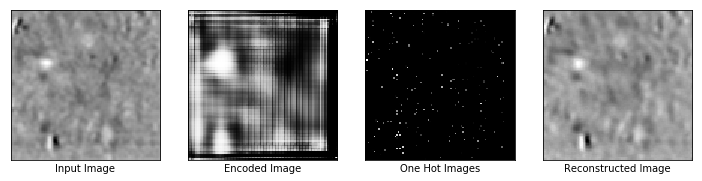

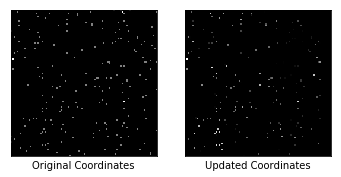

Epochs: 1740, Reconstruction Loss: 0.0007404711213894188
Similarity Loss: 0.10514944791793823
Max Similarity scores: 0.967350959777832
Updated Coordinates: [[[0.44363287 0.5558091 ]]]
Gradient global min:-0.002949383109807968, max:0.0030325085390359163
Gradient partial min:-0.12363500893115997, max:0.14114193618297577



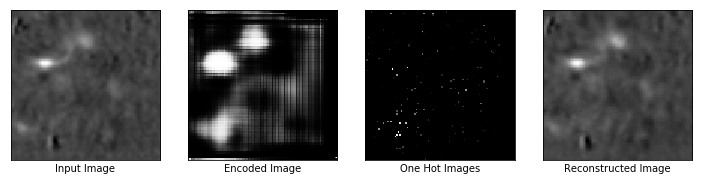

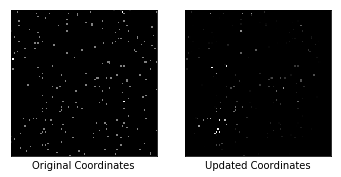

Epochs: 1750, Reconstruction Loss: 0.0007177816587500274
Similarity Loss: 0.15112930536270142
Max Similarity scores: 0.9831616878509521
Updated Coordinates: [[[0.4436276  0.55580884]]]
Gradient global min:-0.0014195400290191174, max:0.002103249542415142
Gradient partial min:-0.13874050974845886, max:0.16329018771648407



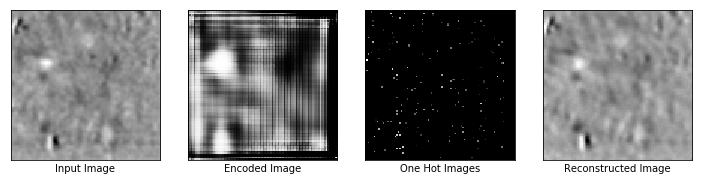

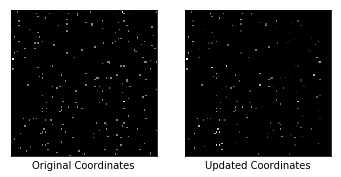

Epochs: 1760, Reconstruction Loss: 0.0008875043713487685
Similarity Loss: 0.10766234993934631
Max Similarity scores: 0.9684060215950012
Updated Coordinates: [[[0.4436231  0.55581075]]]
Gradient global min:-0.007670503109693527, max:0.010848360136151314
Gradient partial min:-0.12438856065273285, max:0.1400144249200821



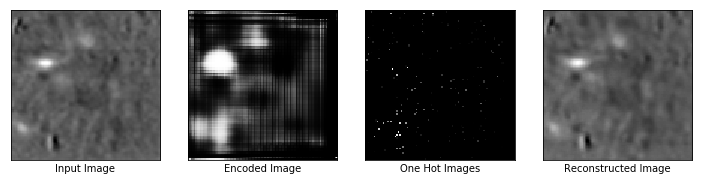

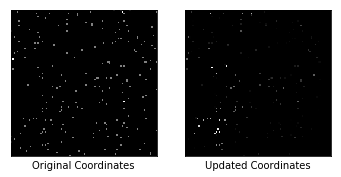

Epochs: 1770, Reconstruction Loss: 0.0007075655157677829
Similarity Loss: 0.124068483710289
Max Similarity scores: 0.9830905199050903
Updated Coordinates: [[[0.44361693 0.55581355]]]
Gradient global min:-0.002175218891352415, max:0.002214346546679735
Gradient partial min:-0.13565000891685486, max:0.1559842824935913



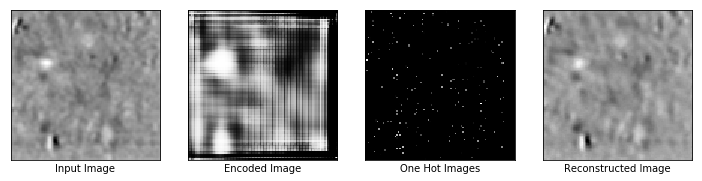

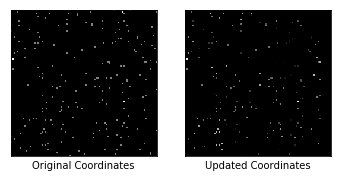

Epochs: 1780, Reconstruction Loss: 0.0005575059913098812
Similarity Loss: 0.13289842009544373
Max Similarity scores: 0.9761821031570435
Updated Coordinates: [[[0.44361106 0.5558153 ]]]
Gradient global min:-0.006113777868449688, max:0.00881847646087408
Gradient partial min:-0.13964006304740906, max:0.16344279050827026



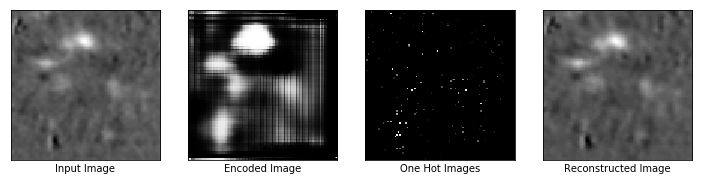

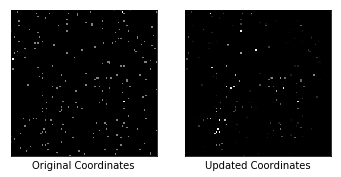

Epochs: 1790, Reconstruction Loss: 0.00047157873632386327
Similarity Loss: 0.14547139406204224
Max Similarity scores: 0.9472864866256714
Updated Coordinates: [[[0.44360018 0.555823  ]]]
Gradient global min:-0.00038817449240013957, max:0.0006271594320423901
Gradient partial min:-0.13767512142658234, max:0.16845208406448364



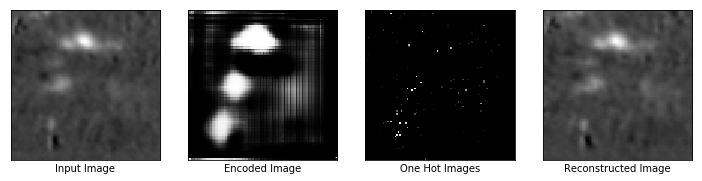

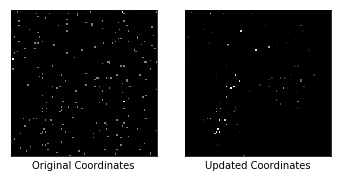

Epochs: 1800, Reconstruction Loss: 0.00048824018449522555
Similarity Loss: 0.15515923500061035
Max Similarity scores: 0.9870637059211731
Updated Coordinates: [[[0.4435884  0.55582947]]]
Gradient global min:-0.00024400438996963203, max:0.0002806728589348495
Gradient partial min:-0.14030255377292633, max:0.17306740581989288



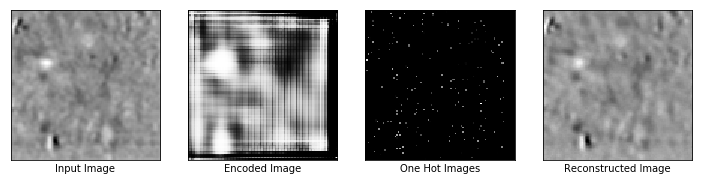

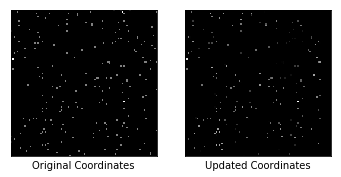

Epochs: 1810, Reconstruction Loss: 0.0006590201519429684
Similarity Loss: 0.17192968726158142
Max Similarity scores: 0.9860304594039917
Updated Coordinates: [[[0.4435759 0.5558347]]]
Gradient global min:-0.006743026897311211, max:0.004597396124154329
Gradient partial min:-0.15734057128429413, max:0.18811507523059845



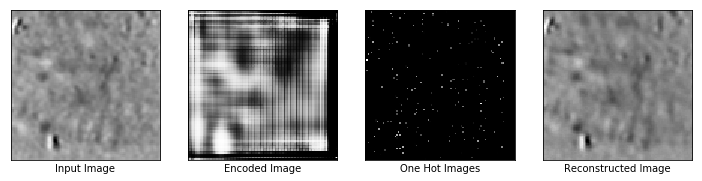

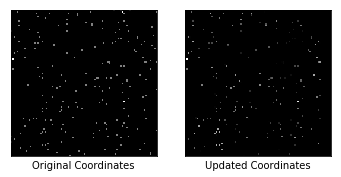

Epochs: 1820, Reconstruction Loss: 0.00055758620146662
Similarity Loss: 0.15016920864582062
Max Similarity scores: 0.9775252938270569
Updated Coordinates: [[[0.44356775 0.55583805]]]
Gradient global min:-0.00028198276413604617, max:0.00026351335691288114
Gradient partial min:-0.14295534789562225, max:0.17234647274017334



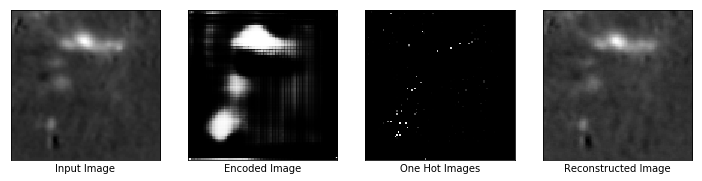

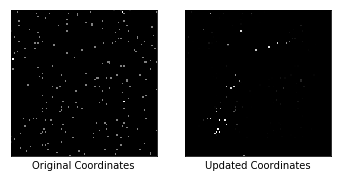

Epochs: 1830, Reconstruction Loss: 0.0005659072194248438
Similarity Loss: 0.13321055471897125
Max Similarity scores: 0.97630774974823
Updated Coordinates: [[[0.44355577 0.55584764]]]
Gradient global min:-0.0007657943060621619, max:0.000871111114975065
Gradient partial min:-0.14003965258598328, max:0.1647360771894455



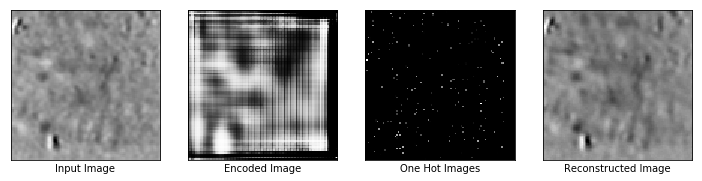

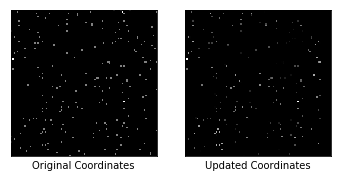

Epochs: 1840, Reconstruction Loss: 0.0005425114650279284
Similarity Loss: 0.14920438826084137
Max Similarity scores: 0.9792532324790955
Updated Coordinates: [[[0.4435448 0.5558558]]]
Gradient global min:-0.00020594321540556848, max:0.00021646961977239698
Gradient partial min:-0.13631916046142578, max:0.16825000941753387



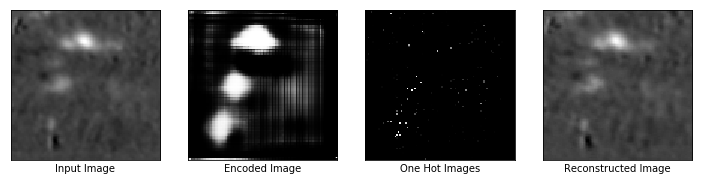

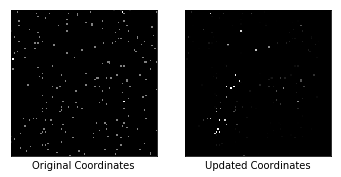

Epochs: 1850, Reconstruction Loss: 0.0005865489947609603
Similarity Loss: 0.1464468240737915
Max Similarity scores: 0.9881236553192139
Updated Coordinates: [[[0.4435354 0.5558625]]]
Gradient global min:-0.0018322485266253352, max:0.002008213195949793
Gradient partial min:-0.13794347643852234, max:0.16685517132282257



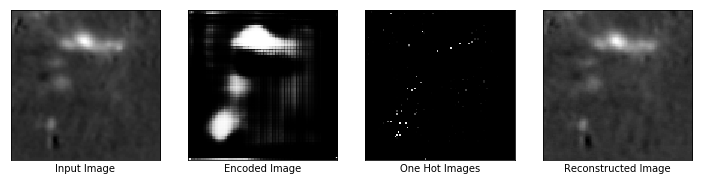

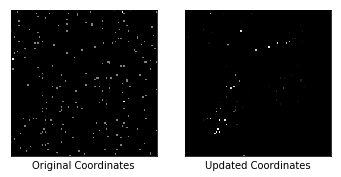

Epochs: 1860, Reconstruction Loss: 0.00045474033686332405
Similarity Loss: 0.12980113923549652
Max Similarity scores: 0.9718517661094666
Updated Coordinates: [[[0.44352403 0.55587184]]]
Gradient global min:-0.00030199383036233485, max:0.00041568547021597624
Gradient partial min:-0.1361079216003418, max:0.16176657378673553



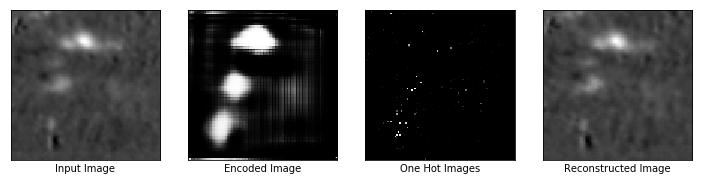

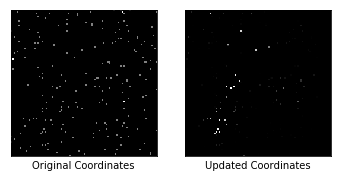

Epochs: 1870, Reconstruction Loss: 0.0005005369312129915
Similarity Loss: 0.12352710962295532
Max Similarity scores: 0.987067699432373
Updated Coordinates: [[[0.44351882 0.5558746 ]]]
Gradient global min:-0.0008895373321138322, max:0.0006445315666496754
Gradient partial min:-0.1341642290353775, max:0.15769611299037933



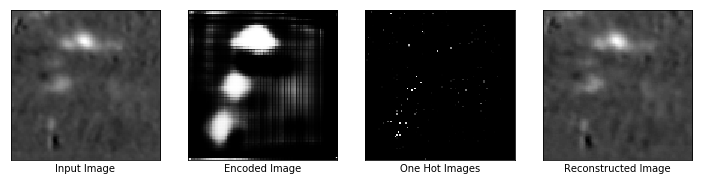

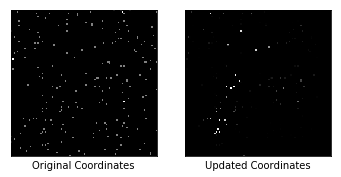

Epochs: 1880, Reconstruction Loss: 0.0005006343708373606
Similarity Loss: 0.14377900958061218
Max Similarity scores: 0.9896332025527954
Updated Coordinates: [[[0.4435079 0.5558818]]]
Gradient global min:-0.0008375670877285302, max:0.000693207373842597
Gradient partial min:-0.14058253169059753, max:0.1683841198682785



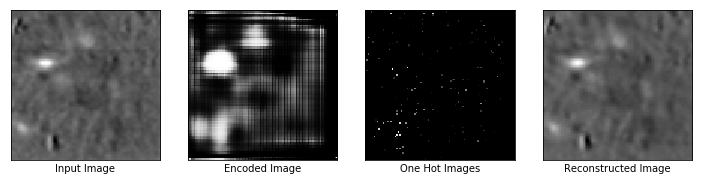

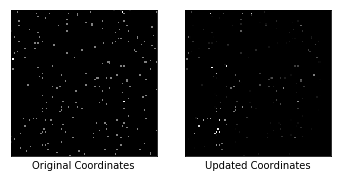

Epochs: 1890, Reconstruction Loss: 0.00048290000995621085
Similarity Loss: 0.1472688615322113
Max Similarity scores: 0.9912734627723694
Updated Coordinates: [[[0.4434929 0.5558945]]]
Gradient global min:-0.002289269119501114, max:0.0014905098360031843
Gradient partial min:-0.14480580389499664, max:0.1736028790473938



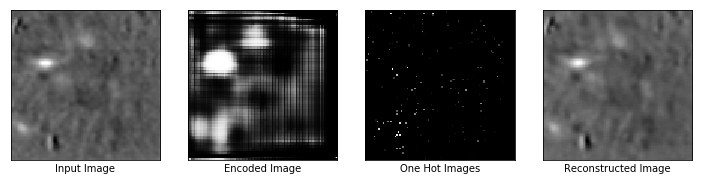

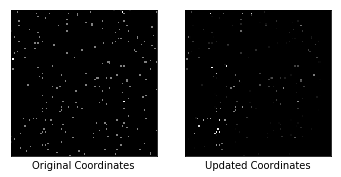

Epochs: 1900, Reconstruction Loss: 0.0004833644488826394
Similarity Loss: 0.15423695743083954
Max Similarity scores: 0.9927700757980347
Updated Coordinates: [[[0.4434806  0.55590445]]]
Gradient global min:-0.0018517642747610807, max:0.001432662014849484
Gradient partial min:-0.1510598361492157, max:0.18276771903038025



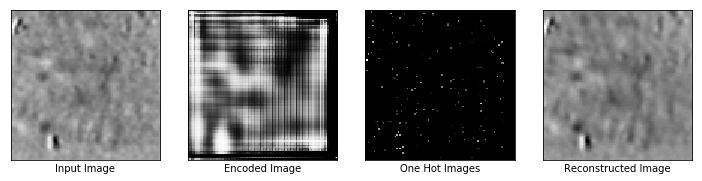

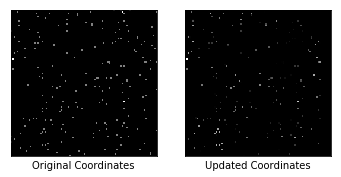

Epochs: 1910, Reconstruction Loss: 0.0005052278283983469
Similarity Loss: 0.1260598599910736
Max Similarity scores: 0.9714921712875366
Updated Coordinates: [[[0.44347396 0.55590755]]]
Gradient global min:-0.00030471233185380697, max:0.00027134170522913337
Gradient partial min:-0.12804724276065826, max:0.16234906017780304



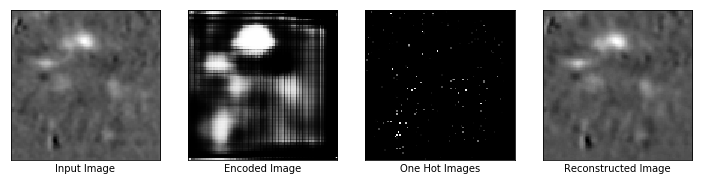

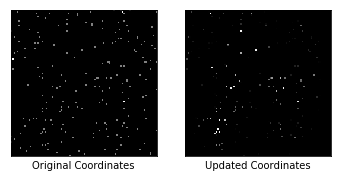

Epochs: 1920, Reconstruction Loss: 0.0005172812379896641
Similarity Loss: 0.1497371643781662
Max Similarity scores: 0.9766176342964172
Updated Coordinates: [[[0.44346425 0.55592436]]]
Gradient global min:-0.000659494660794735, max:0.00039212522096931934
Gradient partial min:-0.13731051981449127, max:0.18459287285804749



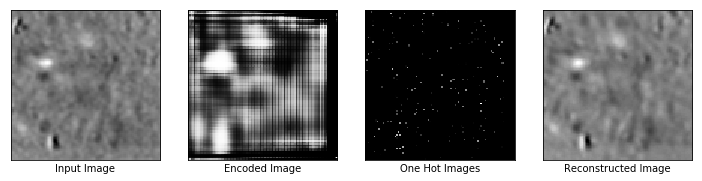

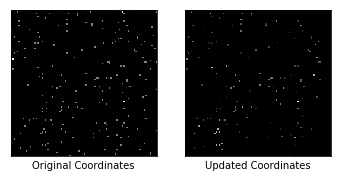

Epochs: 1930, Reconstruction Loss: 0.00046059838496148586
Similarity Loss: 0.1561371386051178
Max Similarity scores: 0.9762028455734253
Updated Coordinates: [[[0.4434588 0.5559303]]]
Gradient global min:-0.0006869060453027487, max:0.000517920299898833
Gradient partial min:-0.14051461219787598, max:0.1911948025226593



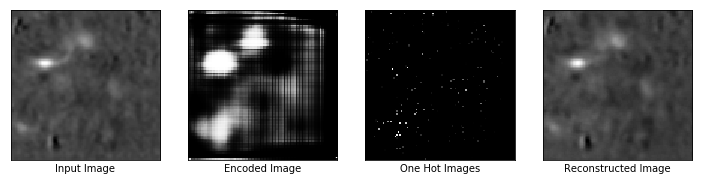

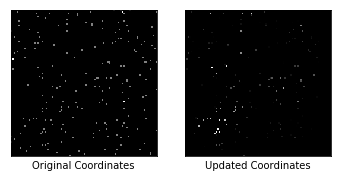

Epochs: 1940, Reconstruction Loss: 0.0009122676565311849
Similarity Loss: 0.1874995082616806
Max Similarity scores: 0.9928795695304871
Updated Coordinates: [[[0.44345194 0.5559377 ]]]
Gradient global min:-0.003547142958268523, max:0.0034020873717963696
Gradient partial min:-0.1565854847431183, max:0.2092723399400711



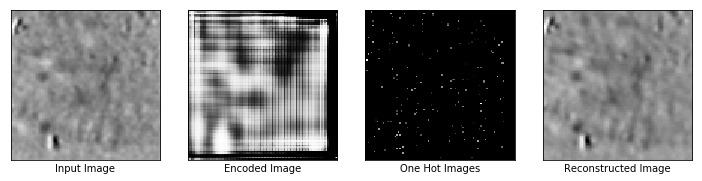

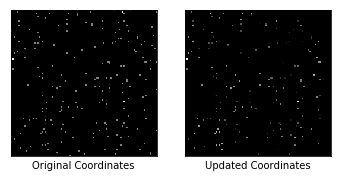

Epochs: 1950, Reconstruction Loss: 0.0005175744881853461
Similarity Loss: 0.17494945228099823
Max Similarity scores: 0.9850874543190002
Updated Coordinates: [[[0.4434463 0.555944 ]]]
Gradient global min:-0.00025152027956210077, max:0.0003394039813429117
Gradient partial min:-0.14769452810287476, max:0.20435349643230438



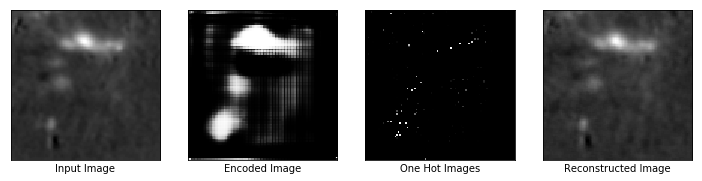

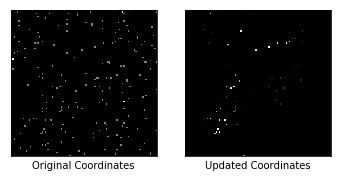

Epochs: 1960, Reconstruction Loss: 0.0005231589311733842
Similarity Loss: 0.16315053403377533
Max Similarity scores: 0.9799779057502747
Updated Coordinates: [[[0.4434378  0.55595297]]]
Gradient global min:-0.0004443626676220447, max:0.0006773563800379634
Gradient partial min:-0.14644037187099457, max:0.20422911643981934



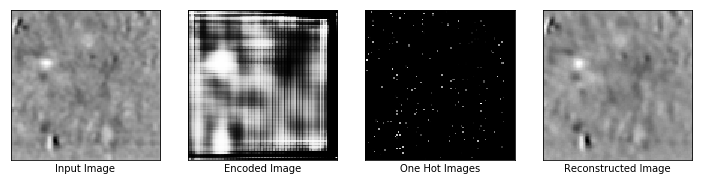

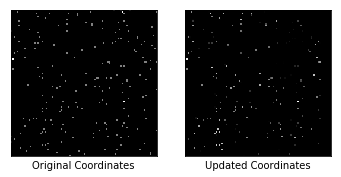

Epochs: 1970, Reconstruction Loss: 0.0005523068248294294
Similarity Loss: 0.13955537974834442
Max Similarity scores: 0.9916155934333801
Updated Coordinates: [[[0.44343486 0.5559569 ]]]
Gradient global min:-0.002754670102149248, max:0.0022993097081780434
Gradient partial min:-0.13896061480045319, max:0.1872999519109726



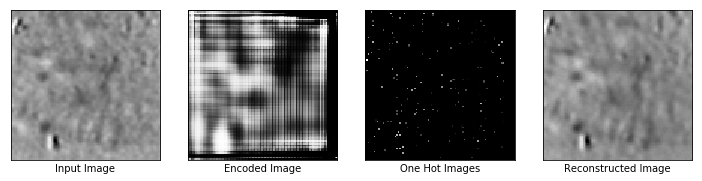

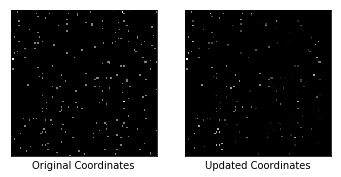

Epochs: 1980, Reconstruction Loss: 0.0006475907866843045
Similarity Loss: 0.13449113070964813
Max Similarity scores: 0.9810859560966492
Updated Coordinates: [[[0.44342753 0.5559649 ]]]
Gradient global min:-0.0002683206694200635, max:0.000233366503380239
Gradient partial min:-0.13894744217395782, max:0.1854533553123474



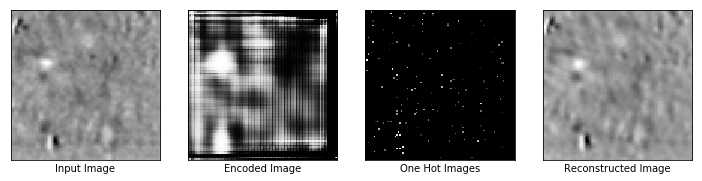

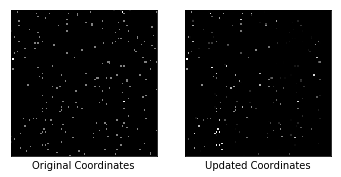

Epochs: 1990, Reconstruction Loss: 0.0006048849900253117
Similarity Loss: 0.10459484905004501
Max Similarity scores: 0.9785430431365967
Updated Coordinates: [[[0.44342014 0.555974  ]]]
Gradient global min:-0.005363056436181068, max:0.005266959313303232
Gradient partial min:-0.1249387264251709, max:0.1590987890958786



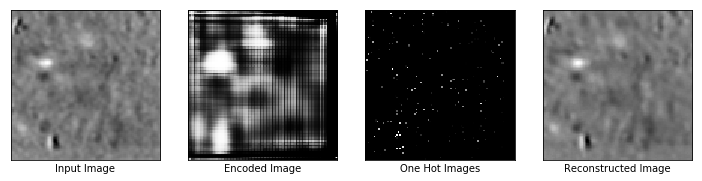

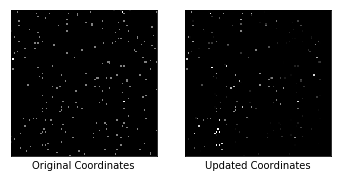

Epochs: 2000, Reconstruction Loss: 0.0005709177348762751
Similarity Loss: 0.12744462490081787
Max Similarity scores: 0.9854533672332764
Updated Coordinates: [[[0.44341555 0.55598   ]]]
Gradient global min:-0.0008217402501031756, max:0.0012313500046730042
Gradient partial min:-0.13412225246429443, max:0.1883561760187149


In [22]:
batch_imgs= tf.data.Dataset.from_tensor_slices(re_list).batch(BATCH_SIZE, drop_remainder=True)

#list to be append to output 
loss_list_global = []
loss_list_encoded_one_hot = []
input_imgs = []
coords_list = []
encoded_imgs = []
reconstructed_imgs = []
one_hot_imgs_list = []
similarity_list = []

captions_01 = ['Input Image', 'Encoded Image', 'One Hot Images','Reconstructed Image']
captions_02 = ['Original Coordinates', 'Updated Coordinates']

#list to append to monitor each frames for the last epochs 
one_hot_imgs_last_list = []
encoder_output_last_list = []
similarity_score_last_list = []
reconstruction_last_list = []

epochs = 1
while epochs <= MAX_EPOCHS:
    #reset coords for each epochs
#     coords,_, ori_one_hot_imgs = create_dat_samples(n_neurons)
#     coords = tf.reshape(coords, [n_neurons, 1,1,2])
    for steps, batched_imgs in enumerate(batch_imgs):
        loss, updated_coords, one_hot_imgs, encoder_output, similarity_score, reconstruction, grad = train_fn(batched_imgs, coords, IMG_SIZE, BATCH_SIZE)
        #append all frames for final epochs!
        if epochs==MAX_EPOCHS:
            one_hot_imgs_last_list.append(one_hot_imgs)
            encoder_output_last_list.append(encoder_output)
            similarity_score_last_list.append(similarity_score)
            reconstruction_last_list.append(reconstruction)
    #loss is append for each epochs
    loss_list_global.append(loss[0])
    loss_list_encoded_one_hot.append(loss[1])
    
    rand = randint(0, BATCH_SIZE-1) #random number to generate for plotting outputs 
    if epochs%10==0:
        img_row01 = [batched_imgs[rand], encoder_output[rand], similarity_multi(n_neurons, one_hot_imgs, similarity_score[rand], IMG_SIZE), reconstruction[rand]]
        img_row02 = [stack4plot(ori_one_hot_imgs), similarity_multi(n_neurons, one_hot_imgs, similarity_score[rand], IMG_SIZE)]
        plot_comparison(img_row01, captions_01, n_col=len(img_row01), figsize = (10, 10))
        plot_comparison(img_row02, captions_02, n_col=len(img_row02))
        print("Epochs: {}, Reconstruction Loss: {}".format(epochs, loss[0].numpy()))
        print("Similarity Loss: {}".format(loss[1].numpy()))
        print("Max Similarity scores: {}".format(np.max(similarity_score[rand])))
        print("Updated Coordinates: {}".format(updated_coords[0]))
        print("Gradient global min:{}, max:{}".format(np.min(grad[0][rand]), np.max(grad[0][rand])))
        print("Gradient partial min:{}, max:{}".format(np.min(grad[1][0]), np.max(grad[1][0])))
    #append list for every 100 epochs 
#     if epochs%100==0:
        encoded_imgs.append(encoder_output)
        input_imgs.append(batched_imgs)
        coords_list.append(updated_coords)
        reconstructed_imgs.append(reconstruction)
        one_hot_imgs_list.append(one_hot_imgs)
        similarity_list.append(similarity_score)
        
    epochs+=1

----

# Save Output Data

In [23]:
save_list = [loss_list_global, loss_list_encoded_one_hot, input_imgs, coords_list, encoded_imgs, reconstructed_imgs, one_hot_imgs_list, similarity_list]
save_names = ['loss_list_global', 'loss_list_encoded_one_hot', 'input_imgs', 'coords_list', 'encoded_imgs', 'reconstructed_imgs', 'one_hot_imgs_list', 'similarity_list']

directory = '/home/kevinteng/Desktop/npy/{}'.format(ver)
#make directory to save
if not os.path.exists(directory):
    os.makedirs(directory)
    
for names, items in zip(save_names, save_list):
    tensor = tf.convert_to_tensor(items, tf.float32)
    np.save(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, names, ver), np.array(tensor))
    

In [24]:
#save coords and one hot images()
np.save(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'ori_coords', ver), np.array(coords))
np.save(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'ori_one_hot_imgs', ver), np.array(ori_one_hot_imgs))

In [25]:
#save info for every frames in last epochs
save_list_last = [encoder_output_last_list, similarity_score_last_list, reconstruction_last_list]
save_names_last = ['encoder_output_last_list', 'similarity_score_last_list', 'reconstruction_last_list']

for names, items in zip(save_names_last, save_list_last):
    aggregate_tensor = utils.concat_batch(items)
    np.save(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, names, ver), np.array(aggregate_tensor))

In [26]:
#save one hot imgs for last epochs 
tensor = tf.convert_to_tensor(one_hot_imgs_last_list, tf.float32) #(frames/batch, n_neurons, img_size, img_size, 1)
np.save(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'one_hot_imgs_last_list', ver), np.array(tensor))

In [50]:
#save weights
encoder_model.save_weights('model_weights/encoder_model_{}.h5'.format(ver))
decoder_model.save_weights('model_weights/decoder_model_{}.h5'.format(ver))

---

# Visualization

In [28]:
# coords list for every 100 epochs (max_epochs/100, n_neurons, 1, 1, 2)
coords_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'coords_list', ver)) 
# encoder output first batch for every 100 epochs (max_epochs/100, 8, 100, 100, 1)
encoded_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'encoded_imgs', ver))
# input image first batch for every 100 epochs (max_epochs/100, 8, 100, 100, 1)
input_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'input_imgs', ver))
# global loss for every epochs
loss_list_global_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'loss_list_global', ver))
#similarity loss for every epochs
loss_list_encoded_one_hot_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'loss_list_encoded_one_hot', ver))
# one hot images first batch for every 100 epochs  (max_epochs/100, n_neurons, 100, 100, 1)
one_hot_imgs_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'one_hot_imgs_list', ver))
# reconstructed images first batch for every 100 epochs (max_epochs/100, 8, 100, 100, 1)
reconstructed_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'reconstructed_imgs', ver))
# similarity batch for every 100 epochs (max_epochs/100, 8, n_neurons)
similarity_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'similarity_list', ver))
#original coords list (n_neurons, 1, 1, 2)
ori_coords_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'ori_coords', ver))
#original one hot image (n_neurons, 100, 100, 1)
ori_one_hot_imgs_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'ori_one_hot_imgs', ver))

In [29]:
#load roi mask
roi_img = np.load('/home/kevinteng/Desktop/Manual_annotation/DG-13-3-8-17_ROImask.npy')
roi_img = cv2.resize(roi_img, (100, 100))
# plt.imshow(roi_img, cmap = 'gray')

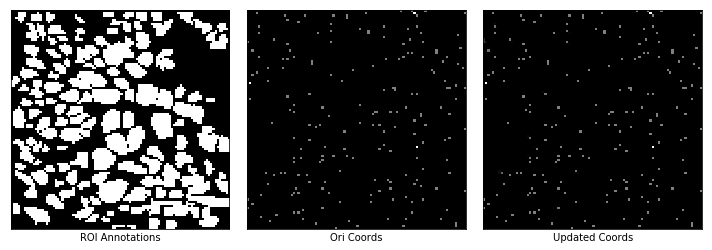

In [30]:
#comparison of roi and one hot images 
captions_03 = ['ROI Annotations', 'Ori Coords', 'Updated Coords']
img_row03 = [roi_img, stack4plot(ori_one_hot_imgs_npy), stack4plot(one_hot_imgs_list_npy[-1])]
plot_comparison(img_row03, captions_03, n_col=len(img_row03), figsize = (10, 10))

Mean value:  0.02
Counts:  200


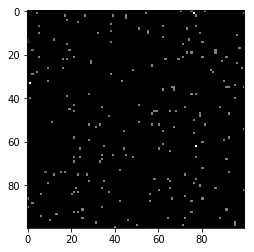

In [31]:
sum_updated_coords = stack4plot(one_hot_imgs_list_npy[-1])
print("Mean value: ", np.mean(sum_updated_coords))
updated_coords_img = np.where(sum_updated_coords<0.1, 0, sum_updated_coords) 
activations_count = np.count_nonzero(updated_coords_img!=0)
print("Counts: ", activations_count)
plt.imshow(updated_coords_img, cmap = 'gray')

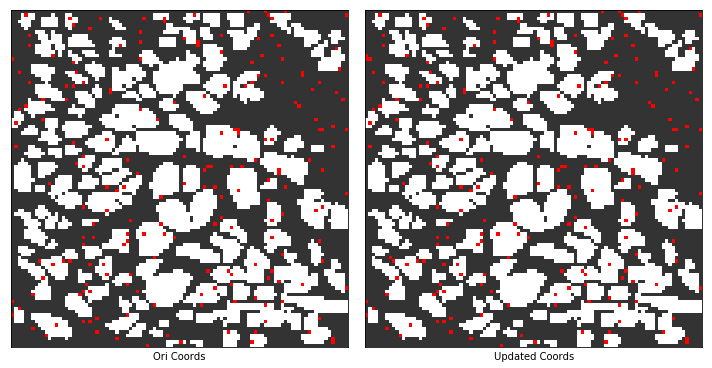

In [32]:
#define color
col = [(0.2, 0.2, 0.2),(1,1,1),(1,0,0)] 
cm = LinearSegmentedColormap.from_list('mylist', col, 3)  
#     #Bins for cmap
bounds=[0,1,5,10]
norm = BoundaryNorm(bounds, cm.N)
#overlap mask with original coordinates 
roi_ori_mask = overlapMasks02(roi_img, stack4plot(ori_one_hot_imgs_npy))

#overlap mask with updated coordinates 
roi_updated_mask = overlapMasks02(roi_img, updated_coords_img)

captions_04 = ['Ori Coords', 'Updated Coords']
img_row04 = [roi_ori_mask, roi_updated_mask]
plot_comparison(img_row04, captions_04, n_col=len(img_row04), figsize = (10, 10), cmap = cm, norm = norm)

In [33]:
#confusion matrix 
confMatrix = utils_model.getConfusionMatrix(roi_img, updated_coords_img)

print("True Positives: ", confMatrix[0])
print("True Negatives: ", confMatrix[1])
print("False Positive Ratio: ", confMatrix[2])
print("False Negatives Ratio: ", confMatrix[3])
print("F1 score: ", utils_model.f1score(confMatrix))

True Positives:  0.0079
True Negatives:  0.0121
False Positive Ratio:  0.4107
False Negatives Ratio:  0.5692999999999999
F1 score:  0.036023711810305524


---

# Similarity Scores with Threshold

In [35]:
neuron_activations, neuron_activations_thr = similarity_multiplication(similarity_list_npy, one_hot_imgs_list_npy, 
                                                                       n_neurons, epoch_pos=-1, 
                                                                       img_size = IMG_SIZE, threshold = 0.8)

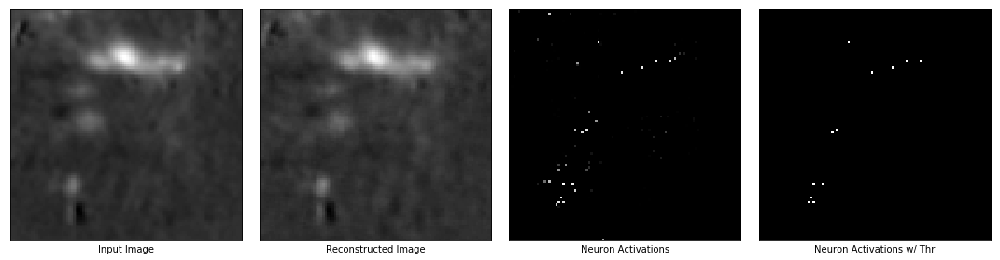

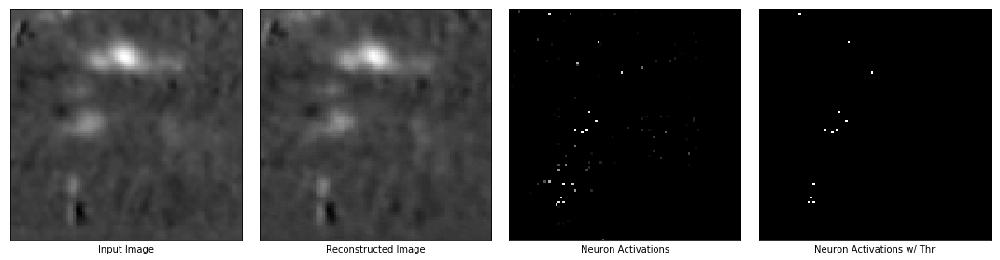

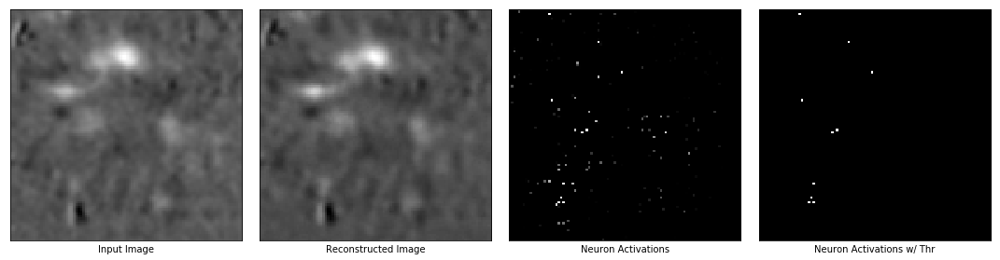

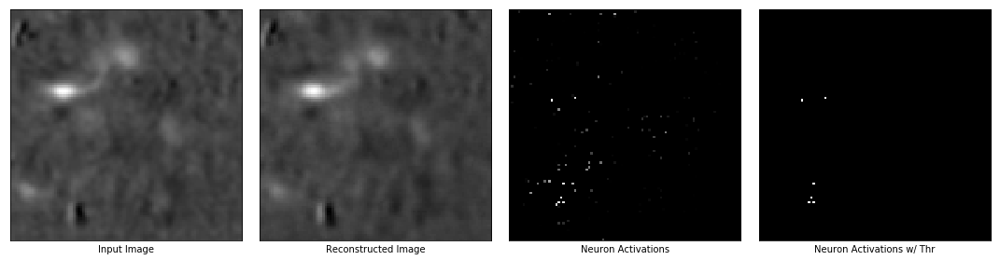

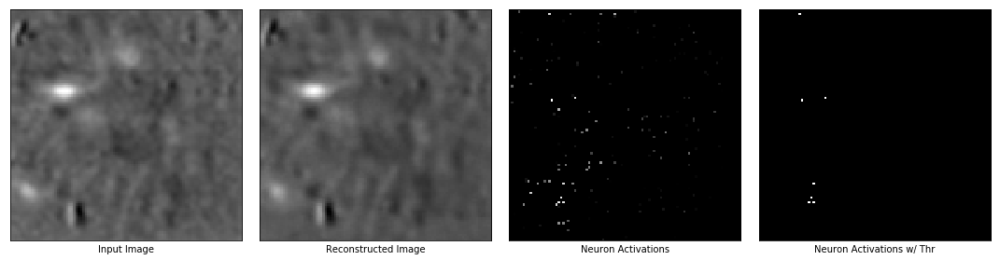

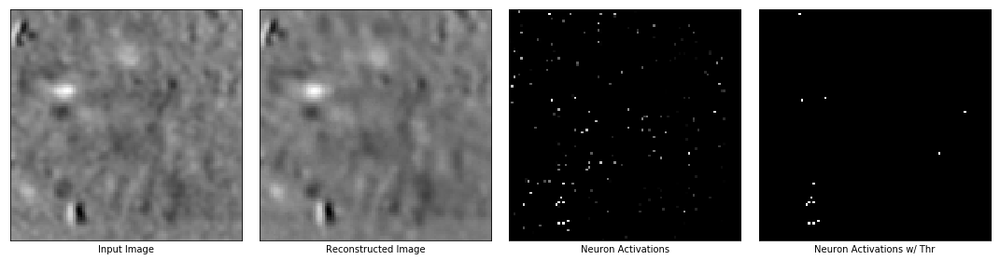

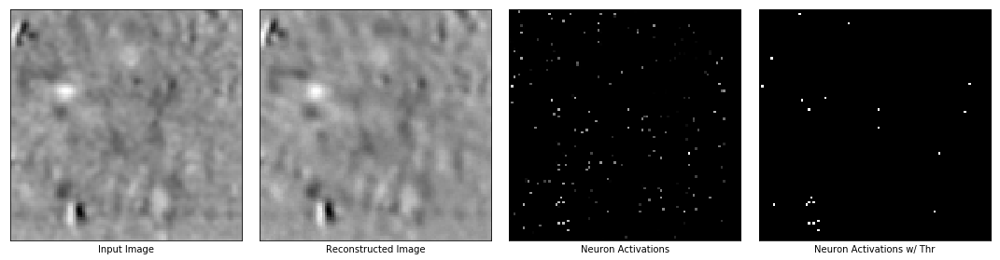

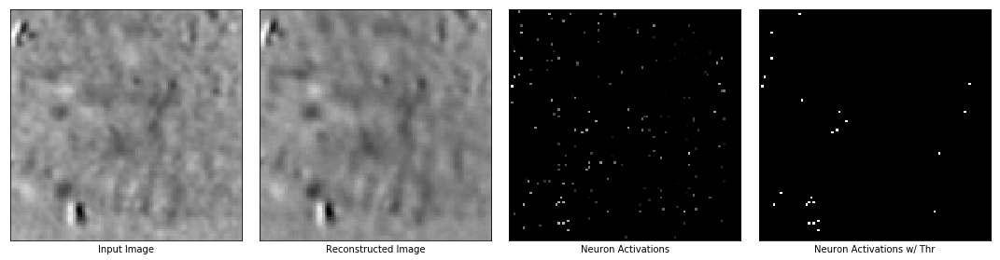

In [36]:
batch_size = BATCH_SIZE
captions_03 = ['Input Image', 'Reconstructed Image','Neuron Activations', 'Neuron Activations w/ Thr']
for i in range(batch_size):
    img_row03 = [np.squeeze(input_imgs_npy[-1,i]), np.squeeze(reconstructed_imgs_npy[-1,i]), neuron_activations[i], neuron_activations_thr[i]]
    plot_comparison(img_row03, captions_03, n_col=len(img_row03), figsize = (15, 15))

## Loss Plot

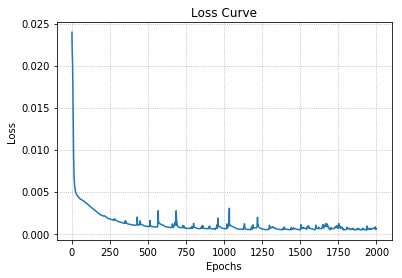

In [37]:
#plot loss
xlabel = 'Epochs'
ylabel = 'Loss'
title = 'Loss Curve'
utils_vis.plot_loss(loss_list_global_npy, xlabel, ylabel, title)

## Feature Maps

In [39]:
#build encoder 
inps = Input(shape=(IMG_SIZE, IMG_SIZE, 1))
encoder_model = Model(inps, encoder(inps, IMG_SIZE))
encoder_model.load_weights("model_weights/encoder_model_{}.h5".format(ver))
#build coord model
inp = Input(shape=(100, 100,2)) #(batch_size, img_size, img_size, 2)
de_coordconv = Model(inp, de_conv(inp))
de_coordconv.load_weights("best_class_model100_02.hdf5")

#decoder
latent_dim = Input(shape=(n_neurons, 3, 1))
decoder_model = Model(latent_dim, decoder(latent_dim))
decoder_model.load_weights("model_weights/decoder_model_{}.h5".format(ver))

#learnable coords
l_coords = learnable_coords(ori_coords_npy)

In [40]:
decoder_layers_name = utils_vis.layers_name(decoder_model) 

input_10
flatten_5
dense_2
reshape_2
up_sampling2d_16
coord_conv_16
activation_4
up_sampling2d_17
conv2d_59
activation_5
conv2d_60


In [41]:
#concat latent space as input
squeeze_coords = np.squeeze(coords_list_npy[-1]) #use the last pos
similarity_score = similarity_list_npy[-1]


concat = tf.stack((squeeze_coords[:,-2], squeeze_coords[:,-1], similarity_score[0]), axis=-1)
concat_ex = concat[np.newaxis,:,:,np.newaxis] #extand axis=0 and axis=-1 for input into model
print(concat_ex.shape)

(1, 200, 3, 1)


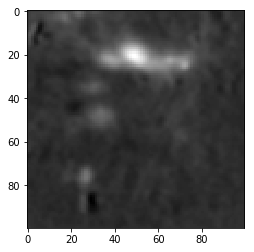

In [42]:
plt.imshow(np.squeeze(input_imgs_npy[-1,0]), cmap = 'gray')

Shape of feature maps: (1, 50, 50, 64)
Number of feature maps in layer:  64


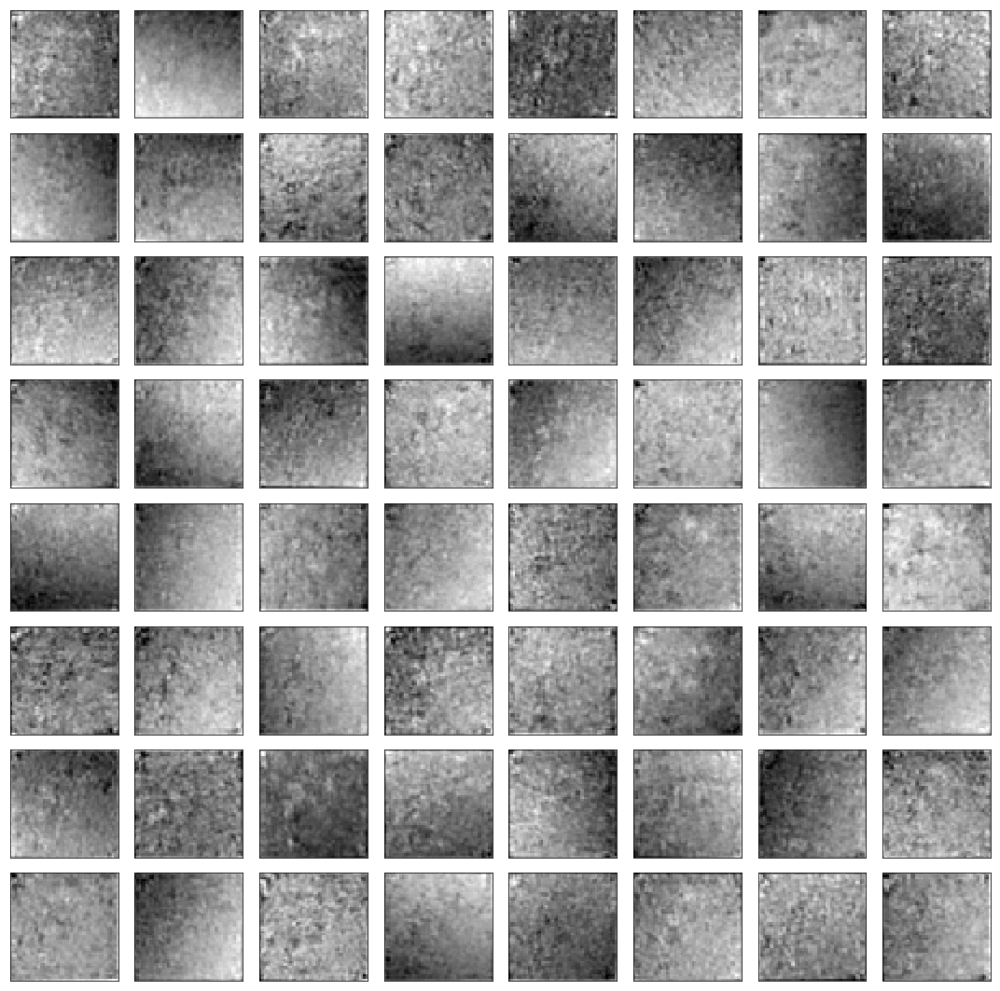

In [43]:
coord_conv_feature_maps = utils_vis.feature_maps(decoder_model, 'coord_conv_16', concat_ex)
utils_vis.plot_feature_maps(coord_conv_feature_maps, 8, 8, figsize=(15,15))

Shape of feature maps: (1, 100, 100, 32)
Number of feature maps in layer:  32


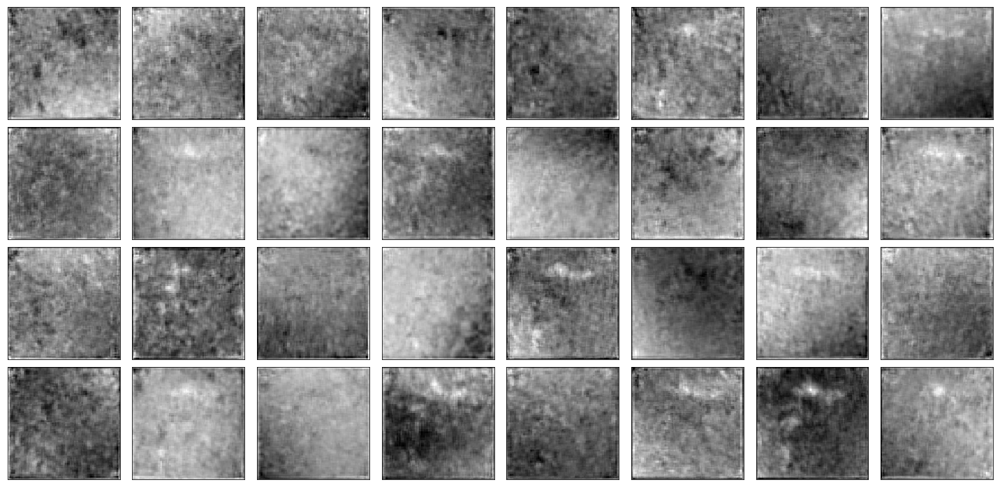

In [44]:
coord_conv_feature_maps = utils_vis.feature_maps(decoder_model, 'conv2d_59', concat_ex)
utils_vis.plot_feature_maps(coord_conv_feature_maps, 4, 8, figsize=(20,10))

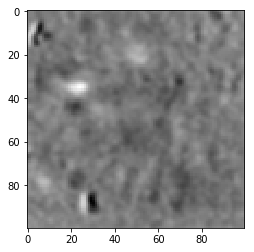

In [45]:
plt.imshow(np.squeeze(input_imgs_npy[-1,5]), cmap = 'gray')

In [46]:
#concat latent space as input
squeeze_coords = np.squeeze(coords_list_npy[-1]) #use the last pos
similarity_score = similarity_list_npy[-1]


concat = tf.stack((squeeze_coords[:,-2], squeeze_coords[:,-1], similarity_score[5]), axis=-1)
concat_ex = concat[np.newaxis,:,:,np.newaxis] #extand axis=0 and axis=-1 for input into model
print(concat_ex.shape)

(1, 200, 3, 1)


Shape of feature maps: (1, 50, 50, 64)
Number of feature maps in layer:  64


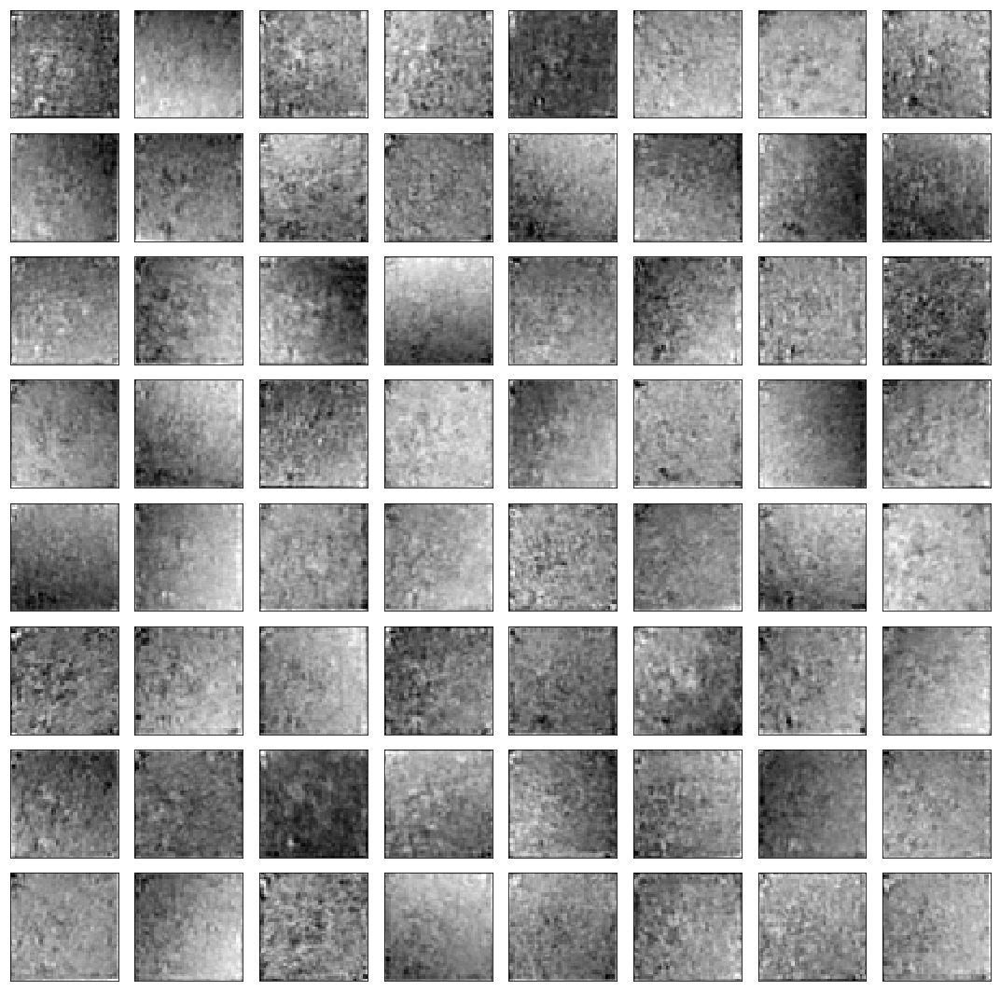

In [47]:
coord_conv_feature_maps = utils_vis.feature_maps(decoder_model, 'coord_conv_16', concat_ex)
utils_vis.plot_feature_maps(coord_conv_feature_maps, 8, 8, figsize=(15,15))

Shape of feature maps: (1, 100, 100, 32)
Number of feature maps in layer:  32


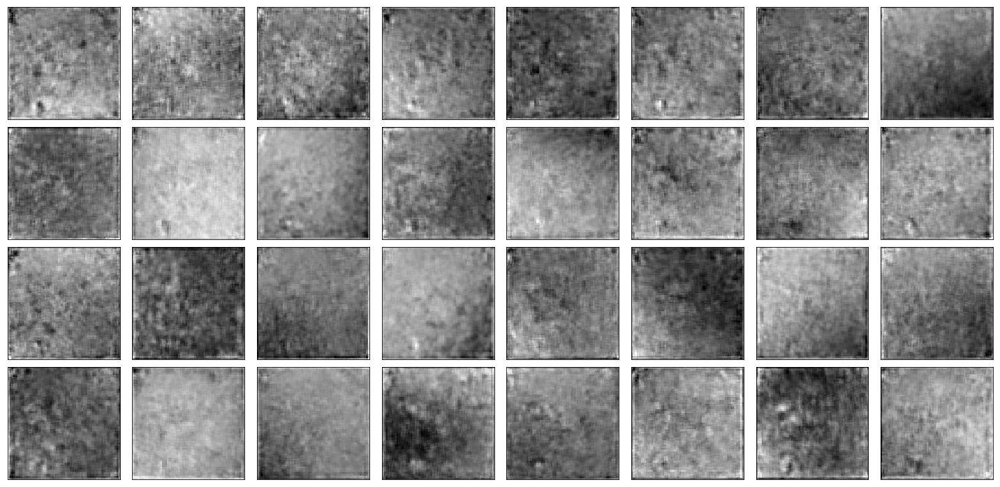

In [48]:
coord_conv_feature_maps = utils_vis.feature_maps(decoder_model, 'conv2d_59', concat_ex)
utils_vis.plot_feature_maps(coord_conv_feature_maps, 4, 8, figsize=(20,10))

---

# Visualization Per-frame

In [49]:
one_hot_imgs_last_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'one_hot_imgs_last_list', ver))
encoder_output_last_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'encoder_output_last_list', ver))
similarity_score_last_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'similarity_score_last_list', ver))
reconstruction_last_list_npy = np.load(path_desktop+'npy/{}/{}_full{}.npy'.format(ver, 'reconstruction_last_list', ver))

In [49]:

def multi_similarity_frame(one_hot_imgs_last_list_npy, similarity_score_last_list_npy, img_size, batch_size):
    '''
    Multiply similarity scores for every one hot pixel images and aggregate the one hot images into
    single frames
    
    @param one_hot_imgs_last_list_npy: .npy array of one hot images for the last epochs 
    @param similarity_score_last_list_npy: .npy array of similarity score for the last epochs
    @param img_size: image size
    @param batch_size: batch size
    
    return 
    tensor of one hot images multiplied with similarity scores for each images 
    '''
    count = 0
    onehot_list = []
    for one_hot in np.squeeze(one_hot_imgs_last_list_npy):
        if count!=len(similarity_score_last_list_npy): 
            for idx in range(count,count+batch_size): #loop through the similarity score for every batch_size increment
                sum_multi = np.zeros((img_size, img_size))
                for n in range(len(one_hot)): #n_neurons
                    multi = similarity_score_last_list_npy[idx, n]*one_hot[n]
                    sum_multi+=multi #sum all the one hot images
                onehot_list.append(sum_multi)
        count+=batch_size
        tensor = tf.convert_to_tensor(onehot_list, tf.float32)
    
    return tensor

In [50]:
tensor = multi_similarity_frame(one_hot_imgs_last_list_npy, similarity_score_last_list_npy, IMG_SIZE, BATCH_SIZE)

## Maximum Intensity Projection

In [96]:
# plt_captions = ['Original Coordinates', 'Maximum Intensity Projection']
# plt_row = [stack4plot(ori_one_hot_imgs_npy), np.where(np.sum(tensor, axis=0)<0.8, 0, 1.0)]

# plot_comparison(plt_row , plt_captions, n_col=len(plt_row), figsize = (15, 15))

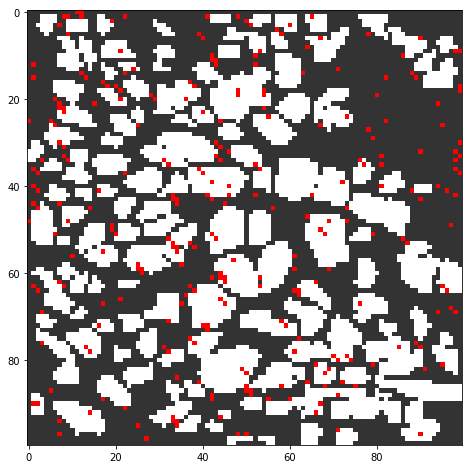

In [107]:
plt.figure(figsize=(8,8))
tensor_sum02 = np.where(np.sum(tensor, axis=0)<0.8, 0, 1.0)
roi_frame = overlapMasks02(roi_img, tensor_sum02)
plt.imshow(roi_frame, cmap = cm , norm = norm)
plt.show()

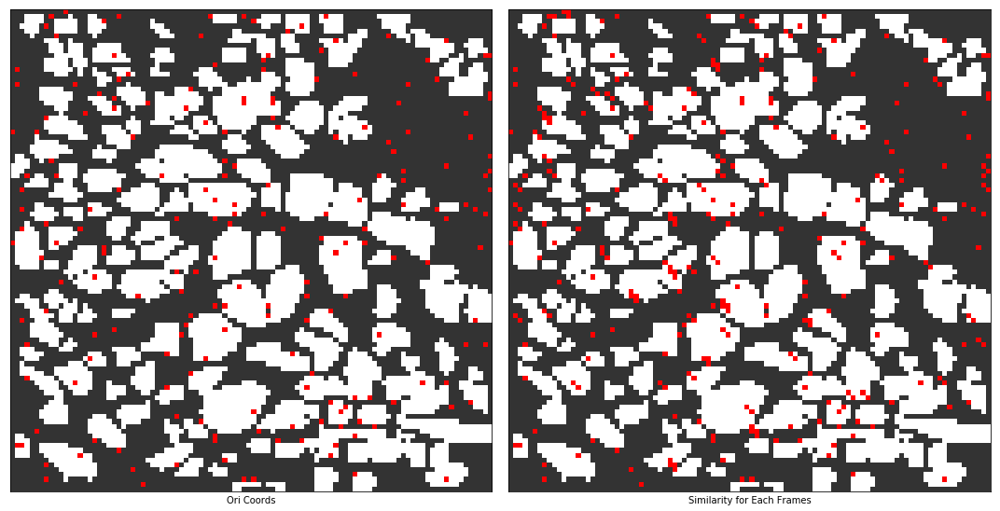

Counts:  274


In [108]:
captions_05 = ['Ori Coords', 'Similarity for Each Frames']
img_row05 = [roi_ori_mask, roi_frame]
plot_comparison(img_row05, captions_05, n_col=len(img_row05), figsize = (15, 15), cmap = cm, norm = norm)

activations_count = np.count_nonzero(tensor_sum02!=0)
print("Counts: ", activations_count)